In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pyarrow.feather as feather
import gymnasium as gym
from gymnasium import spaces
import random
import time
from collections import deque
from tensorflow import keras
from tensorflow.keras import layers
from textwrap import wrap

C:\Users\kahre\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
df = pd.read_pickle("s_clean_2017CIC.pickle")

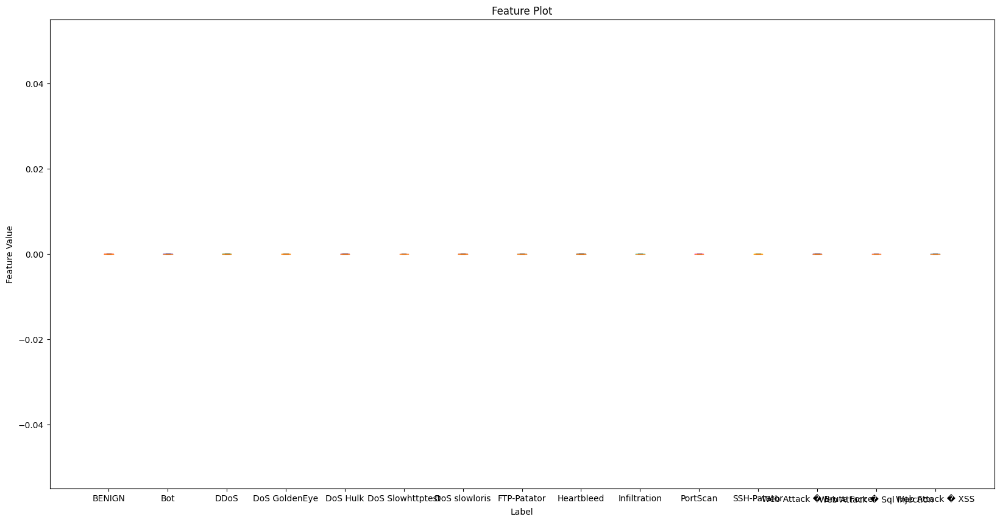

In [4]:
df_filtered = df.sort_values(by=' Label')

max_packet_length_values = df_filtered[' Bwd Avg Bytes/Bulk']
labels = df_filtered[' Label']

# Get the unique labels
unique_labels = np.unique(labels)

# Choose a different color for each label
colors = ['red', 'blue', 'green', 'orange', 'purple', 'pink', 'brown', 'grey', 'black', 'cyan', 'magenta', 'yellow', 'indigo', 'violet', 'dodgerblue']
label_colors = {label: color for label, color in zip(unique_labels, colors)}

plt.figure(figsize=(20,10))

# Plot each label with a different color as a boxplot
n = len(unique_labels)
x_pos = np.arange(1, n + 1)

for i, label in enumerate(unique_labels):
    label_mask = labels == label
    data = max_packet_length_values[label_mask]
    bp = plt.boxplot(data, positions=[x_pos[i]], labels=[label], boxprops=dict(color=label_colors[label]))

plt.xlim(0, n + 1)
plt.xlabel('Label')
plt.ylabel('Feature Value')
plt.title('Feature Plot')
plt.show()

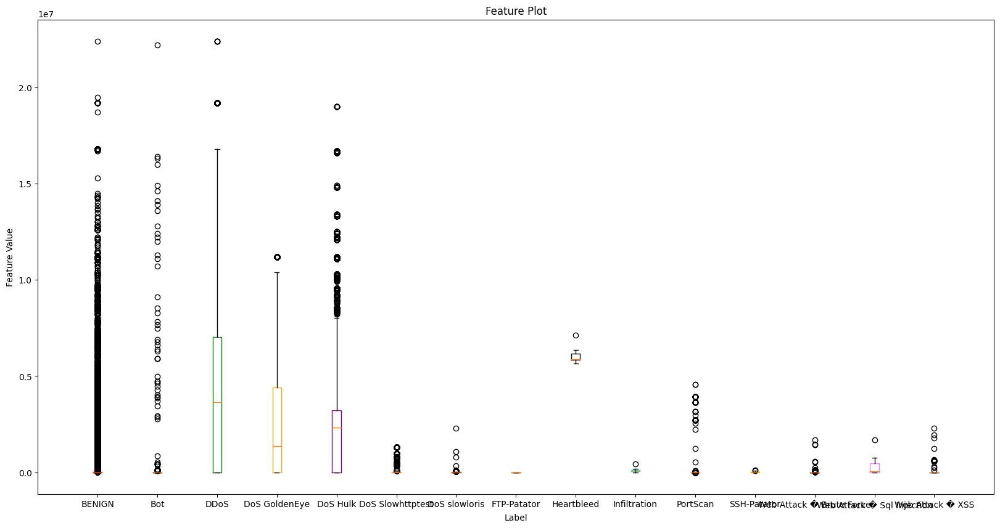

In [6]:
df_filtered = df.sort_values(by=' Label')

max_packet_length_values = df_filtered[' Packet Length Variance']
labels = df_filtered[' Label']

# Get the unique labels
unique_labels = np.unique(labels)

# Choose a different color for each label
colors = ['red', 'blue', 'green', 'orange', 'purple', 'pink', 'brown', 'grey', 'black', 'cyan', 'magenta', 'yellow', 'indigo', 'violet', 'dodgerblue']
label_colors = {label: color for label, color in zip(unique_labels, colors)}

plt.figure(figsize=(20,10))

# Plot each label with a different color as a boxplot
n = len(unique_labels)
x_pos = np.arange(1, n + 1)

for i, label in enumerate(unique_labels):
    label_mask = labels == label
    data = max_packet_length_values[label_mask]
    bp = plt.boxplot(data, positions=[x_pos[i]], labels=[label], boxprops=dict(color=label_colors[label]))

plt.xlim(0, n + 1)
plt.xlabel('Label')
plt.ylabel('Feature Value')
plt.title('Feature Plot')
plt.show()

In [1]:
import pandas as pd
griddf = pd.read_feather("gridresults.feather")
griddf

,layers,neurons,progress,traintime
0,0,0,"[0.0, 0.0, 0.0]",0.000000
1,2,2,"[0.484375, 0.503125, 0.55, 0.5125, 0.540625, 0...",-1735.979855
2,2,4,"[0.478125, 0.50625, 0.496875, 0.45, 0.4875, 0....",-1823.179430
3,2,8,"[0.509375, 0.4625, 0.5, 0.51875, 0.46875, 0.52...",1728.703833
4,2,16,"[0.525, 0.44375, 0.478125, 0.4625, 0.515625, 0...",1796.003145
5,2,32,"[0.49375, 0.471875, 0.484375, 0.5125, 0.525, 0...",1885.860660
6,2,64,"[0.475, 0.5, 0.453125, 0.4625, 0.4625, 0.48437...",3505.070723
7,2,128,"[0.509375, 0.49375, 0.475, 0.5125, 0.50625, 0....",2040.191225
8,2,256,"[0.46875, 0.49375, 0.51875, 0.5125, 0.553125, ...",3495.541258
9,2,512,"[0.496875, 0.45625, 0.465625, 0.446875, 0.4906...",3696.988947


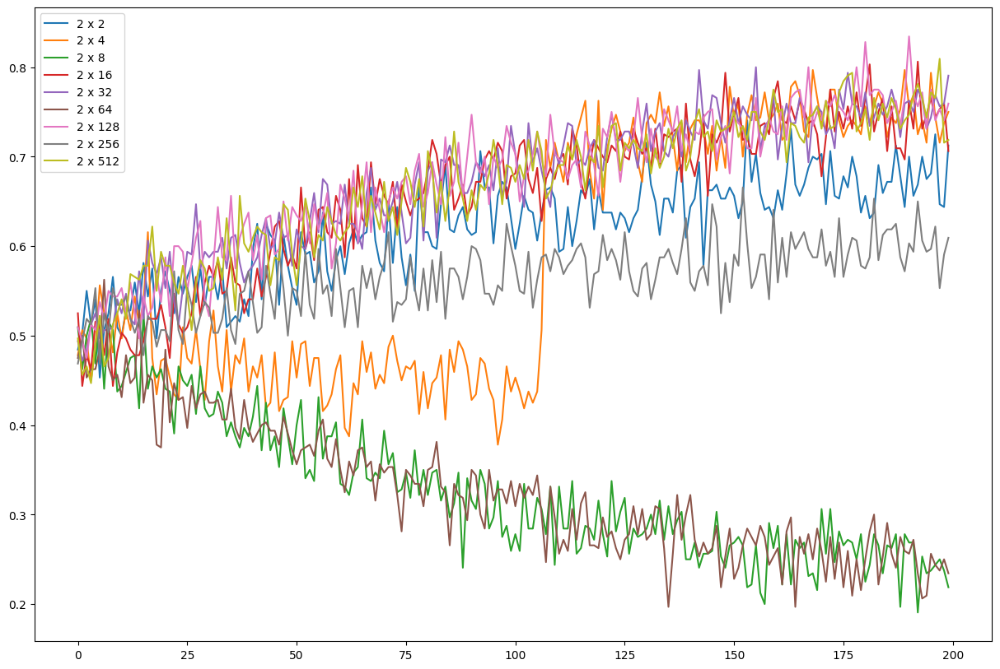

In [4]:

plt.figure(figsize=(15,10))
acc2x2 =griddf["progress"][1]
acc2x4 =griddf["progress"][2]
acc2x8 =griddf["progress"][3]
acc2x16 =griddf["progress"][4]
acc2x32 =griddf["progress"][5]
acc2x64 =griddf["progress"][6]
acc2x128 =griddf["progress"][7]
acc2x256 =griddf["progress"][8]
acc2x512 =griddf["progress"][9]
plt.plot(acc2x2, label='2 x 2')
plt.plot(acc2x4, label='2 x 4')
plt.plot(acc2x8, label='2 x 8')
plt.plot(acc2x16, label='2 x 16')
plt.plot(acc2x32, label='2 x 32')
plt.plot(acc2x64, label='2 x 64')
plt.plot(acc2x128, label='2 x 128')
plt.plot(acc2x256, label='2 x 256')
plt.plot(acc2x512, label='2 x 512')
plt.legend()
plt.show()

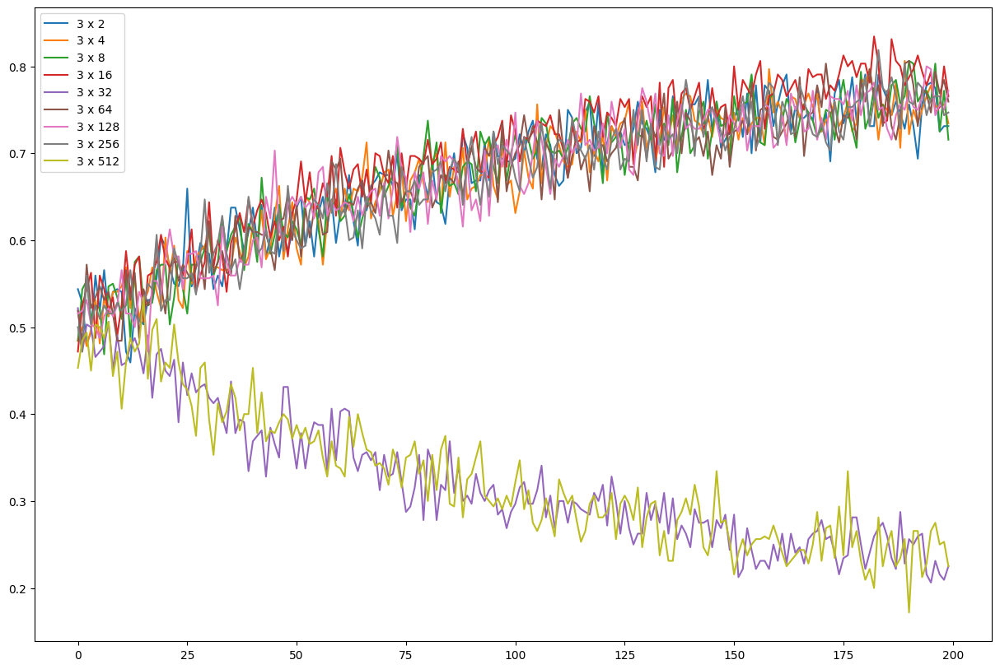

In [6]:
plt.figure(figsize=(15,10))
acc3x2 =griddf["progress"][10]
acc3x4 =griddf["progress"][11]
acc3x8 =griddf["progress"][12]
acc3x16 =griddf["progress"][13]
acc3x32 =griddf["progress"][14]
acc3x64 =griddf["progress"][15]
acc3x128 =griddf["progress"][16]
acc3x256 =griddf["progress"][17]
acc3x512 =griddf["progress"][18]
plt.plot(acc3x2, label='3 x 2')
plt.plot(acc3x4, label='3 x 4')
plt.plot(acc3x8, label='3 x 8')
plt.plot(acc3x16, label='3 x 16')
plt.plot(acc3x32, label='3 x 32')
plt.plot(acc3x64, label='3 x 64')
plt.plot(acc3x128, label='3 x 128')
plt.plot(acc3x256, label='3 x 256')
plt.plot(acc3x512, label='3 x 512')
plt.legend()
plt.show()

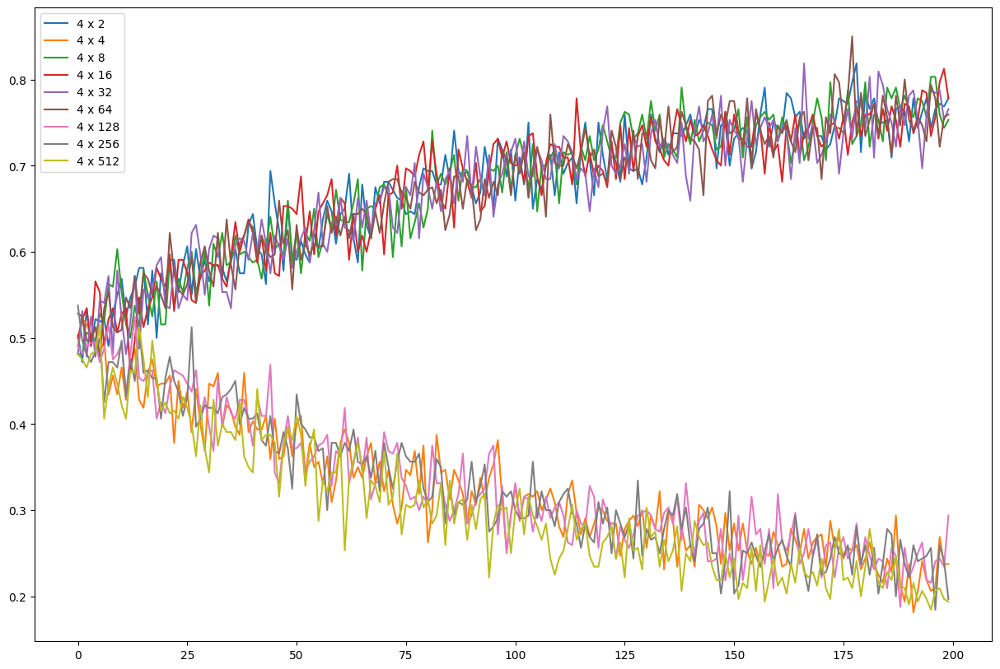

In [7]:
plt.figure(figsize=(15,10))
acc4x2 =griddf["progress"][19]
acc4x4 =griddf["progress"][20]
acc4x8 =griddf["progress"][21]
acc4x16 =griddf["progress"][22]
acc4x32 =griddf["progress"][23]
acc4x64 =griddf["progress"][24]
acc4x128 =griddf["progress"][25]
acc4x256 =griddf["progress"][26]
acc4x512 =griddf["progress"][27]
plt.plot(acc4x2, label='4 x 2')
plt.plot(acc4x4, label='4 x 4')
plt.plot(acc4x8, label='4 x 8')
plt.plot(acc4x16, label='4 x 16')
plt.plot(acc4x32, label='4 x 32')
plt.plot(acc4x64, label='4 x 64')
plt.plot(acc4x128, label='4 x 128')
plt.plot(acc4x256, label='4 x 256')
plt.plot(acc4x512, label='4 x 512')
plt.legend()
plt.show()

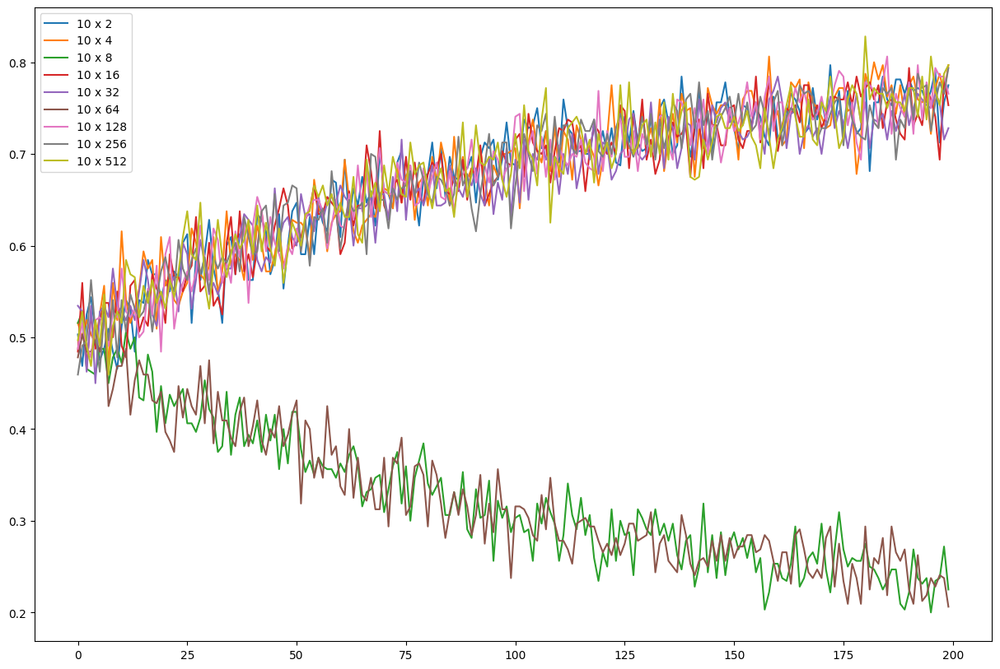

In [8]:
plt.figure(figsize=(15,10))
acc10x2 =griddf["progress"][28]
acc10x4 =griddf["progress"][29]
acc10x8 =griddf["progress"][30]
acc10x16 =griddf["progress"][31]
acc10x32 =griddf["progress"][32]
acc10x64 =griddf["progress"][33]
acc10x128 =griddf["progress"][34]
acc10x256 =griddf["progress"][35]
acc10x512 =griddf["progress"][36]
plt.plot(acc10x2, label='10 x 2')
plt.plot(acc10x4, label='10 x 4')
plt.plot(acc10x8, label='10 x 8')
plt.plot(acc10x16, label='10 x 16')
plt.plot(acc10x32, label='10 x 32')
plt.plot(acc10x64, label='10 x 64')
plt.plot(acc10x128, label='10 x 128')
plt.plot(acc10x256, label='10 x 256')
plt.plot(acc10x512, label='10 x 512')
plt.legend()
plt.show()

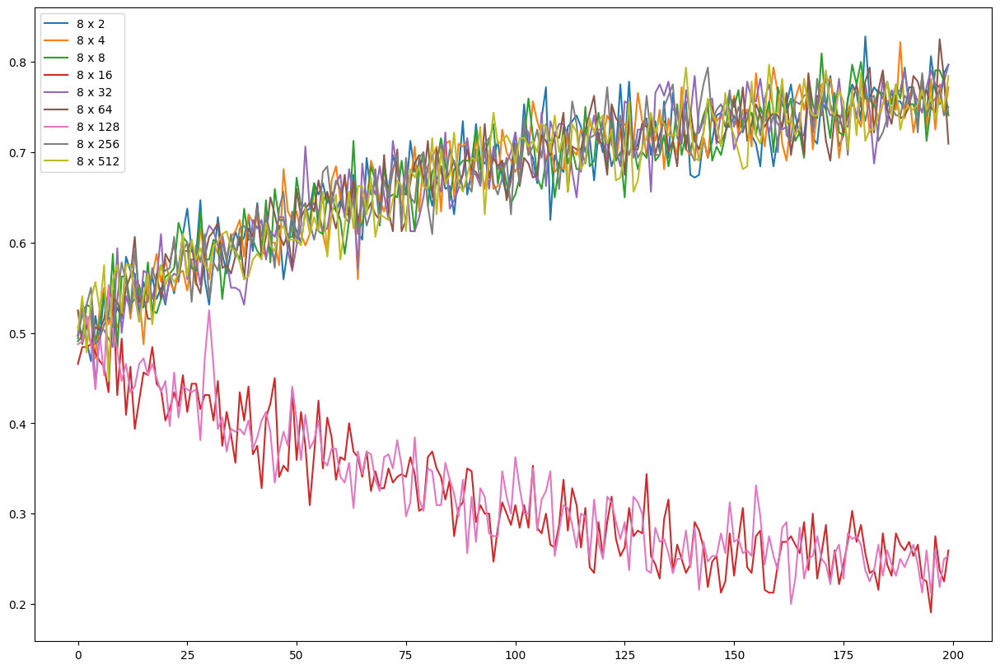

In [5]:
plt.figure(figsize=(15,10))
acc8x2 =griddf["progress"][36]
acc8x4 =griddf["progress"][37]
acc8x8 =griddf["progress"][38]
acc8x16 =griddf["progress"][39]
acc8x32 =griddf["progress"][40]
acc8x64 =griddf["progress"][41]
acc8x128 =griddf["progress"][42]
acc8x256 =griddf["progress"][43]
acc8x512 =griddf["progress"][44]
plt.plot(acc8x2, label='8 x 2')
plt.plot(acc8x4, label='8 x 4')
plt.plot(acc8x8, label='8 x 8')
plt.plot(acc8x16, label='8 x 16')
plt.plot(acc8x32, label='8 x 32')
plt.plot(acc8x64, label='8 x 64')
plt.plot(acc8x128, label='8 x 128')
plt.plot(acc8x256, label='8 x 256')
plt.plot(acc8x512, label='8 x 512')
plt.legend()
plt.show()

In [26]:
data = pd.read_feather("gridresults.feather")


In [5]:
for index, row in griddf.iterrows():
    print(f"{row['layers']}x{row['neurons']}    {row['progress'][-1]}")

0x0    0.0
2x2    0.7125
2x4    0.75
2x8    0.21875
2x16    0.70625
2x32    0.790625
2x64    0.234375
2x128    0.759375
2x256    0.609375
2x512    0.71875
3x2    0.73125
3x4    0.734375
3x8    0.715625
3x16    0.765625
3x32    0.225
3x64    0.759375
3x128    0.771875
3x256    0.746875
3x512    0.225
4x2    0.778125
4x4    0.2375
4x8    0.753125
4x16    0.778125
4x32    0.765625
4x64    0.759375
4x128    0.29375
4x256    0.196875
4x512    0.19375
10x2    0.775
10x4    0.796875
10x8    0.225
10x16    0.753125
10x32    0.728125
10x64    0.20625
10x128    0.765625
10x256    0.79375
8x2    0.796875
8x4    0.771875
8x8    0.740625


In [5]:
print(data)

    layers  neurons                                           progress  \
0        0        0                                    [0.0, 0.0, 0.0]   
1        2        2  [0.484375, 0.503125, 0.55, 0.5125, 0.540625, 0...   
2        2        4  [0.478125, 0.50625, 0.496875, 0.45, 0.4875, 0....   
3        2        8  [0.509375, 0.4625, 0.5, 0.51875, 0.46875, 0.52...   
4        2       16  [0.525, 0.44375, 0.478125, 0.4625, 0.515625, 0...   
5        2       32  [0.49375, 0.471875, 0.484375, 0.5125, 0.525, 0...   
6        2       32  [0.484375, 0.4625, 0.509375, 0.471875, 0.55, 0...   
7        2       64  [0.475, 0.5, 0.453125, 0.4625, 0.4625, 0.48437...   
8        2      128  [0.509375, 0.49375, 0.475, 0.5125, 0.50625, 0....   
9        2       32  [0.45, 0.51875, 0.459375, 0.5, 0.490625, 0.490...   
10       2       64  [0.515625, 0.5125, 0.490625, 0.53125, 0.515625...   
11       4        4                                          [1, 2, 3]   

      traintime  
0      0.000000  
1

In [9]:
data =data.drop([6,9,10,11]).reset_index(drop=True)

KeyError: '[6, 9, 10, 11] not found in axis'

In [18]:
print(data)

   layers  neurons                                           progress  \
0       0        0                                    [0.0, 0.0, 0.0]   
1       2        2  [0.484375, 0.503125, 0.55, 0.5125, 0.540625, 0...   
2       2        4  [0.478125, 0.50625, 0.496875, 0.45, 0.4875, 0....   
3       2        8  [0.509375, 0.4625, 0.5, 0.51875, 0.46875, 0.52...   
4       2       16  [0.525, 0.44375, 0.478125, 0.4625, 0.515625, 0...   
5       2       32  [0.49375, 0.471875, 0.484375, 0.5125, 0.525, 0...   
7       2       64  [0.475, 0.5, 0.453125, 0.4625, 0.4625, 0.48437...   
8       2      128  [0.509375, 0.49375, 0.475, 0.5125, 0.50625, 0....   

     traintime  
0     0.000000  
1 -1735.979855  
2 -1823.179430  
3  1728.703833  
4  1796.003145  
5  1885.860660  
7  3505.070723  
8  2040.191225  


In [19]:
data = data.reset_index(drop=True)

In [20]:
data

,layers,neurons,progress,traintime
0,0,0,"[0.0, 0.0, 0.0]",0.000000
1,2,2,"[0.484375, 0.503125, 0.55, 0.5125, 0.540625, 0...",-1735.979855
2,2,4,"[0.478125, 0.50625, 0.496875, 0.45, 0.4875, 0....",-1823.179430
3,2,8,"[0.509375, 0.4625, 0.5, 0.51875, 0.46875, 0.52...",1728.703833
4,2,16,"[0.525, 0.44375, 0.478125, 0.4625, 0.515625, 0...",1796.003145
5,2,32,"[0.49375, 0.471875, 0.484375, 0.5125, 0.525, 0...",1885.860660
6,2,64,"[0.475, 0.5, 0.453125, 0.4625, 0.4625, 0.48437...",3505.070723
7,2,128,"[0.509375, 0.49375, 0.475, 0.5125, 0.50625, 0....",2040.191225


In [21]:
data.to_feather("gridresults.feather")

In [3]:
import pandas as pd
smdf = pd.read_feather("strangemodels.feather")
smdf

,version,layers,neurons,progress,traintime
0,999,0,0,"[0.0, 0.0, 0.0]",0.000000
1,0,10,64,"[0.525, 0.49375, 0.53125, 0.5125, 0.5375, 0.51...",1765.429543
2,1,10,64,"[0.48125, 0.575, 0.503125, 0.490625, 0.5375, 0...",1873.096157
3,0,2,32,"[0.490625, 0.515625, 0.553125, 0.4875, 0.46875...",3149.218633
4,1,2,32,"[0.490625, 0.496875, 0.534375, 0.475, 0.521875...",1917.453303
5,2,2,32,"[0.4875, 0.50625, 0.48125, 0.53125, 0.465625, ...",2275.524373


In [4]:
for index, row in smdf.iterrows():
    print(f"{row['layers']}x{row['neurons']}    {row['progress'][-1]}")

0x0    0.0
10x64    0.775
10x64    0.784375
2x32    0.7625
2x32    0.5125
2x32    0.4375


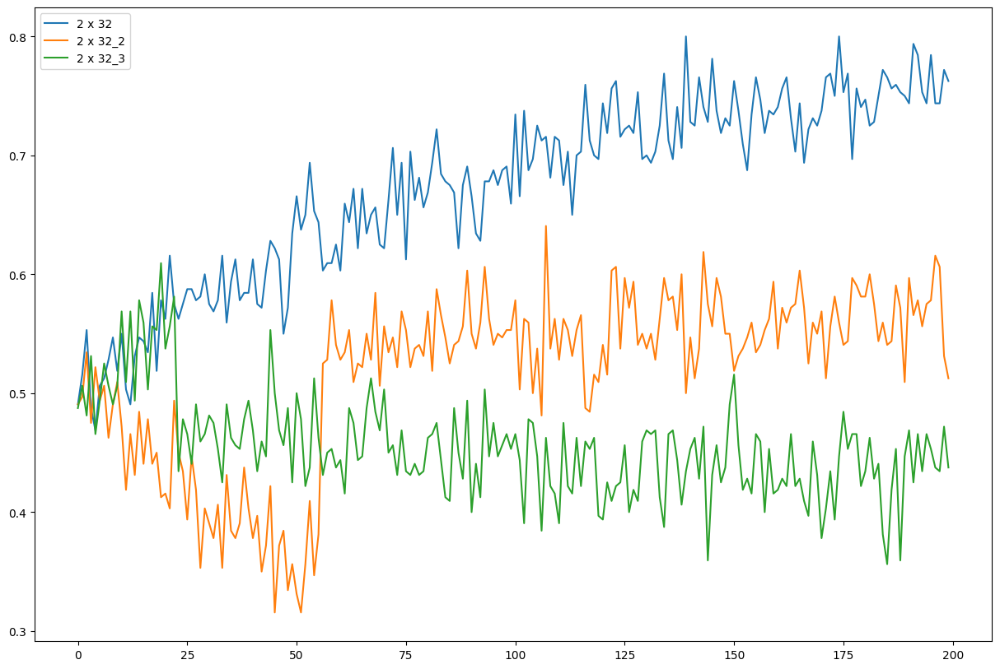

In [10]:
plt.figure(figsize=(15,10))
acc10x64 =smdf["progress"][1]
acc10x64_2 =smdf["progress"][2]
acc2x32 =smdf["progress"][3]
acc2x32_2 =smdf["progress"][4]
acc2x32_3 =smdf["progress"][5]
#plt.plot(acc10x64, label='10 x 64')
#plt.plot(acc10x64_2, label='10 x 64')
plt.plot(acc2x32, label='2 x 32')
plt.plot(acc2x32_2, label='2 x 32_2')
plt.plot(acc2x32_3, label='2 x 32_3')
plt.legend()
plt.show()

In [12]:
import gymnasium as gym
from gymnasium import spaces

df = pd.read_feather("norm_bin_31feat_CIC2017.feather")


action_size = 2

class MyEnv(gym.Env):
    metadata = {'render.modes': ['human']}
    def __init__(self, data):
        self.action_space = spaces.Discrete(2)  # 2 possible actions
        # self.observation_space = spaces.Discrete(1) # only one observation needed
        # self.reward_range = (-1, 1) # rewards range from -1 to 1
        self.data = data  # dataset
        self.datasize = data.shape[1] - 1  # amount of features
        self.datapoints = data.shape[0] - 1
        self.index = 0  # index of the current data point
        self.state = None

    def step(self, action):
        label = self.data.at[self.index, ' Label']  # get label from dataset
        if action == label:
            reward = 1  # match, give positive reward
        else:
            reward = 0  # not matching, give negative reward
        self.index = random.randint(0, self.datapoints)  # move to next data point
            # row = self.data.get_chunk(1)
            # if row.empty:
            #    self.done = True
            #    return 0,0,self.done,{}
            # self.state= row.iloc[:,1:-1].values
            # self.label = row.iloc[:,-1:].values

        self.state = self.data.iloc[self.index, :-1].values.reshape(1, self.datasize)
        return self.state, reward, {}

    def reset(self):
        self.index = random.randint(0, self.datapoints)
        self.state = self.data.iloc[self.index, :-1].values.reshape(1, self.datasize)
        return self.state

    def render(self, mode='human', close=False):
        pass


env = MyEnv(df)

state_size = env.datasize


class DQNAgent:
    def __init__(self, state_size, action_size, layer_amount, neurons):
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=2000)
        self.gamma = 0.99  # discount rate
        self.epsilon = 0.99  # exploration rate
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.99
        self.learning_rate = 0.001
        self.model = self._build_model(layer_amount, neurons)

    def _build_model(self, layer_amount, neurons):
        model = keras.Sequential()
        model.add(layers.Dense(neurons, input_dim=self.state_size, activation='relu'))
        for i in range(layer_amount):
            model.add(layers.Dense(neurons, activation='relu'))
        model.add(layers.Dense(self.action_size, activation='linear'))
        model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=self.learning_rate),
                      metrics=["Accuracy"])
        return model

    def remember(self, state, action, reward):
        self.memory.append((state, action, reward))

    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        act_values = self.model.predict(state, verbose=0)
        return np.argmax(act_values[0])  # returns action

    def replay(self, batch_size):

        minibatch = random.sample(self.memory, batch_size)

        for state, action, reward in minibatch:
            target = reward + self.gamma * np.amax(self.model.predict(state, verbose=0)[0])
            target_f = self.model.predict(state, verbose=0)
            target_f[0][action] = target
            self.model.fit(state, target_f, epochs=1, verbose=0)

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def load(self, name):
        self.model.load_weights(name)

    def save(self, name):
        self.model.save_weights(name)

In [13]:
agent = DQNAgent(state_size, action_size, 2 - 1, 32)
agent.load("99_99_2x32_2.h5")

2/2 [==============================] - 0s 3ms/step


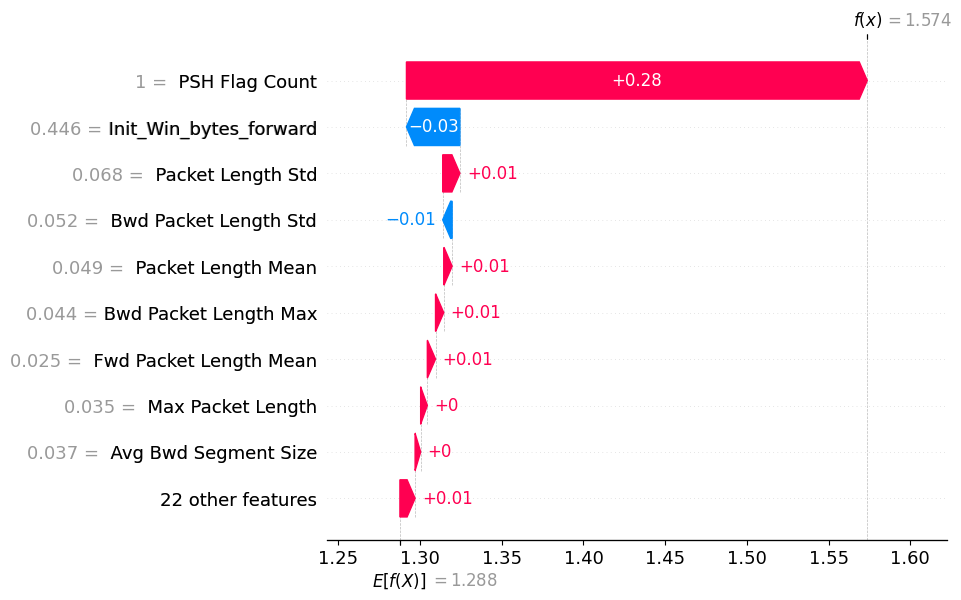

In [14]:
import shap

data = df.sample(n=3)
X=data.iloc[:,:-1]

explainer = shap.Explainer(agent.model.predict,data.iloc[:,:-1])

sv = explainer(data.iloc[:,:-1])

exp = shap.Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X.values, 
                  feature_names=X.columns)
idx = 0
shap.plots.waterfall(exp[idx])

In [13]:
agent = DQNAgent(state_size, action_size, 2 - 1, 32)
agent.load("99_99_2x32_1.h5")

C:\Users\kahre\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2/2 [==============================] - 0s 2ms/step


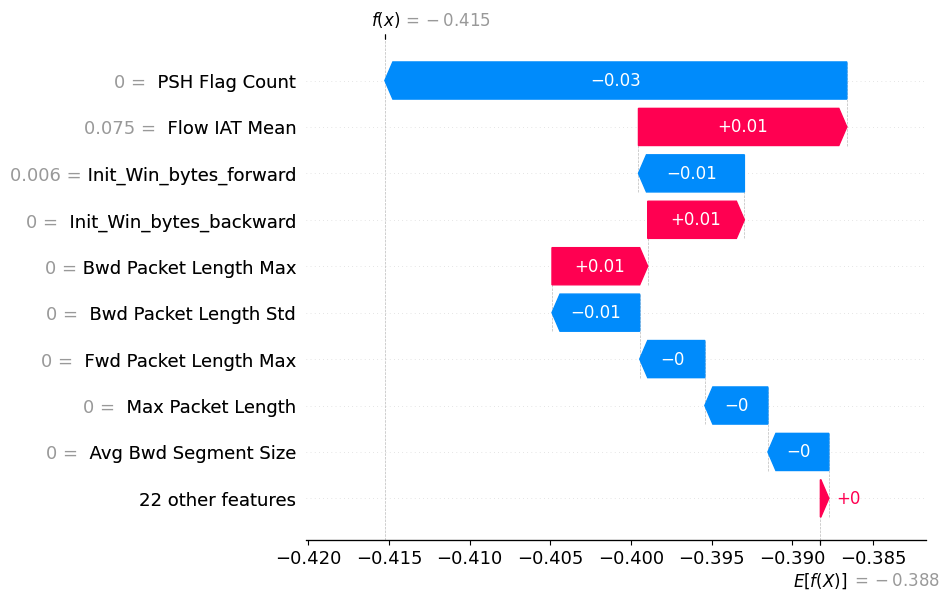

In [14]:
import shap

data = df.sample(n=3)
X=data.iloc[:,:-1]

explainer = shap.Explainer(agent.model.predict,data.iloc[:,:-1])

sv = explainer(data.iloc[:,:-1])

exp = shap.Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X.values, 
                  feature_names=X.columns)
idx = 0
shap.plots.waterfall(exp[idx])

In [15]:
agent = DQNAgent(state_size, action_size, 2 - 1, 32)
agent.load("99_99_2x32_0.h5")

2/2 [==============================] - 0s 4ms/step


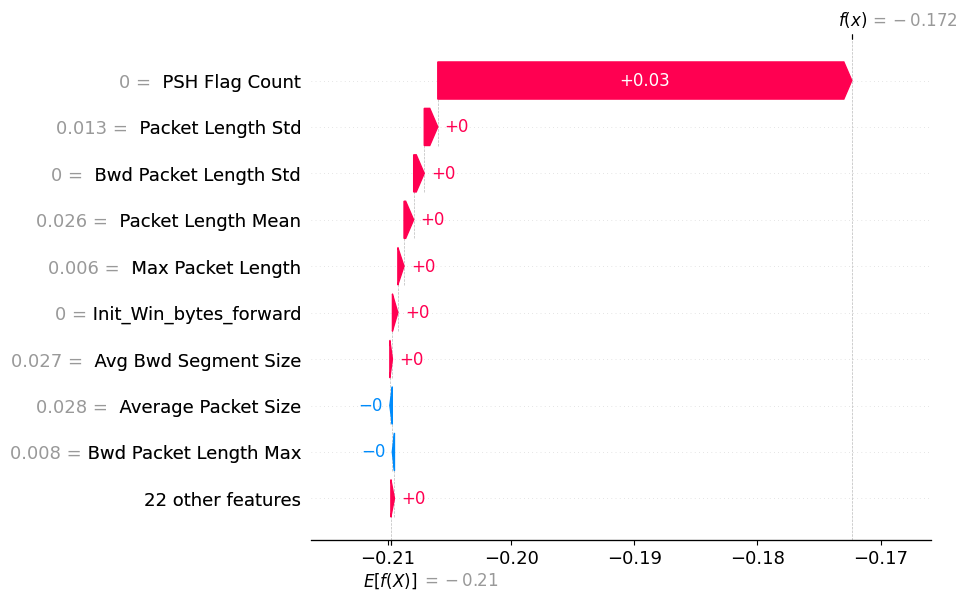

In [16]:
import shap

data = df.sample(n=3)
X=data.iloc[:,:-1]

explainer = shap.Explainer(agent.model.predict,data.iloc[:,:-1])

sv = explainer(data.iloc[:,:-1])

exp = shap.Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X.values, 
                  feature_names=X.columns)
idx = 0
shap.plots.waterfall(exp[idx])

In [17]:
agent = DQNAgent(state_size, action_size, 10 - 1, 64)
agent.load("99_99_10x64_1.h5")

2/2 [==============================] - 0s 3ms/step


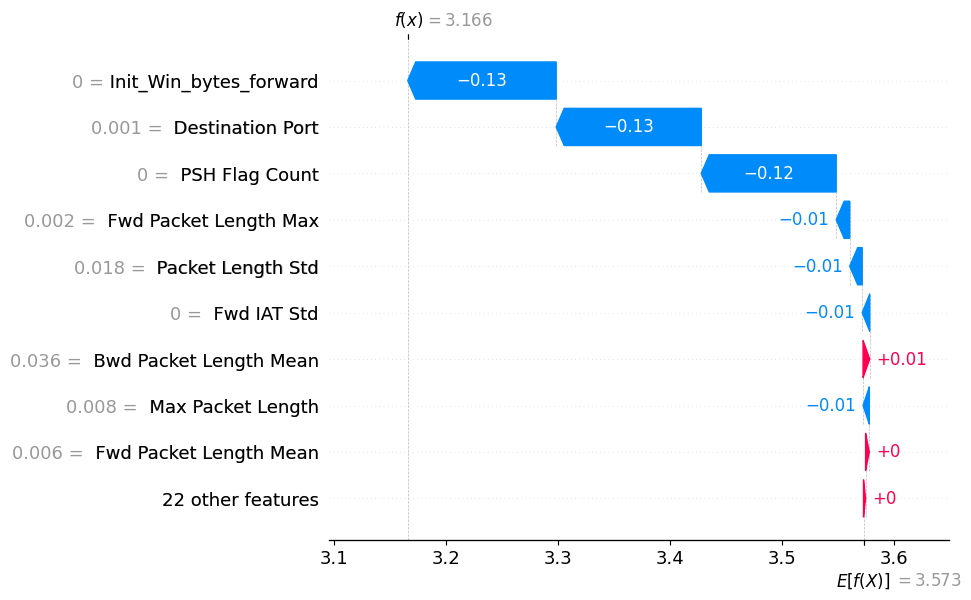

In [19]:
import shap

data = df.sample(n=3)
X=data.iloc[:,:-1]

explainer = shap.Explainer(agent.model.predict,data.iloc[:,:-1])

sv = explainer(data.iloc[:,:-1])

exp = shap.Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X.values, 
                  feature_names=X.columns)
idx = 0
shap.plots.waterfall(exp[idx])

In [15]:
agent = DQNAgent(state_size, action_size, 10 - 1, 64)
agent.load("99_99_10x64_1.h5")

2/2 [==============================] - 0s 2ms/step


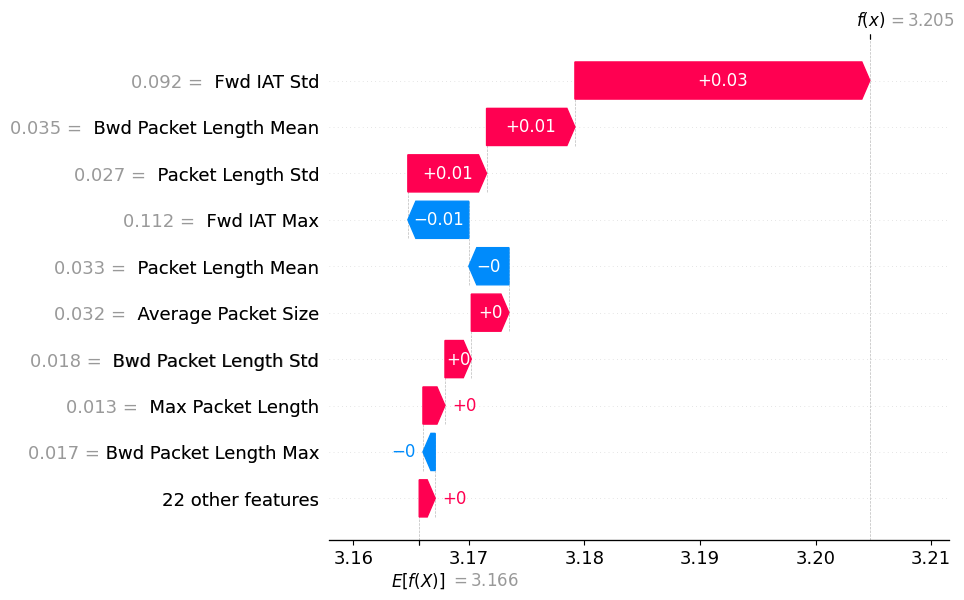

In [16]:
import shap

data = df.sample(n=3)
X=data.iloc[:,:-1]

explainer = shap.Explainer(agent.model.predict,data.iloc[:,:-1])

sv = explainer(data.iloc[:,:-1])

exp = shap.Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X.values, 
                  feature_names=X.columns)
idx = 0
shap.plots.waterfall(exp[idx])

In [2]:
import pandas as pd
erdf = pd.read_feather("epsilonresults.feather")
erdf

,epsilon,decay,layers,neurons,progress,traintime
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]",0.000000
1,0.995,0.995,2,32,"[0.45, 0.496875, 0.5, 0.475, 0.55, 0.50625, 0....",1339.773458
2,0.995,0.990,2,32,"[0.44375, 0.478125, 0.53125, 0.471875, 0.54062...",1922.971866
3,0.995,0.950,2,32,"[0.5, 0.45625, 0.440625, 0.44375, 0.425, 0.418...",2462.868211
4,0.995,0.900,2,32,"[0.521875, 0.453125, 0.390625, 0.471875, 0.412...",5411.170709
5,0.995,0.999,2,32,"[0.534375, 0.484375, 0.4875, 0.528125, 0.5375,...",809.962976


In [18]:
for index, row in erdf.iterrows():
    print(f"{row['epsilon']}x{row['decay']}    {row['progress'][-1]}")

0.01x0.01    0.0
0.995x0.995    0.671875
0.995x0.99    0.8
0.995x0.95    0.190625
0.995x0.9    0.20625


NameError: name 'plt' is not defined

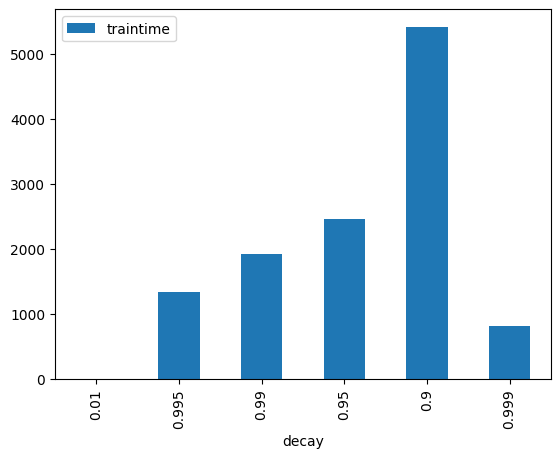

In [3]:
erdf.plot.bar(x='decay', y='traintime')

# Set the x-axis label
plt.xlabel('Decay')

# Set the y-axis label
plt.ylabel('Train Time')

# Set the title
plt.title('Train Time vs. Decay')

# Show the plot
plt.show()

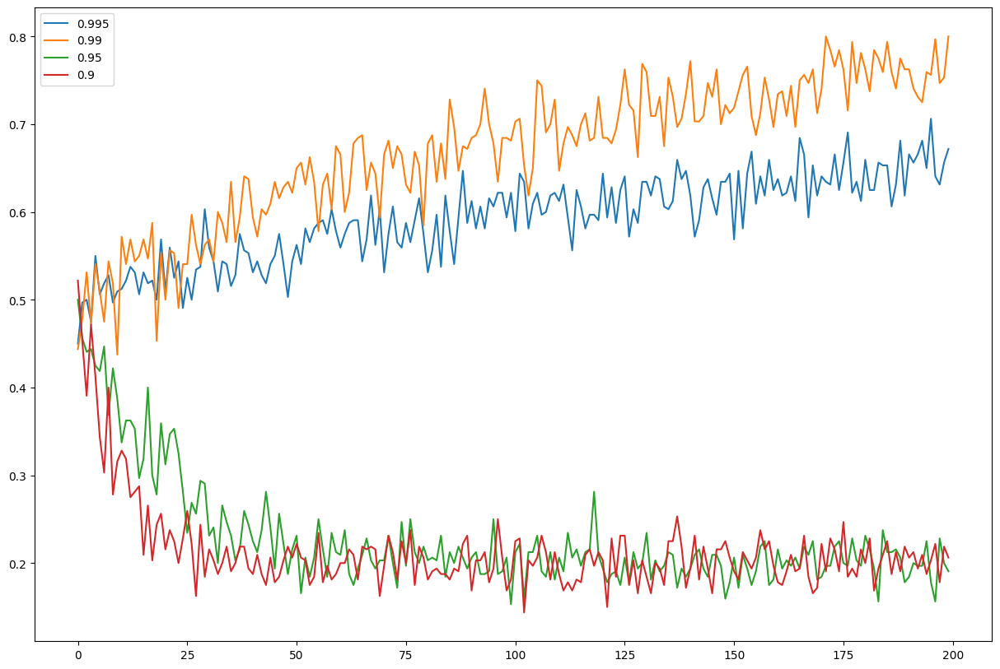

In [19]:
plt.figure(figsize=(15,10))
acc0995 =erdf["progress"][1]
acc099 =erdf["progress"][2]
acc095 =erdf["progress"][3]
acc09 =erdf["progress"][4]
plt.plot(acc0995, label='0.995')
plt.plot(acc099, label='0.99')
plt.plot(acc095, label='0.95')
plt.plot(acc09, label='0.9')
plt.legend()
plt.show()

In [11]:
import pandas as pd
ferdf = pd.read_feather("full_epsilonresults.feather")
ferdf

,epsilon,decay,layers,neurons,progress,traintime,episodes,endepsilon
0,0.010,0.0100,0,0,"[0.0, 0.0, 0.0]",0.000000,10,0.100000
1,0.995,0.9990,2,32,"[0.453125, 0.490625, 0.49375, 0.50625, 0.47812...",2596.754137,500,0.603347
2,0.995,0.9950,2,32,"[0.50625, 0.540625, 0.540625, 0.5125, 0.54375,...",4758.727952,500,0.081164
3,0.995,0.9975,2,32,"[0.515625, 0.50625, 0.484375, 0.4875, 0.4875, ...",7640.663065,500,0.284626
4,0.995,0.9990,2,32,"[0.4875, 0.534375, 0.48125, 0.54375, 0.521875,...",1386.915892,1000,0.365857
5,0.995,0.9975,2,32,"[0.471875, 0.465625, 0.4875, 0.55, 0.4625, 0.4...",1487.052572,1000,0.081419
6,0.995,0.9950,2,32,"[0.5125, 0.51875, 0.521875, 0.55, 0.51875, 0.4...",1589.832741,1000,0.009986
7,0.995,0.9990,2,32,"[0.478125, 0.484375, 0.5125, 0.465625, 0.45937...",2915.895752,2000,0.134524
8,0.995,0.9975,2,32,"[0.521875, 0.475, 0.5125, 0.5875, 0.5, 0.48125...",3245.589762,2000,0.009994
9,0.995,0.9950,2,32,"[0.540625, 0.46875, 0.484375, 0.515625, 0.5031...",6411.648305,2000,0.009986


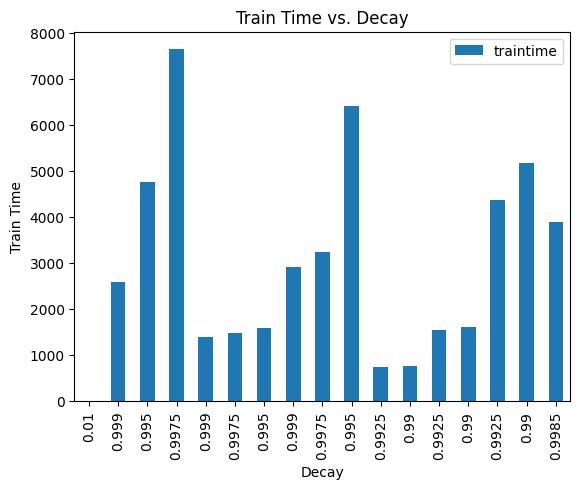

In [12]:
ferdf.plot.bar(x='decay', y='traintime')

# Set the x-axis label
plt.xlabel('Decay')

# Set the y-axis label
plt.ylabel('Train Time')

# Set the title
plt.title('Train Time vs. Decay')

# Show the plot
plt.show()

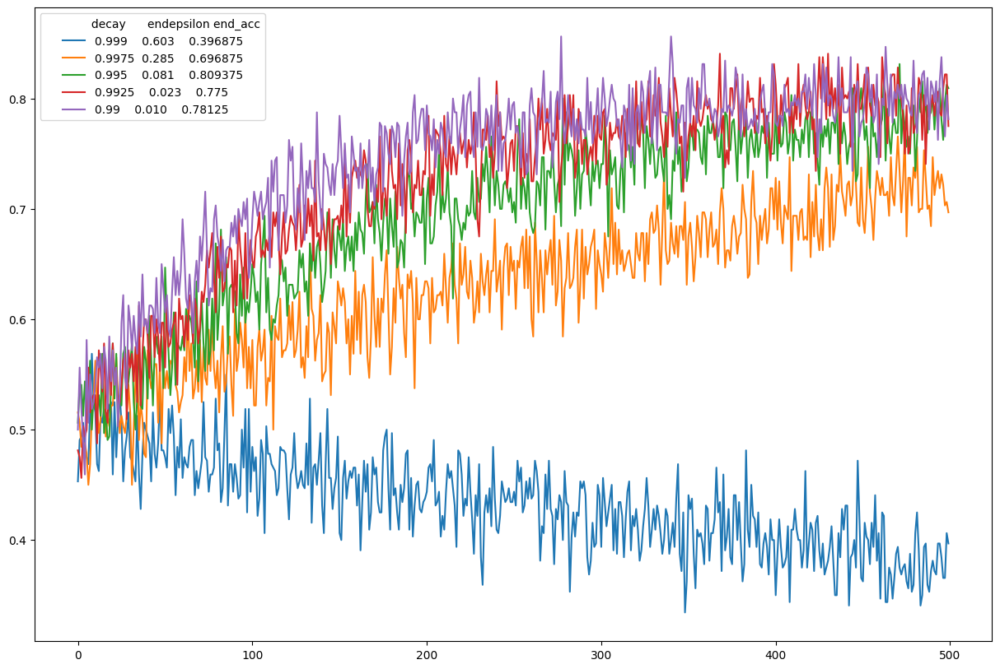

In [19]:
plt.figure(figsize=(15,10))
dec9990 =ferdf["progress"][1]
dec9950 =ferdf["progress"][2]
dec9975 =ferdf["progress"][3]
dec9925 =ferdf["progress"][10]
dec9900 =ferdf["progress"][11]
#acc09 =ferdf["progress"][4]
plt.plot(dec9990, label=f'0.999    {ferdf["endepsilon"][1]:.3f}    {dec9990[-1]}')
plt.plot(dec9975, label=f'0.9975  {ferdf["endepsilon"][3]:.3f}    {dec9975[-1]}')
plt.plot(dec9950, label=f'0.995    {ferdf["endepsilon"][2]:.3f}    {dec9950[-1]}')
plt.plot(dec9925, label=f'0.9925    {ferdf["endepsilon"][10]:.3f}    {dec9925[-1]}')
plt.plot(dec9900, label=f'0.99    {ferdf["endepsilon"][11]:.3f}    {dec9900[-1]}')
#plt.plot(acc099, label='0.99')
#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="             decay      endepsilon end_acc")
plt.show()

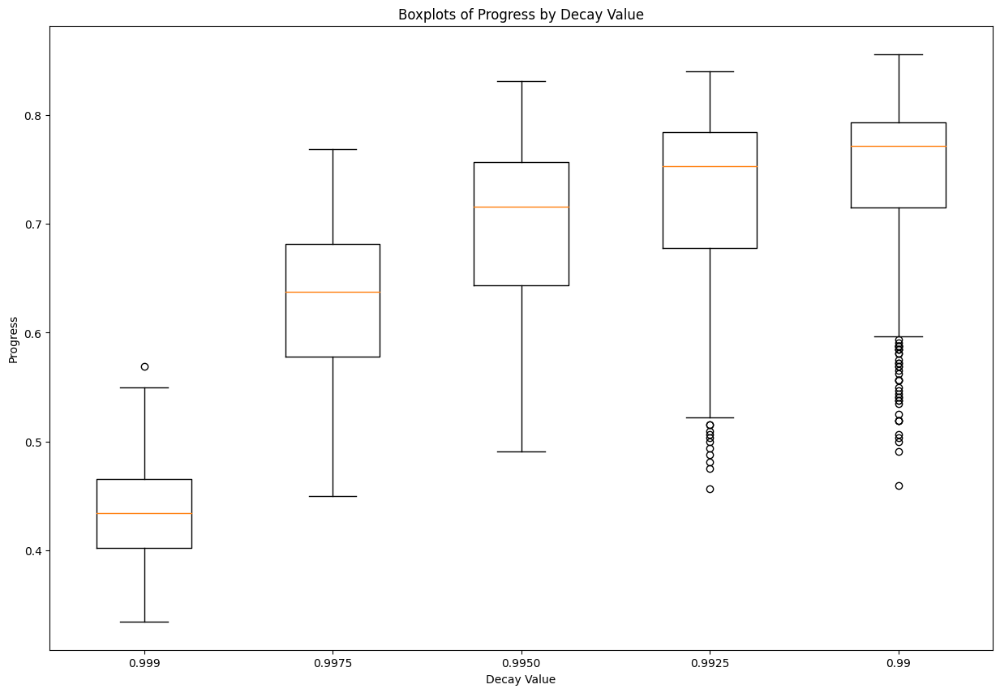

In [20]:
plt.figure(figsize=(15,10))

data = [dec9990, dec9975, dec9950, dec9925, dec9900]
labels = ['0.999', '0.9975', '0.9950', '0.9925', '0.99']

plt.boxplot(data, labels=labels)

plt.xlabel('Decay Value')
plt.ylabel('Progress')
plt.title('Boxplots of Progress by Decay Value')

plt.show()

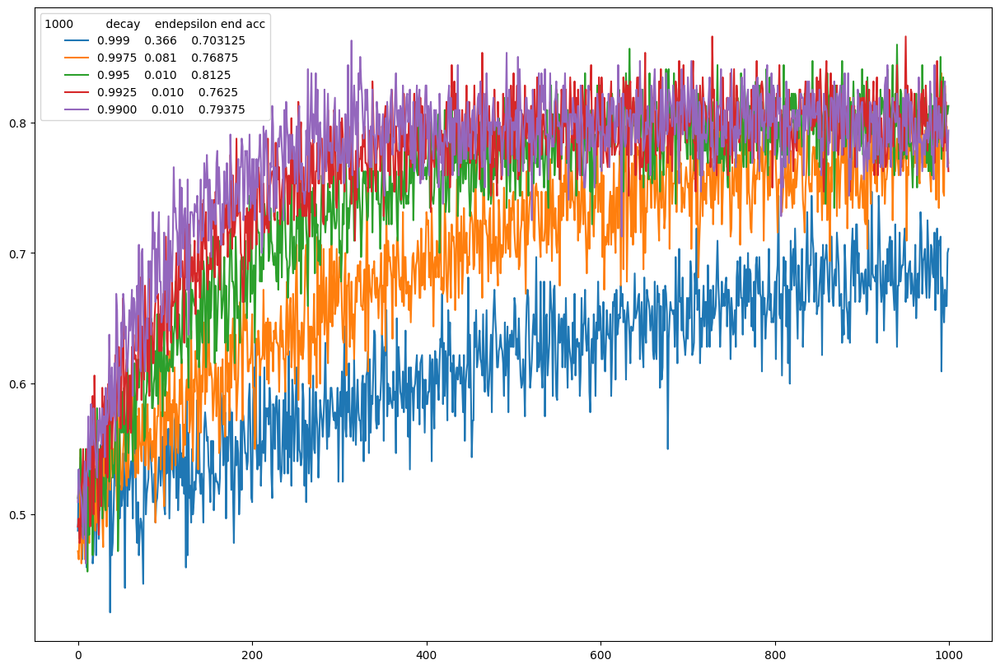

In [21]:
plt.figure(figsize=(15,10))
dec9990 =ferdf["progress"][4]
dec9975 =ferdf["progress"][5]
dec9950 =ferdf["progress"][6]
dec9925 =ferdf["progress"][12]
dec9900 =ferdf["progress"][13]
#acc09 =ferdf["progress"][4]
plt.plot(dec9990, label=f'0.999    {ferdf["endepsilon"][4]:.3f}    {dec9990[-1]}')
plt.plot(dec9975, label=f'0.9975  {ferdf["endepsilon"][5]:.3f}    {dec9975[-1]}')
plt.plot(dec9950, label=f'0.995    {ferdf["endepsilon"][6]:.3f}    {dec9950[-1]}')
plt.plot(dec9925, label=f'0.9925    {ferdf["endepsilon"][12]:.3f}    {dec9925[-1]}')
plt.plot(dec9900, label=f'0.9900    {ferdf["endepsilon"][13]:.3f}    {dec9900[-1]}')
#plt.plot(acc099, label='0.99')
#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="1000         decay    endepsilon end acc")
plt.show()

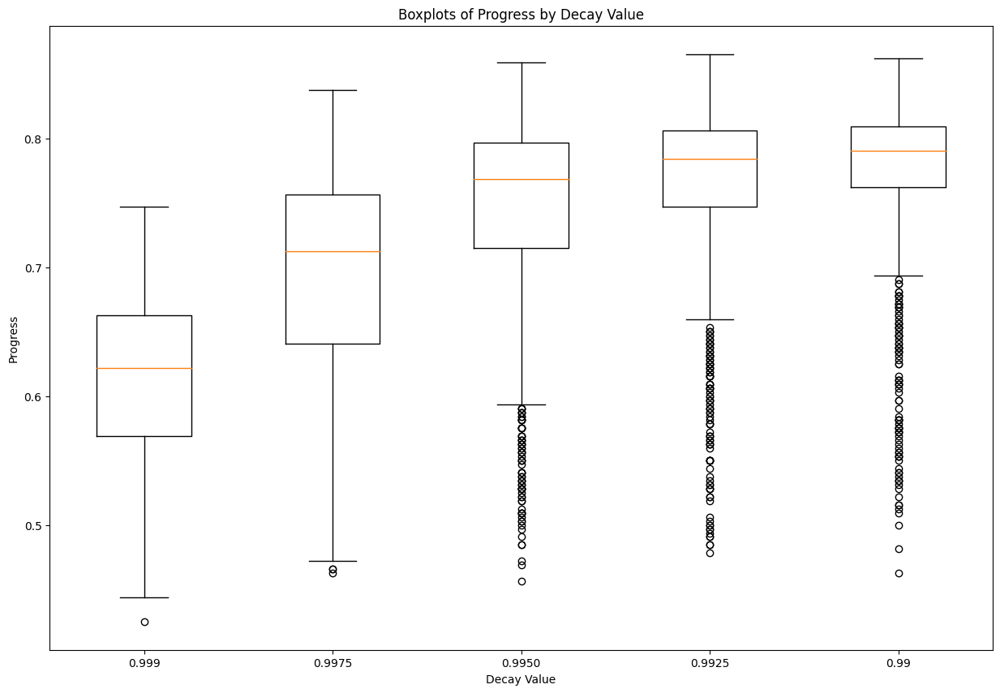

In [17]:
plt.figure(figsize=(15,10))

data = [dec9990, dec9975, dec9950, dec9925, dec9900]
labels = ['0.999', '0.9975', '0.9950', '0.9925', '0.99']

plt.boxplot(data, labels=labels)

plt.xlabel('Decay Value')
plt.ylabel('Progress')
plt.title('Boxplots of Progress by Decay Value')

plt.show()

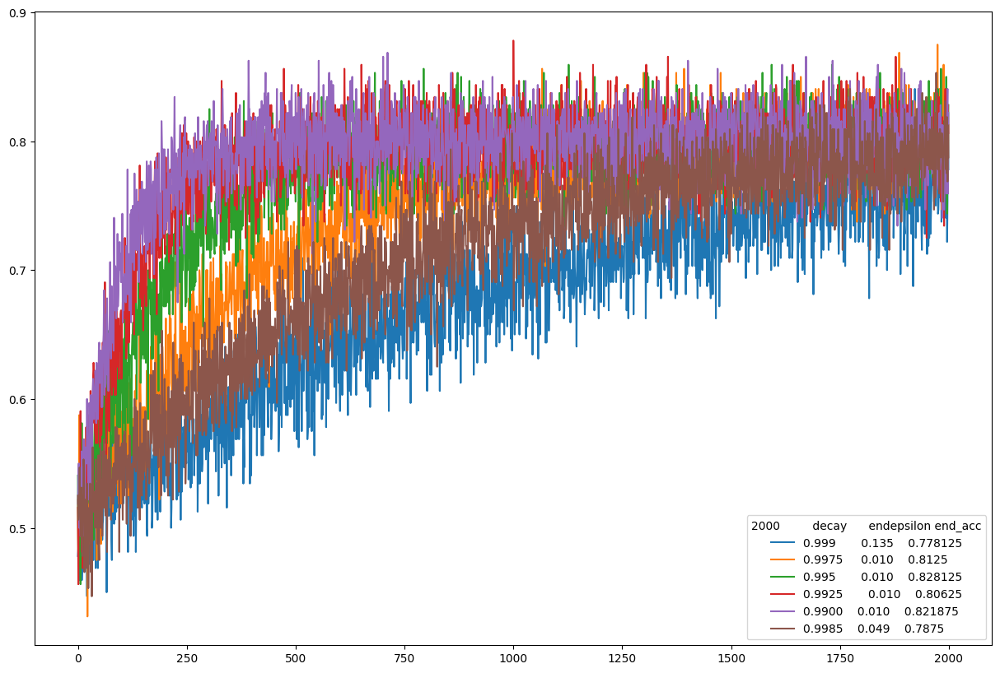

In [22]:
plt.figure(figsize=(15,10))
dec9990 =ferdf["progress"][7]
dec9975 =ferdf["progress"][8]
dec9950 =ferdf["progress"][9]
dec9925 =ferdf["progress"][14]
dec9900 =ferdf["progress"][15]
dec9985 = ferdf["progress"][16]
#acc09 =ferdf["progress"][4]
plt.plot(dec9990, label=f'0.999       {ferdf["endepsilon"][7]:.3f}    {dec9990[-1]}')
plt.plot(dec9975, label=f'0.9975     {ferdf["endepsilon"][8]:.3f}    {dec9975[-1]}')
plt.plot(dec9950, label=f'0.995       {ferdf["endepsilon"][9]:.3f}    {dec9950[-1]}')
plt.plot(dec9925, label=f'0.9925       {ferdf["endepsilon"][14]:.3f}    {dec9925[-1]}')
plt.plot(dec9900, label=f'0.9900    {ferdf["endepsilon"][15]:.3f}    {dec9900[-1]}')
plt.plot(dec9985, label=f'0.9985    {ferdf["endepsilon"][16]:.3f}    {dec9985[-1]}')
#plt.plot(acc099, label='0.99')
#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="2000         decay      endepsilon end_acc")
plt.show()

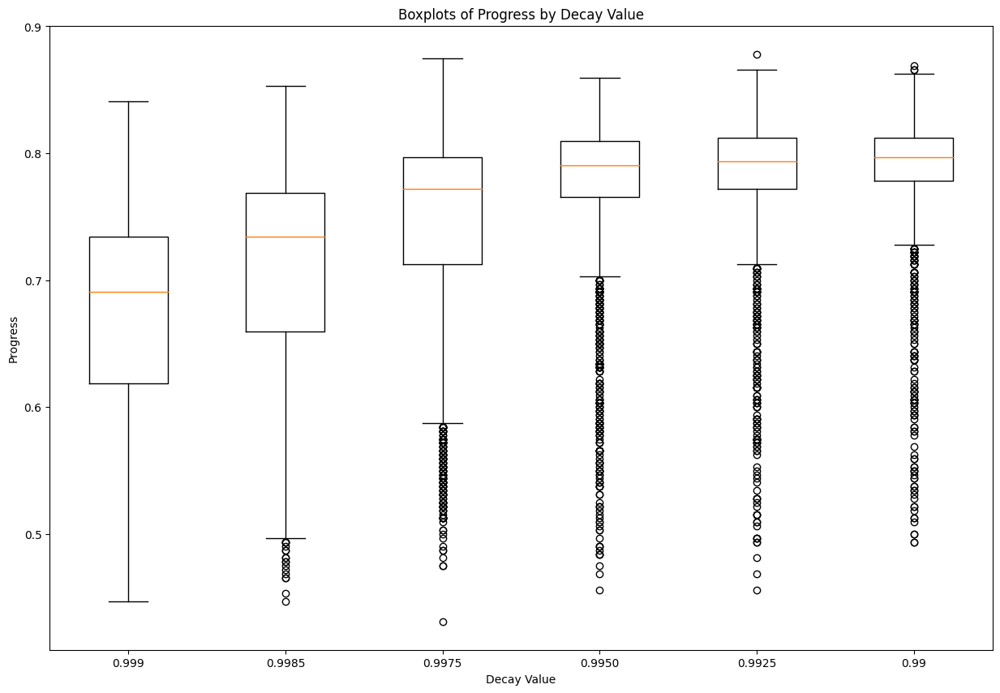

In [24]:
plt.figure(figsize=(15,10))

data = [dec9990, dec9985, dec9975, dec9950, dec9925, dec9900]
labels = ['0.999','0.9985','0.9975', '0.9950', '0.9925', '0.99']

plt.boxplot(data, labels=labels)

plt.xlabel('Decay Value')
plt.ylabel('Progress')
plt.title('Boxplots of Progress by Decay Value')

plt.show()

In [4]:
import pandas as pd
rrdf = pd.read_feather("reward_results.feather")
rrdf

,epsilon,decay,layers,neurons,progress,traintime,episodes,endepsilon,penalty
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]",0.000000,10,0.100000,0
1,0.995,0.995,2,32,"[0.475, 0.46875, 0.45625, 0.50625, 0.525, 0.50...",3101.000722,2000,0.009986,1
2,0.995,0.995,2,32,"[0.565625, 0.496875, 0.490625, 0.446875, 0.456...",6253.744571,2000,0.009986,1
3,0.995,0.995,2,32,"[0.471875, 0.51875, 0.521875, 0.515625, 0.5062...",6319.088610,2000,0.009986,1
4,0.995,0.996,3,64,"[0.54375, 0.521875, 0.490625, 0.55625, 0.50312...",14799.516084,2000,0.009989,0
5,0.995,0.996,3,64,"[0.484375, 0.503125, 0.478125, 0.521875, 0.487...",3343.108809,2000,0.009989,-10


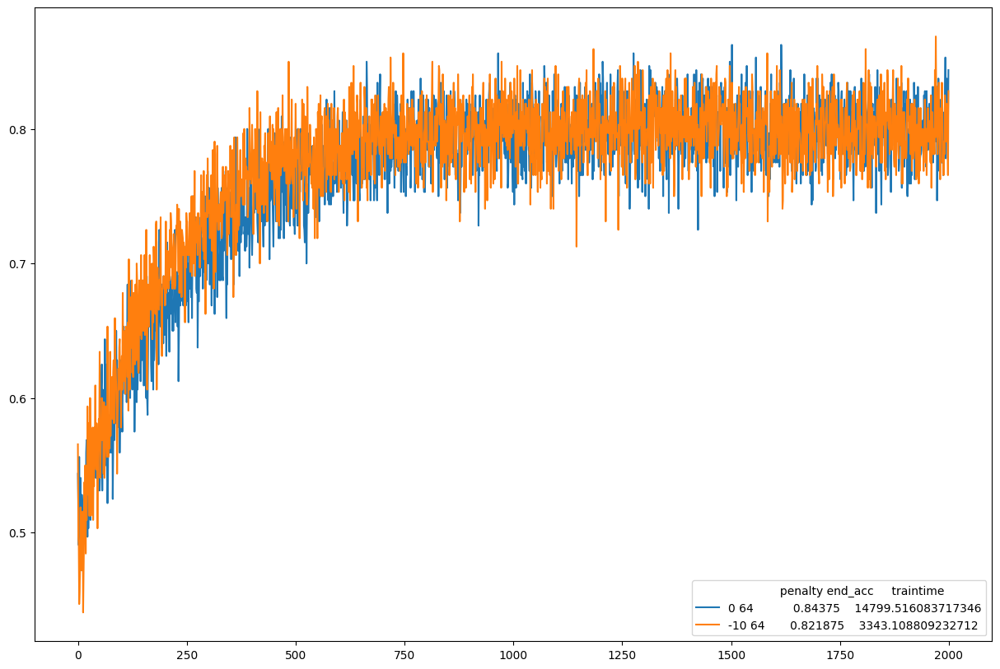

In [29]:
plt.figure(figsize=(15,10))
pen0_64 = rrdf["progress"][4]
pen10_64 = rrdf["progress"][5]

#acc09 =ferdf["progress"][4]
plt.plot(pen0_64, label=f'0 64           {pen0_64[-1]}    {rrdf["traintime"][4]}'  )
plt.plot(pen100, label=f'-10 64       {pen10_64[-1]}    {rrdf["traintime"][5]}')


#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="             penalty end_acc     traintime")
plt.show()

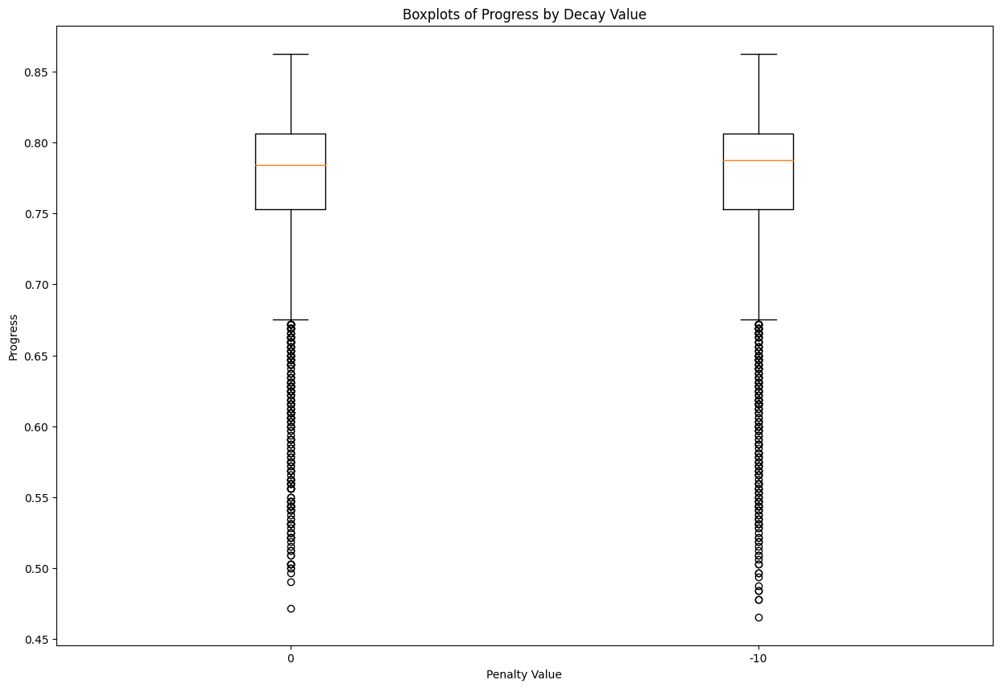

In [30]:
plt.figure(figsize=(15,10))

data = [pen0_64, pen10_64]
labels = ['0','-10']

plt.boxplot(data, labels=labels)

plt.xlabel('Penalty Value')
plt.ylabel('Progress')
plt.title('Boxplots of Progress by Decay Value')

plt.show()

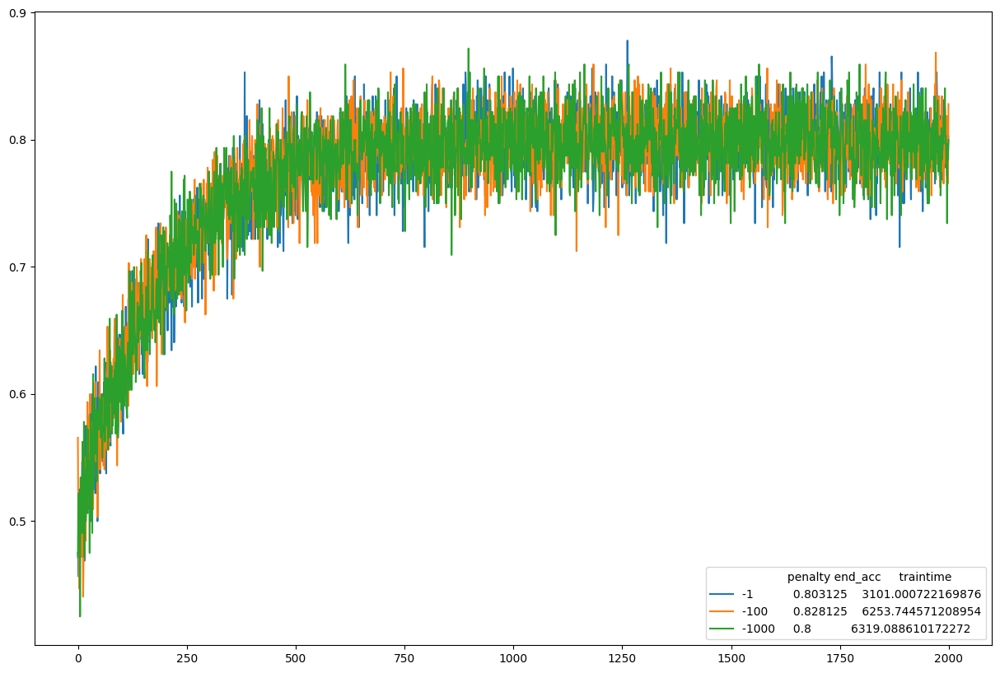

In [10]:
plt.figure(figsize=(15,10))
pen1 = rrdf["progress"][1]
pen100 = rrdf["progress"][2]
pen1000 = rrdf["progress"][3]

#acc09 =ferdf["progress"][4]
plt.plot(pen1, label=f'-1           {pen1[-1]}    {rrdf["traintime"][1]}'  )
plt.plot(pen100, label=f'-100       {pen100[-1]}    {rrdf["traintime"][2]}')
plt.plot(pen1000, label=f'-1000     {pen1000[-1]}           {rrdf["traintime"][3]}')

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="             penalty end_acc     traintime")
plt.show()

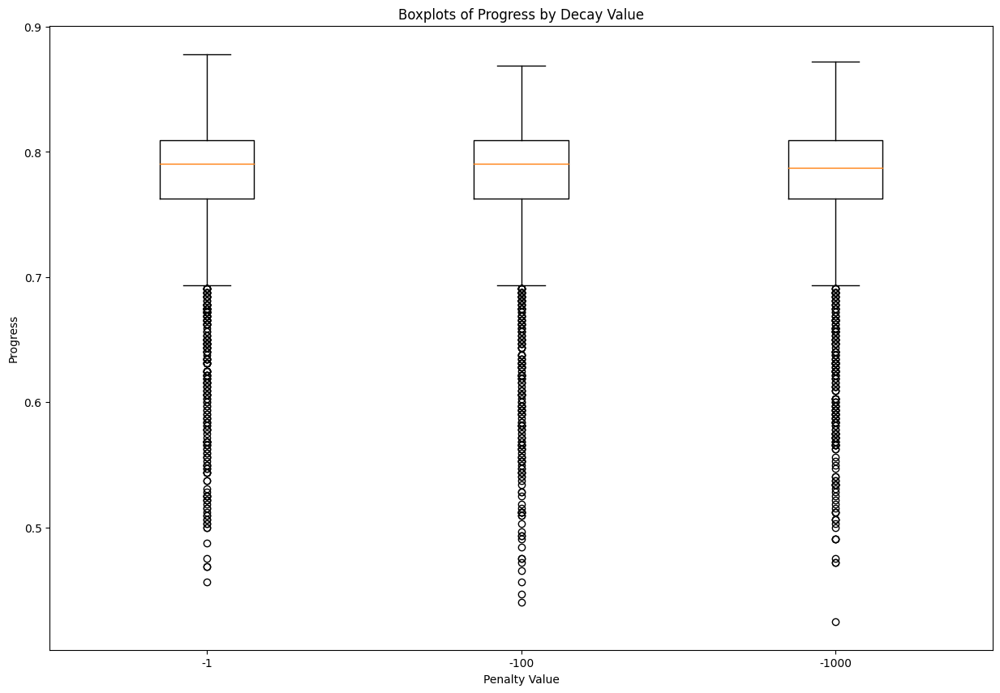

In [26]:
plt.figure(figsize=(15,10))

data = [pen1, pen100, pen1000]
labels = ['-1','-100','-1000']

plt.boxplot(data, labels=labels)

plt.xlabel('Penalty Value')
plt.ylabel('Progress')
plt.title('Boxplots of Progress by Decay Value')

plt.show()

In [27]:
import pandas as pd
ldf = pd.read_feather("learn_results.feather")
ldf

,epsilon,decay,layers,neurons,progress,traintime,episodes,endepsilon,penalty,learnrate
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]",0.000000,10,0.100000,0,0.0
1,0.995,0.996,3,64,"[0.51875, 0.4625, 0.50625, 0.528125, 0.50625, ...",56347.963454,2000,0.009989,0,0.1


In [28]:
ldf["progress"][1][-1]

0.79375

In [3]:
import pandas as pd
featdf = pd.read_feather("features_results.feather")
featdf

,epsilon,decay,layers,neurons,progress,traintime,episodes,endepsilon,penalty,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]",0.000000,10,0.100000,0,0.0000,999,norm
1,0.995,0.996,2,32,"[0.534375, 0.50625, 0.521875, 0.4375, 0.503125...",4754.218859,2000,0.009989,0,0.0010,31,minmaxnorm
2,0.995,0.996,2,32,"[0.484375, 0.53125, 0.453125, 0.521875, 0.4968...",5256.862859,2000,0.009989,0,0.0010,3,minmaxnorm
3,0.995,0.996,2,32,"[0.484375, 0.5375, 0.49375, 0.496875, 0.475, 0...",3026.498377,2000,0.009989,0,0.0010,6,minmaxnorm
4,0.995,0.996,2,32,"[0.43125, 0.496875, 0.528125, 0.490625, 0.5156...",2975.464048,2000,0.009989,0,0.0010,78,minmaxnorm
5,0.995,0.996,2,32,"[0.553125, 0.4875, 0.478125, 0.525, 0.534375, ...",3009.324070,2000,0.009989,0,0.0010,70,minmaxnorm/zscore3
6,0.995,0.996,5,64,"[0.5375, 0.490625, 0.484375, 0.4625, 0.51875, ...",3468.603351,2000,0.009989,0,0.0010,70,minmaxnorm/zscore3
7,0.995,0.996,5,64,"[0.4875, 0.496875, 0.496875, 0.475, 0.515625, ...",3486.450830,2000,0.009989,0,0.0010,71,balanced/minmaxnorm/zscore3/cw
8,0.995,0.996,5,64,"[0.54375, 0.4625, 0.471875, 0.496875, 0.534375...",3479.050030,2000,0.009989,0,0.0010,71,balanced/minmaxnorm/zscore3/cw
9,0.995,0.996,2,8,"[0.465625, 0.496875, 0.5, 0.48125, 0.471875, 0...",3058.861564,2000,0.009989,0,0.0010,71,balanced/minmaxnorm/zscore3/cw


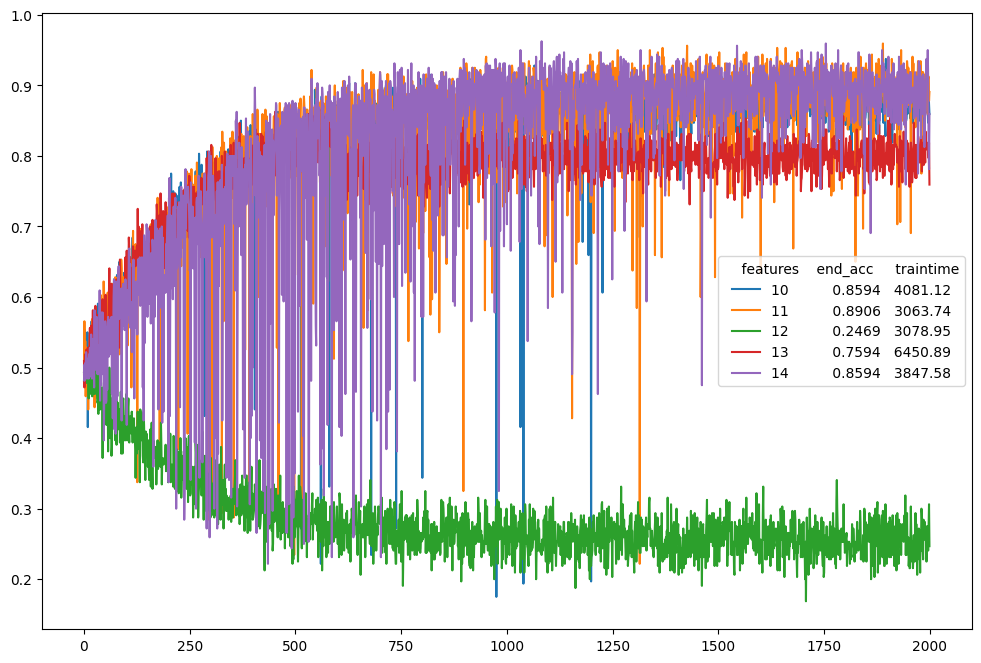

In [6]:
plt.figure(figsize=(12,8))

for i in range(len(featdf)):
    if i< 10:
        continue
    data. = featdf["progress"][i]
    label = f'{featdf.index[i]:<12}{data[-1]:.4f}{featdf["traintime"][i]:>10.2f}'
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_acc     traintime")
plt.show()


#8 IS BIN CROSSENTROPY, high acc on attack but horrible overall
# the 50%ers can be ignroed duo to nestled argmax  gonestly all pre 10 can be ignored

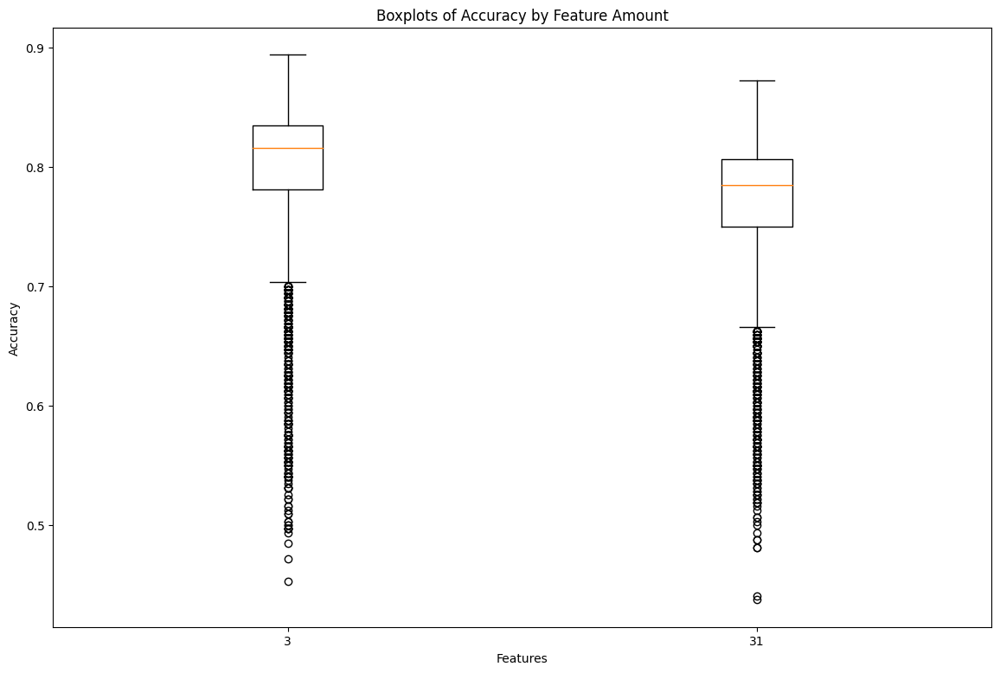

In [42]:
plt.figure(figsize=(14,9))

data = [feat3, feat31]
labels = ['3','31']

plt.boxplot(data, labels=labels)

plt.xlabel('Features')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by Feature Amount')

plt.show()

In [29]:
rr2df = pd.read_feather("reward_results2.feather")

In [25]:
rr2df

,epsilon,decay,layers,neurons,progress,atk_progress,traintime,episodes,endepsilon,reward,penalty,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,0.100000,0,0,0.000,999,norm
1,0.995,0.996,2,32,"[0.503125, 0.46875, 0.4875, 0.51875, 0.50625, ...","[0.4576271186440678, 0.4927536231884058, 0.58,...",3030.537653,2000,0.009989,1,0,0.001,31,
2,0.995,0.996,2,32,"[0.503125, 0.478125, 0.484375, 0.4875, 0.5125,...","[0.4406779661016949, 0.5, 0.56, 0.539473684210...",3034.483888,2000,0.009989,10,0,0.001,31,
3,0.995,0.996,2,32,"[0.509375, 0.475, 0.5, 0.5, 0.49375, 0.54375, ...","[0.4576271186440678, 0.4857142857142857, 0.58,...",3024.498272,2000,0.009989,100,0,0.001,31,
4,0.995,0.996,2,32,"[0.509375, 0.475, 0.49375, 0.5125, 0.509375, 0...","[0.4482758620689655, 0.5, 0.5882352941176471, ...",3021.206326,2000,0.009989,1,-10,0.001,31,
5,0.995,0.996,2,32,"[0.503125, 0.475, 0.484375, 0.515625, 0.50625,...","[0.4482758620689655, 0.4927536231884058, 0.555...",3043.361343,2000,0.009989,10,-10,0.001,31,
6,0.995,0.996,2,32,"[0.503125, 0.478125, 0.503125, 0.5125, 0.50937...","[0.4576271186440678, 0.5072463768115942, 0.588...",3834.238711,2000,0.009989,100,-10,0.001,31,
7,0.995,0.996,2,32,"[0.503125, 0.484375, 0.490625, 0.51875, 0.4968...","[0.4576271186440678, 0.5070422535211268, 0.588...",3032.019820,2000,0.009989,1,-100,0.001,31,
8,0.995,0.996,2,32,"[0.509375, 0.46875, 0.49375, 0.51875, 0.515625...","[0.4482758620689655, 0.4852941176470588, 0.58,...",3029.846210,2000,0.009989,10,-100,0.001,31,
9,0.995,0.996,2,32,"[0.5, 0.46875, 0.5125, 0.509375, 0.51875, 0.52...","[0.4406779661016949, 0.4927536231884058, 0.596...",3518.381073,2000,0.009989,100,-100,0.001,31,


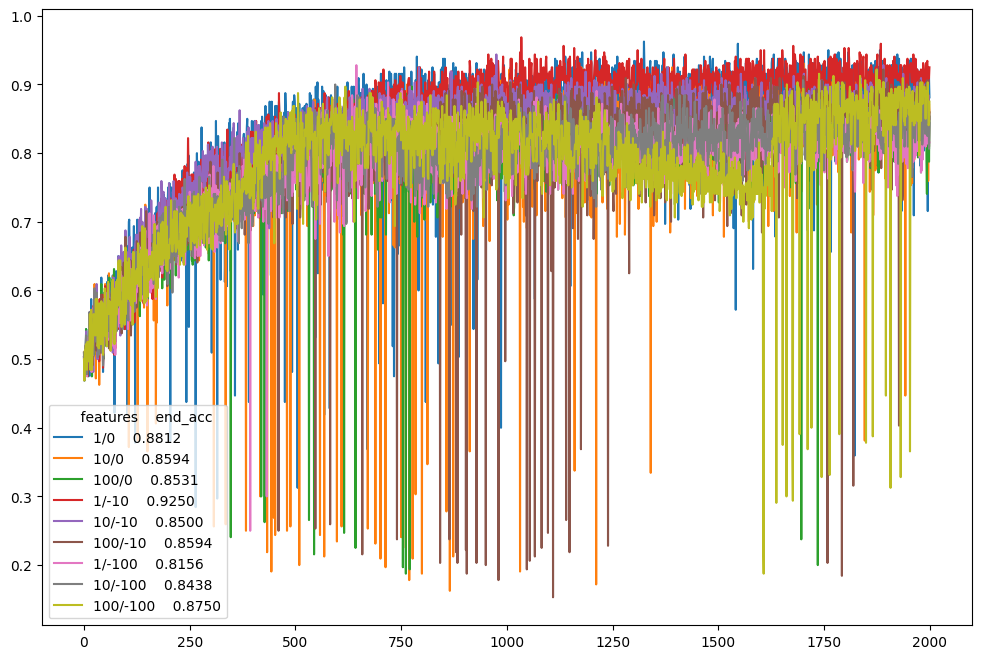

In [28]:
plt.figure(figsize=(12,8))

for i in range(len(rr2df)):
    if i< 1:
        continue
    data = rr2df["progress"][i]
    label = f"{rr2df['reward'][i]}/{rr2df['penalty'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_acc")
plt.show()

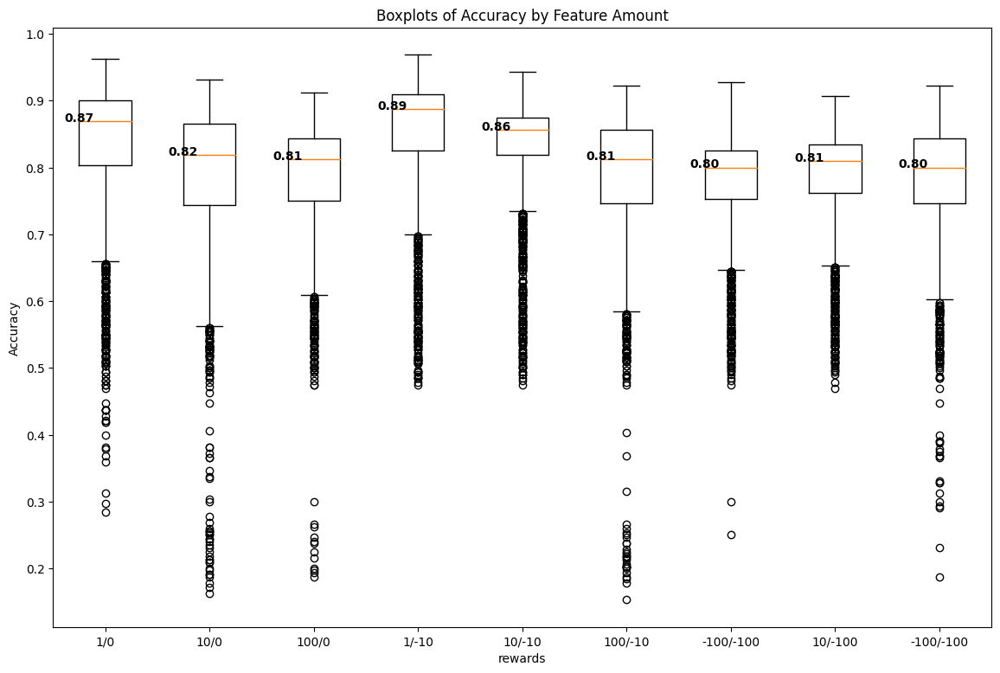

In [67]:
plt.figure(figsize=(14,9))

rr2bpdata = []
rr2bplabels = []

for i in range(len(rr2df)):
    if i< 1:
        continue
    rr2bpdata.append(rr2df["progress"][i])
    rr2bplabels.append(f"{rr2df['reward'][i]}/{rr2df['penalty'][i]}")

bp = plt.boxplot(rr2bpdata, labels=rr2bplabels)

plt.xlabel('rewards')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by Feature Amount')


for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')


plt.show()

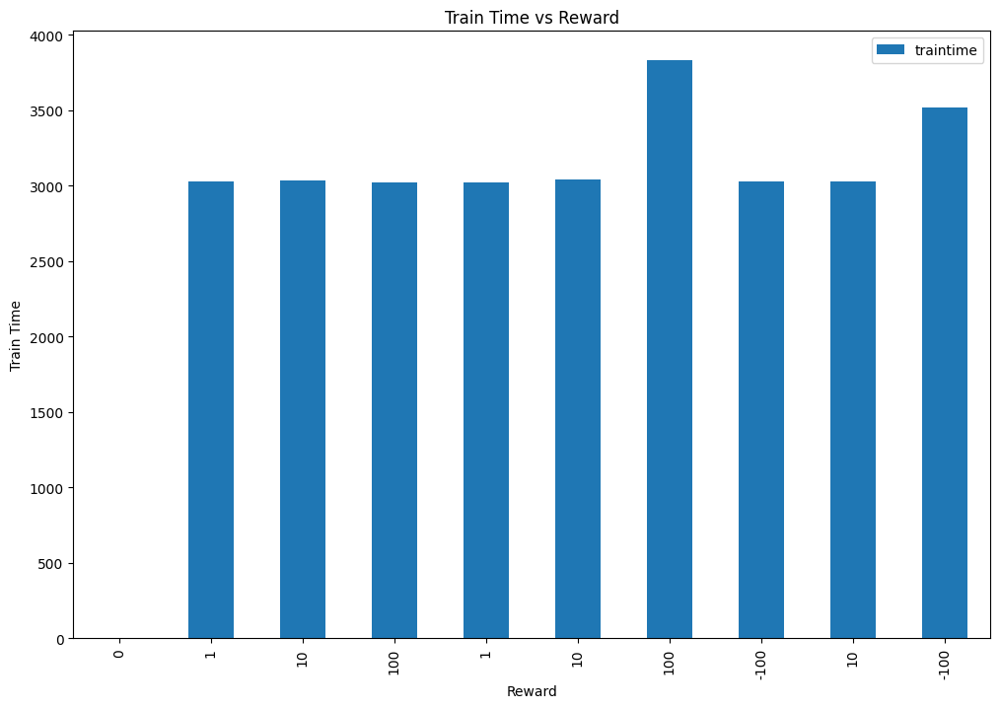

In [41]:
import matplotlib.pyplot as plt

# Create a bar plot of traintime vs reward
rr2df.plot(x='reward', y='traintime', kind='bar', figsize=(12,8))

# Set axis labels and title
plt.xlabel('Reward')
plt.ylabel('Train Time')
plt.title('Train Time vs Reward')

# Show the plot
plt.show()

In [42]:
rr2df["reward","penalty","traintime"]

KeyError: ('reward', 'penalty', 'traintime')

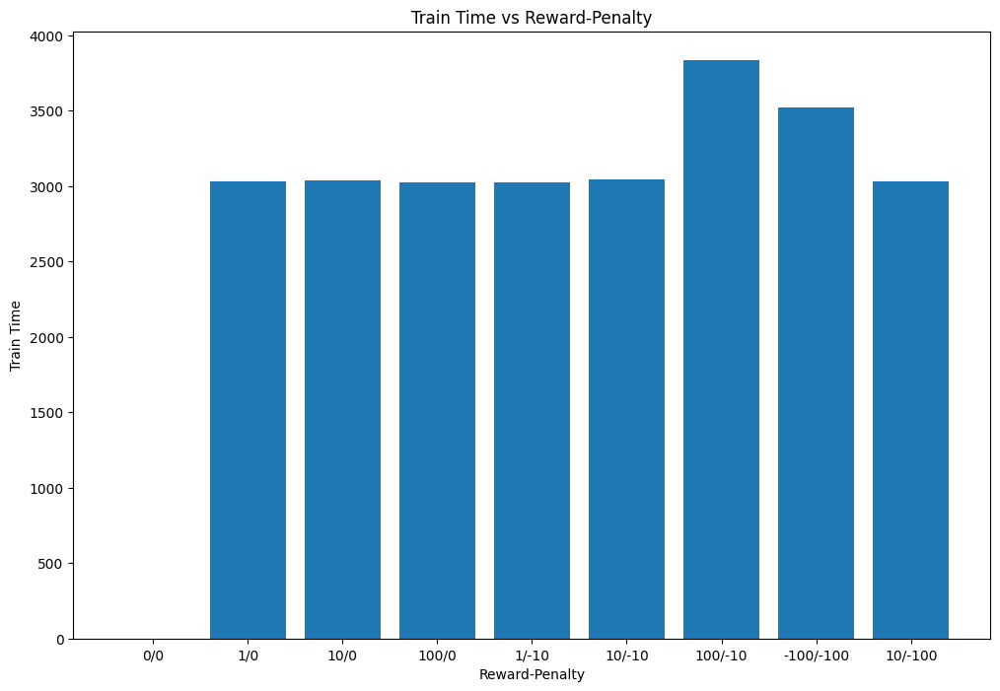

In [44]:
import matplotlib.pyplot as plt

# Extract data
reward = rr2df['reward'].astype(str)
penalty = rr2df['penalty'].astype(str)
traintime = rr2df['traintime']

# Plot data
fig, ax = plt.subplots(figsize=(12, 8))
ax.bar(reward + "/" + penalty, traintime)

# Set labels and title
ax.set_xlabel('Reward-Penalty')
ax.set_ylabel('Train Time')
ax.set_title('Train Time vs Reward-Penalty')

plt.show()

In [51]:
fr2df= pd.read_feather("feature_results_2.feather")
fr2df = fr2df.sort_values('feature_amount').reset_index(drop=True)
fr2df

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,learnrate,feature_amount,prep
0,0.995,0.996,2,32,"[0.51875, 0.48125, 0.478125, 0.49375, 0.540625...","[1.0, 0.9642857142857143, 1.0, 1.0, 1.0, 1.0, ...","[0.4888888888888889, 0.5510204081632653, 0.589...","[0.6567164179104478, 0.7012987012987012, 0.741...",6328.822567,2000,0.009989,1,-10,0.001,3,
1,0.995,0.996,2,32,"[0.51875, 0.48125, 0.4875, 0.496875, 0.546875,...","[1.0, 0.9655172413793104, 1.0, 1.0, 0.96666666...","[0.45454545454545453, 0.56, 0.5818181818181818...","[0.625, 0.7088607594936709, 0.735632183908046,...",2989.015464,2000,0.009989,1,-10,0.001,4,
2,0.995,0.996,2,32,"[0.515625, 0.471875, 0.496875, 0.50625, 0.5406...","[1.0, 0.9642857142857143, 0.96875, 1.0, 0.9629...","[0.4888888888888889, 0.54, 0.5535714285714286,...","[0.6567164179104478, 0.6923076923076923, 0.704...",3003.199440,2000,0.009989,1,-10,0.001,6,
3,0.995,0.996,2,32,"[0.51875, 0.471875, 0.475, 0.496875, 0.553125,...","[1.0, 0.9629629629629629, 0.96875, 1.0, 1.0, 0...","[0.4772727272727273, 0.5416666666666666, 0.574...","[0.6461538461538462, 0.6933333333333334, 0.720...",6197.805833,2000,0.009989,1,-10,0.001,9,
4,0.995,0.996,2,32,"[0.503125, 0.478125, 0.48125, 0.515625, 0.5437...","[1.0, 0.9642857142857143, 0.96875, 1.0, 0.9666...","[0.45652173913043476, 0.5625, 0.57407407407407...","[0.626865671641791, 0.7105263157894737, 0.7209...",3504.494350,2000,0.009989,1,-10,0.001,13,
5,0.995,0.996,2,32,"[0.5125, 0.478125, 0.484375, 0.49375, 0.5375, ...","[1.0, 0.9615384615384616, 1.0, 0.9655172413793...","[0.4883720930232558, 0.5319148936170213, 0.592...","[0.65625, 0.684931506849315, 0.744186046511627...",3048.031306,2000,0.009989,1,-10,0.001,20,
6,0.995,0.996,2,32,"[0.503125, 0.46875, 0.50625, 0.525, 0.509375, ...","[0.9642857142857143, 1.0, 1.0, 1.0, 1.0, 0.968...","[0.4576271186440678, 0.47761194029850745, 0.57...","[0.6206896551724138, 0.6464646464646464, 0.731...",3026.390282,2000,0.009989,1,-10,0.001,31,
7,0.995,0.996,2,32,"[0.509375, 0.471875, 0.475, 0.503125, 0.54375,...","[1.0, 0.9629629629629629, 1.0, 0.9642857142857...","[0.45652173913043476, 0.5416666666666666, 0.57...","[0.626865671641791, 0.6933333333333334, 0.7272...",3030.395959,2000,0.009989,1,-10,0.001,69,
8,0.995,0.996,2,32,"[0.525, 0.471875, 0.471875, 0.503125, 0.528125...","[1.0, 0.9642857142857143, 0.9696969696969697, ...","[0.5, 0.54, 0.5614035087719298, 0.547169811320...","[0.6666666666666666, 0.6923076923076923, 0.711...",3077.428110,2000,0.009989,1,-10,0.001,78,
9,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,0.100000,0,0,0.000,999,norm


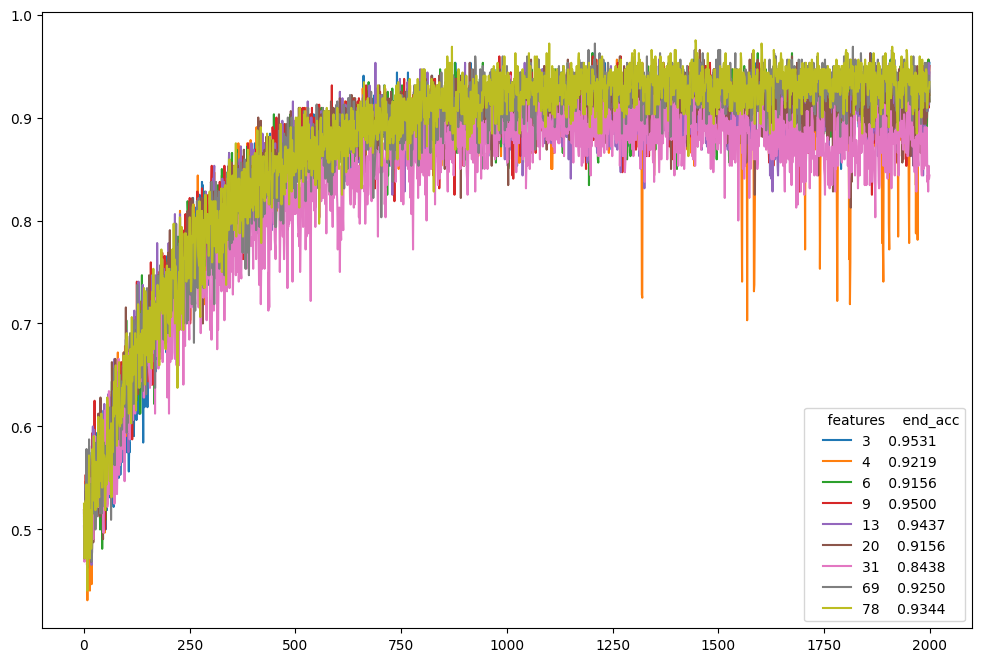

In [38]:
plt.figure(figsize=(12,8))

for i in range(len(fr2df)):
    if i == 9:
        continue
    data = fr2df["accuracy"][i]
    label = f"{fr2df['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_acc")
plt.show()

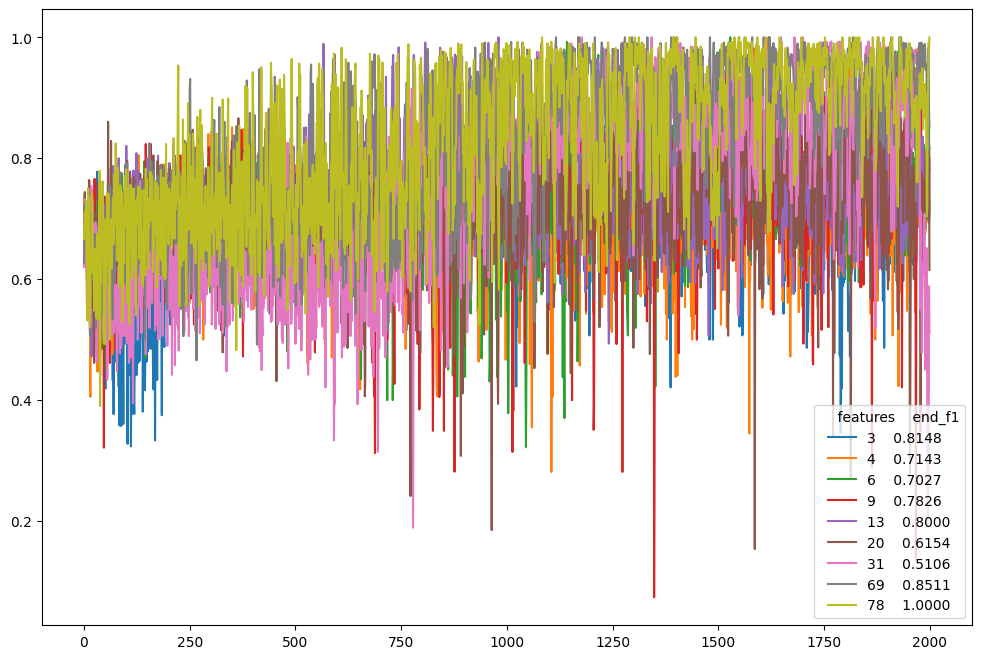

In [39]:
plt.figure(figsize=(12,8))

for i in range(len(fr2df)):
    if i == 9:
        continue
    data = fr2df["f1"][i]
    label = f"{fr2df['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_f1")
plt.show()

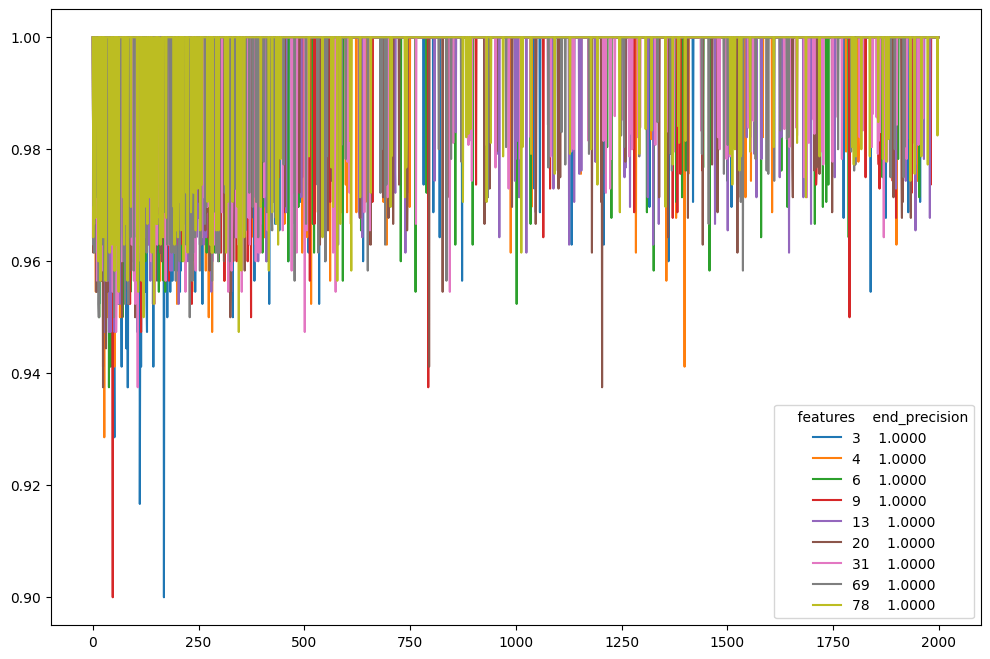

In [26]:
plt.figure(figsize=(12,8))

for i in range(len(fr2df)):
    if i == 9:
        continue
    data = fr2df["precision"][i]
    label = f"{fr2df['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_precision")
plt.show()

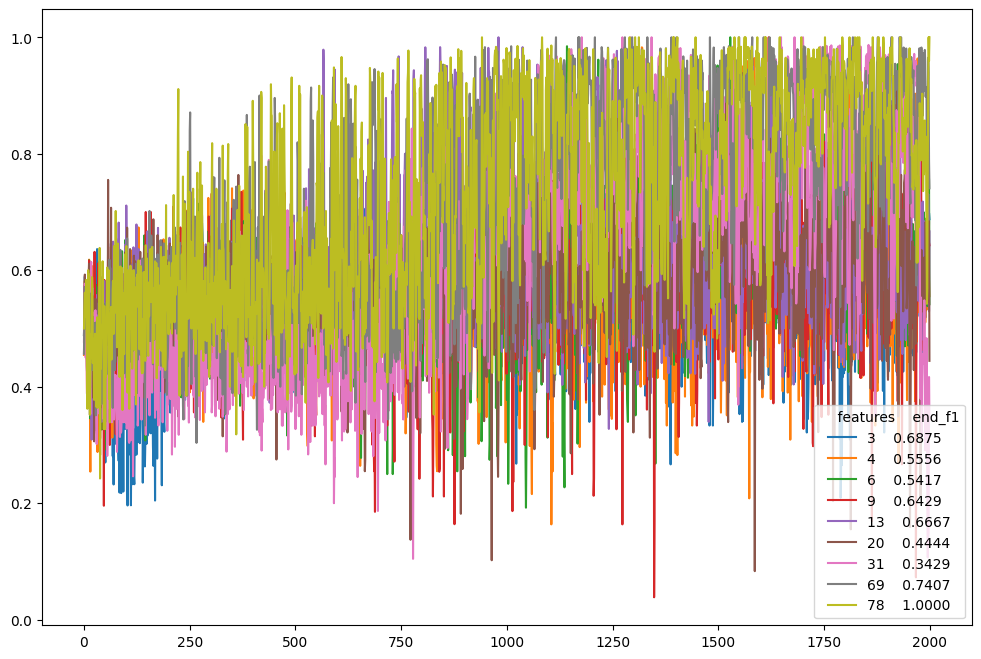

In [27]:
plt.figure(figsize=(12,8))

for i in range(len(fr2df)):
    if i == 9:
        continue
    data = fr2df["recall"][i]
    label = f"{fr2df['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_f1")
plt.show()

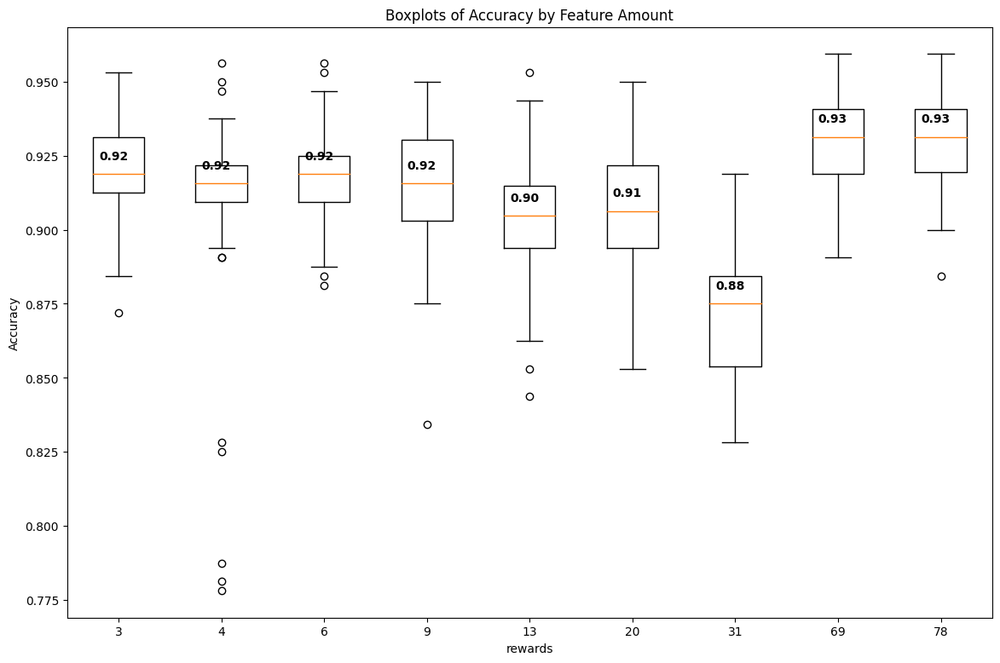

In [52]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr2df)):
    if i== 9:
        continue
    fr2bpdata.append(fr2df["accuracy"][i][-50:])
    fr2bplabels.append(f"{fr2df['feature_amount'][i]}")

bp= plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by Feature Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.2, median_y[0]+0.005, f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

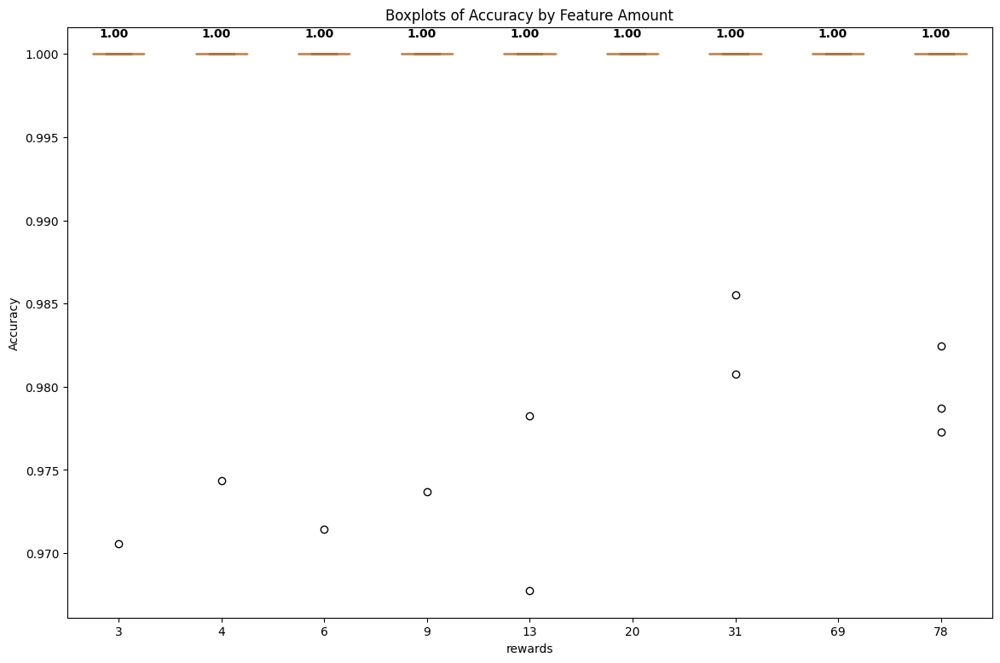

In [54]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr2df)):
    if i== 9:
        continue
    fr2bpdata.append(fr2df["precision"][i][-50:])
    fr2bplabels.append(f"{fr2df['feature_amount'][i]}")

bp= plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by Feature Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.2, median_y[0]+0.001, f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

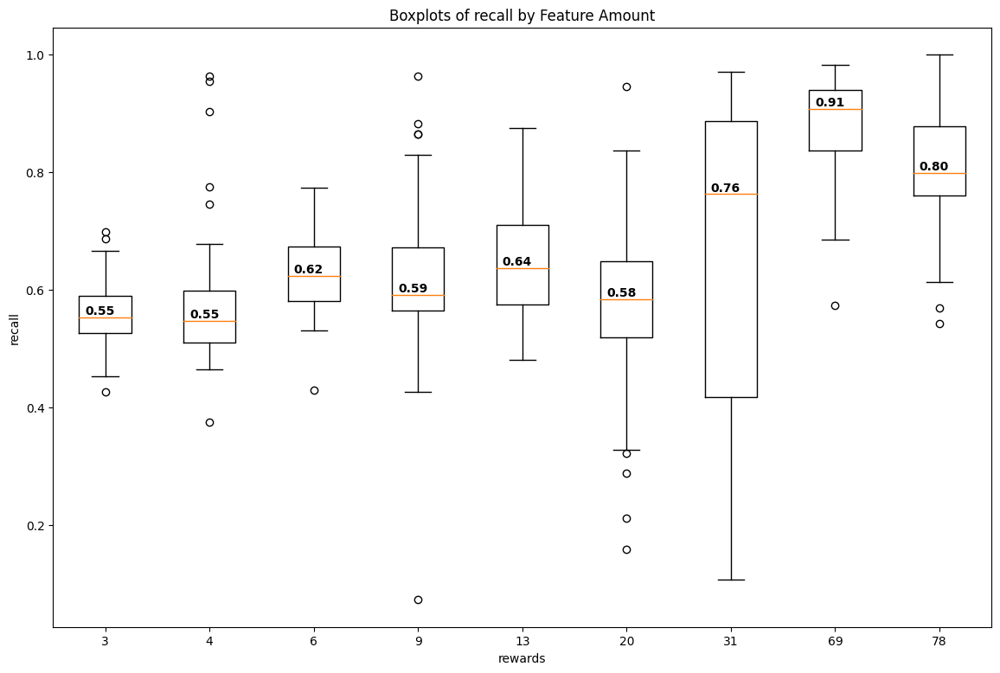

In [55]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr2df)):
    if i== 9:
        continue
    fr2bpdata.append(fr2df["recall"][i][-50:])
    fr2bplabels.append(f"{fr2df['feature_amount'][i]}")

bp= plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('recall')
plt.title('Boxplots of recall by Feature Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.2, median_y[0]+0.005, f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

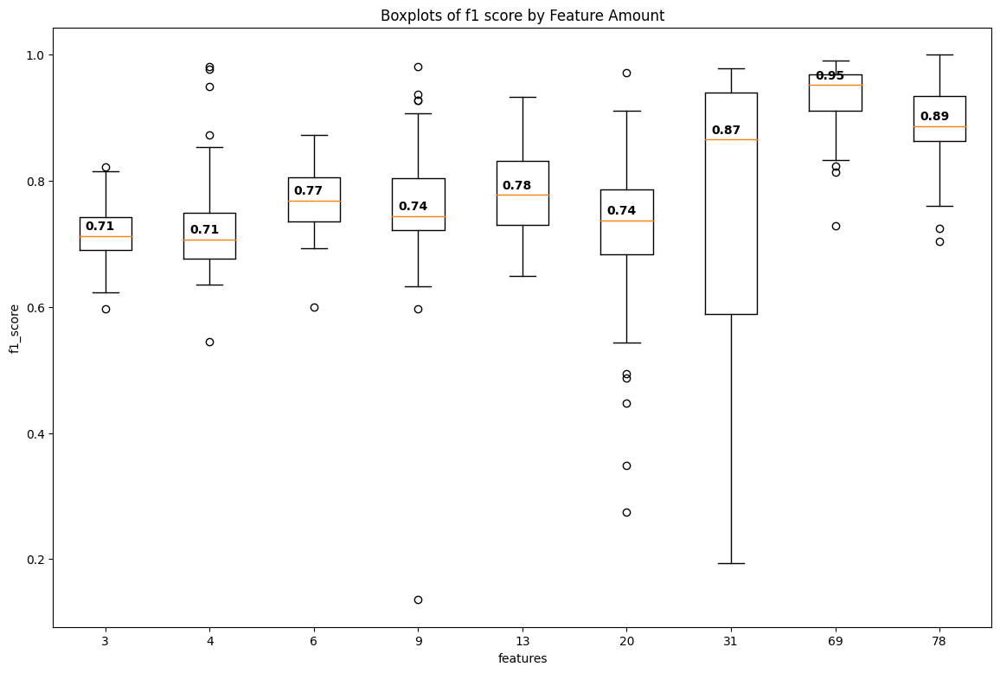

In [56]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr2df)):
    if i ==9:
        continue
    fr2bpdata.append(fr2df["f1"][i][-50:])
    fr2bplabels.append(f"{fr2df['feature_amount'][i]}")

bp =plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('features')
plt.ylabel('f1_score')
plt.title('Boxplots of f1 score by Feature Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.2, median_y[0]+0.01, f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

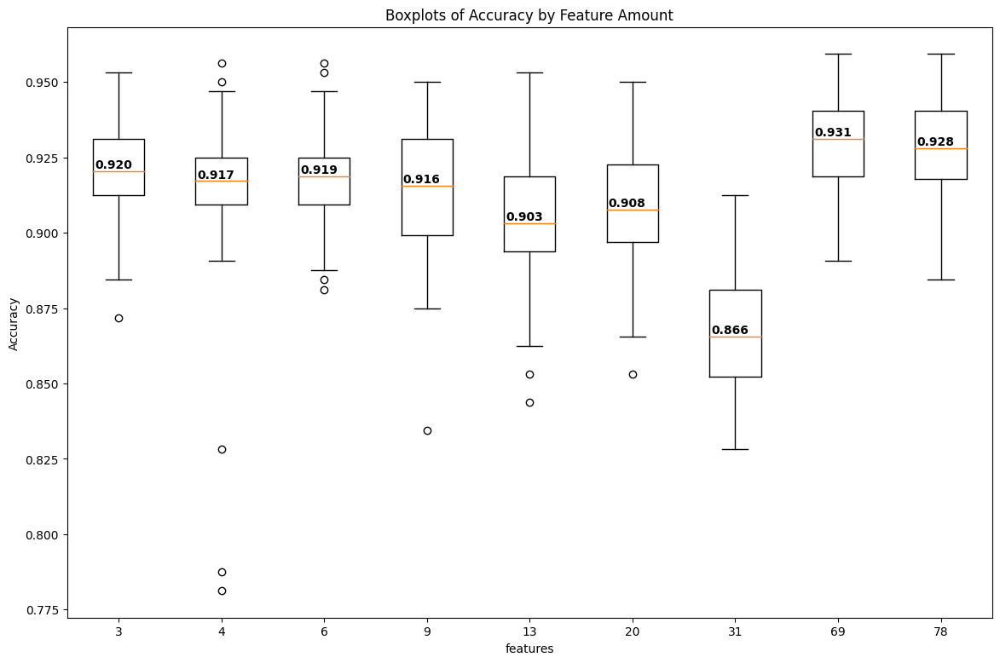

In [19]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr2df)):
    if i == 9:
        continue
    fr2bpdata.append(fr2df["accuracy"][i][-40:])
    fr2bplabels.append(f"{fr2df['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('features')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by Feature Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.2, median_y[0]+0.001, f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')
plt.show()

In [9]:
nr9df= pd.read_feather("neuron_results_9feat.feather")
nr9df

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,0.100000,0,0,0.000,999,norm
1,0.995,0.996,2,2,"[0.5125, 0.471875, 0.48125, 0.5125, 0.525, 0.5...","[0.9523809523809523, 1.0, 0.9705882352941176, ...","[0.46511627906976744, 0.52, 0.5789473684210527...","[0.625, 0.6842105263157895, 0.7252747252747253...",3068.174870,2000,0.009989,1,-10,0.001,9,
2,0.995,0.996,2,4,"[0.51875, 0.475, 0.484375, 0.49375, 0.53125, 0...","[1.0, 0.9629629629629629, 1.0, 0.9655172413793...","[0.4888888888888889, 0.5416666666666666, 0.574...","[0.6567164179104478, 0.6933333333333334, 0.729...",3027.936182,2000,0.009989,1,-10,0.001,9,
3,0.995,0.996,2,8,"[0.51875, 0.475, 0.471875, 0.5125, 0.521875, 0...","[1.0, 0.9629629629629629, 1.0, 0.9629629629629...","[0.4772727272727273, 0.5416666666666666, 0.566...","[0.6461538461538462, 0.6933333333333334, 0.722...",3753.924932,2000,0.009989,1,-10,0.001,9,
4,0.995,0.996,2,16,"[0.515625, 0.51875, 0.509375, 0.5, 0.496875, 0...","[0.9714285714285714, 1.0, 0.9583333333333334, ...","[0.6415094339622641, 0.5813953488372093, 0.450...","[0.7727272727272727, 0.7352941176470588, 0.613...",3020.345926,2000,0.009989,1,-10,0.001,9,
5,0.995,0.996,5,128,"[0.515625, 0.50625, 0.509375, 0.49375, 0.4875,...","[0.9714285714285714, 1.0, 0.96, 0.964285714285...","[0.6296296296296297, 0.5333333333333333, 0.461...","[0.7640449438202247, 0.6956521739130436, 0.623...",3501.408889,2000,0.009989,1,-10,0.001,9,
6,0.995,0.996,10,256,"[0.525, 0.51875, 0.5, 0.465625, 0.484375, 0.52...","[1.0, 0.9565217391304348, 0.9565217391304348, ...","[0.6111111111111112, 0.5, 0.43137254901960786,...","[0.7586206896551725, 0.6567164179104478, 0.594...",6566.649402,2000,0.009989,1,-10,0.001,9,
7,0.995,0.996,4,32,"[0.53125, 0.50625, 0.496875, 0.475, 0.478125, ...","[1.0, 0.9583333333333334, 0.9615384615384616, ...","[0.6415094339622641, 0.5348837209302325, 0.471...","[0.7816091954022989, 0.6865671641791045, 0.632...",4808.872505,2000,0.009989,1,-10,0.001,9,
8,0.995,0.996,4,16,"[0.525, 0.503125, 0.5125, 0.478125, 0.4875, 0....","[0.9714285714285714, 1.0, 0.9615384615384616, ...","[0.6538461538461539, 0.5348837209302325, 0.490...","[0.7816091954022988, 0.6969696969696969, 0.649...",3320.004298,2000,0.009989,1,-10,0.001,9,
9,0.995,0.996,4,8,"[0.525, 0.509375, 0.49375, 0.478125, 0.484375,...","[0.9722222222222222, 0.9545454545454546, 0.961...","[0.6481481481481481, 0.4883720930232558, 0.462...","[0.7777777777777778, 0.6461538461538462, 0.625...",3310.478976,2000,0.009989,1,-10,0.001,9,


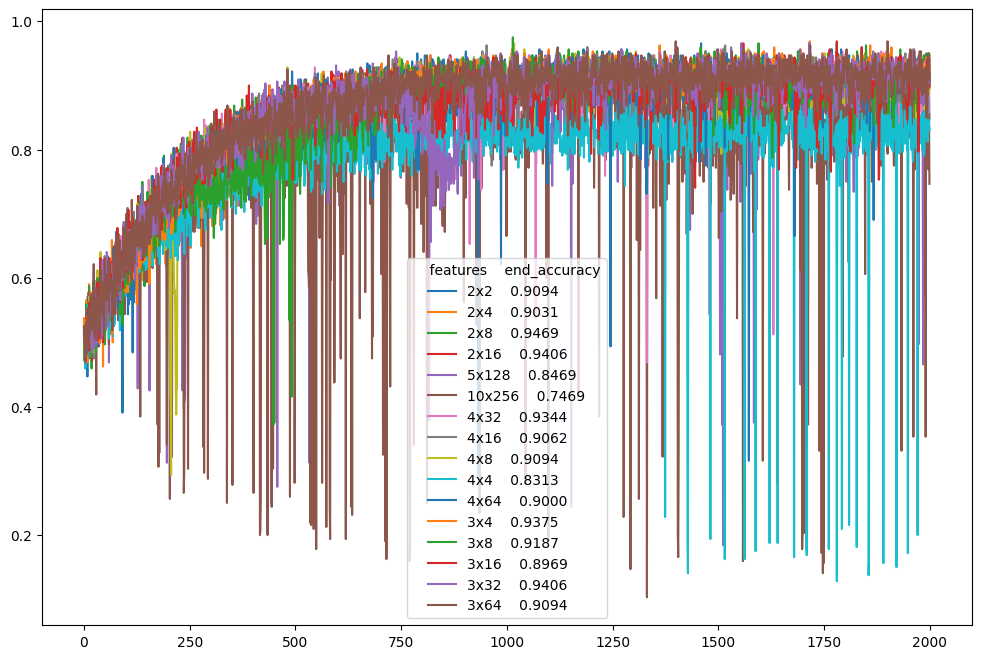

In [10]:
plt.figure(figsize=(12,8))

for i in range(len(nr9df)):
    if i< 1:
        continue
    data = nr9df["accuracy"][i]
    label = f"{nr9df['layers'][i]}x{nr9df['neurons'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_accuracy")
plt.show()

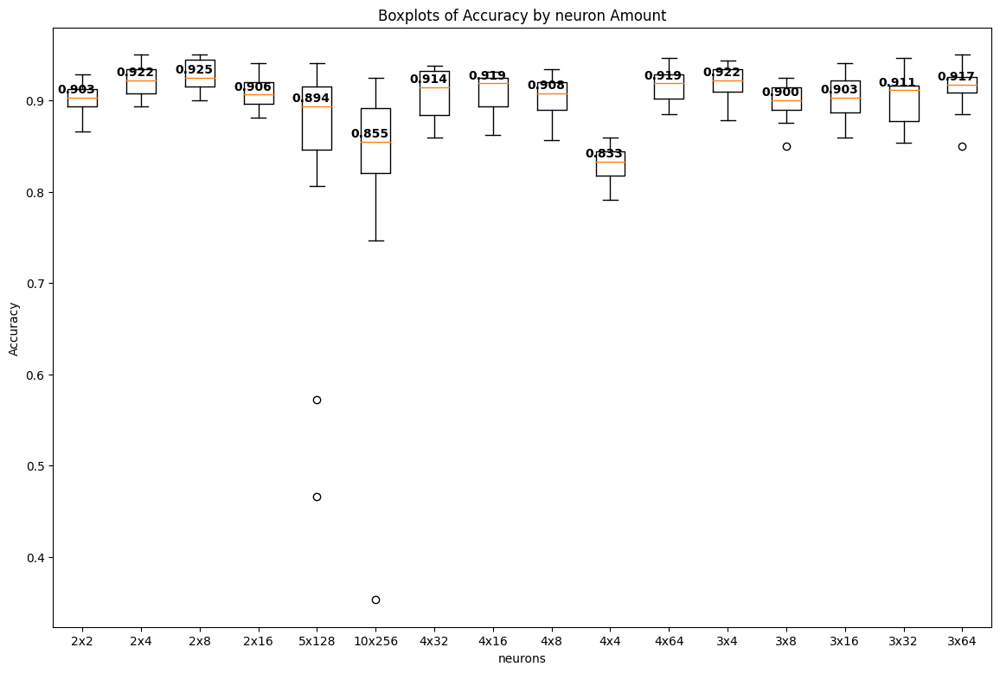

In [11]:
plt.figure(figsize=(14,9))

nr9bpdata = []
nr9bplabels = []

for i in range(len(nr9df)):
    if i< 1:
        continue
    nr9bpdata.append(nr9df["accuracy"][i][-20:])
    nr9bplabels.append(f"{nr9df['layers'][i]}x{nr9df['neurons'][i]}")

bp =plt.boxplot(nr9bpdata, labels=nr9bplabels)

plt.xlabel('neurons')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by neuron Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.15, median_y[0]+0.005, f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

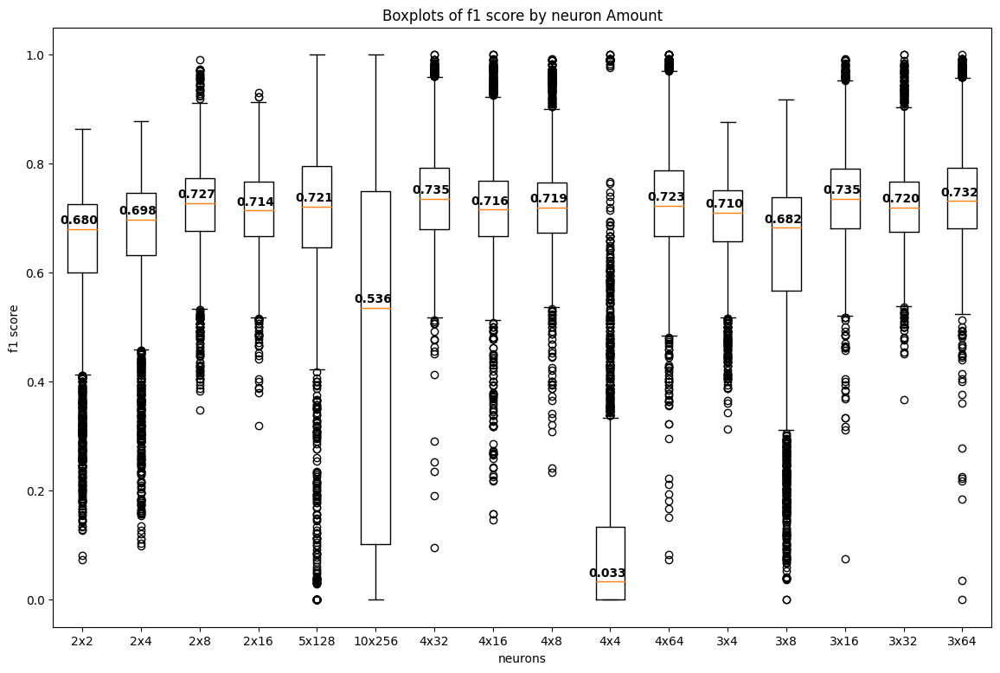

In [19]:
plt.figure(figsize=(14,9))

nr9bpdata = []
nr9bplabels = []

for i in range(len(nr9df)):
    if i< 1:
        continue
    nr9bpdata.append(nr9df["f1"][i])
    nr9bplabels.append(f"{nr9df['layers'][i]}x{nr9df['neurons'][i]}")

bp= plt.boxplot(nr9bpdata, labels=nr9bplabels)

plt.xlabel('neurons')
plt.ylabel('f1 score')
plt.title('Boxplots of f1 score by neuron Amount')

for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0]+0.2, median_y[0]+0.01, f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

In [3]:
fr1337df= pd.read_feather("feature_results_1337.feather")
fr1337df

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,0.100000,0,0,0.000,999,norm
1,0.995,0.996,2,32,"[0.528125, 0.525, 0.5125, 0.46875, 0.490625, 0...","[0.9714285714285714, 1.0, 1.0, 1.0, 1.0, 0.972...","[0.6415094339622641, 0.5454545454545454, 0.458...","[0.7727272727272727, 0.7058823529411764, 0.628...",3105.069492,2000,0.009989,1,-10,0.001,78,
2,0.995,0.996,2,32,"[0.5125, 0.509375, 0.5, 0.475, 0.4875, 0.5375,...","[0.972972972972973, 1.0, 0.96, 1.0, 1.0, 0.974...","[0.6545454545454545, 0.5121951219512195, 0.461...","[0.782608695652174, 0.6774193548387097, 0.6233...",6629.432121,2000,0.009989,1,-10,0.001,69,
3,0.995,0.996,2,32,"[0.51875, 0.509375, 0.5125, 0.4875, 0.4875, 0....","[0.9714285714285714, 1.0, 1.0, 1.0, 0.96296296...","[0.6296296296296297, 0.5365853658536586, 0.5, ...","[0.7640449438202247, 0.6984126984126985, 0.666...",3038.787390,2000,0.009989,1,-10,0.001,9,
4,0.995,0.996,2,32,"[0.525, 0.484375, 0.509375, 0.484375, 0.4875, ...","[0.9714285714285714, 0.9473684210526315, 1.0, ...","[0.6415094339622641, 0.4090909090909091, 0.403...","[0.7727272727272727, 0.5714285714285715, 0.575...",3032.030103,2000,0.009989,1,-10,0.001,13,
5,0.995,0.996,2,32,"[0.521875, 0.5, 0.509375, 0.496875, 0.503125, ...","[0.9714285714285714, 0.9523809523809523, 0.958...","[0.6415094339622641, 0.47619047619047616, 0.43...","[0.7727272727272727, 0.634920634920635, 0.5974...",3060.464210,2000,0.009989,1,-10,0.001,3,
6,0.995,0.996,2,32,"[0.525, 0.515625, 0.4875, 0.478125, 0.46875, 0...","[0.9705882352941176, 1.0, 0.9615384615384616, ...","[0.6346153846153846, 0.5476190476190477, 0.462...","[0.7674418604651162, 0.7076923076923077, 0.625...",3037.439023,2000,0.009989,1,-10,0.001,6,
7,0.995,0.996,2,32,"[0.528125, 0.5125, 0.496875, 0.465625, 0.48437...","[1.0, 0.9583333333333334, 0.9615384615384616, ...","[0.6415094339622641, 0.5348837209302325, 0.454...","[0.7816091954022989, 0.6865671641791045, 0.617...",3039.173225,2000,0.009989,1,-10,0.001,4,


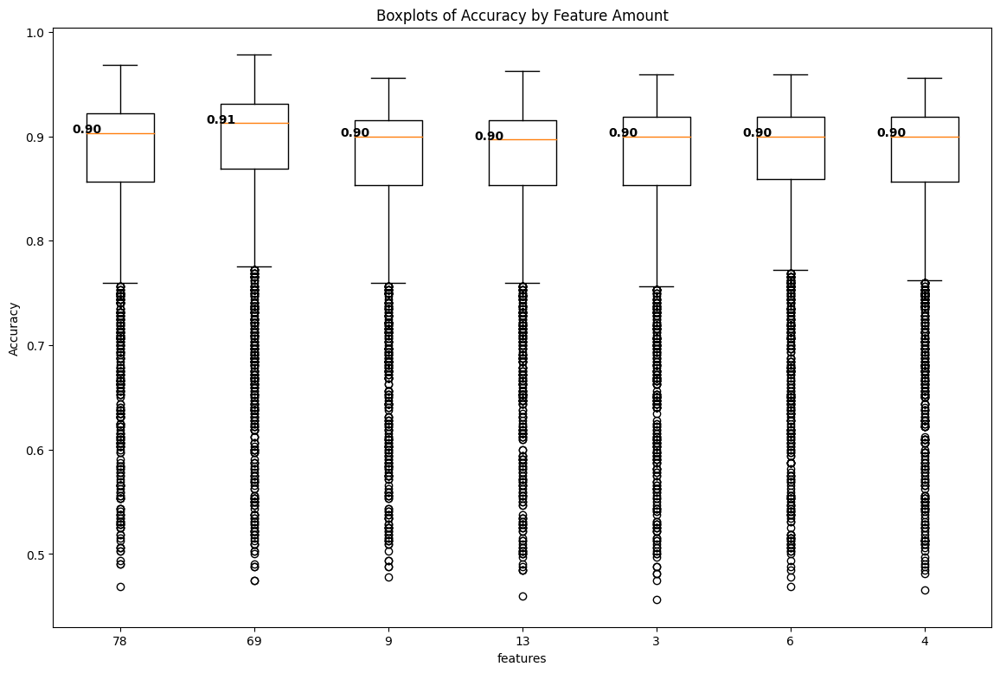

In [4]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr1337df)):
    if i == 0:
        continue
    fr2bpdata.append(fr1337df["accuracy"][i])
    fr2bplabels.append(f"{fr1337df['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('features')
plt.ylabel('Accuracy')
plt.title('Boxplots of Accuracy by Feature Amount')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()



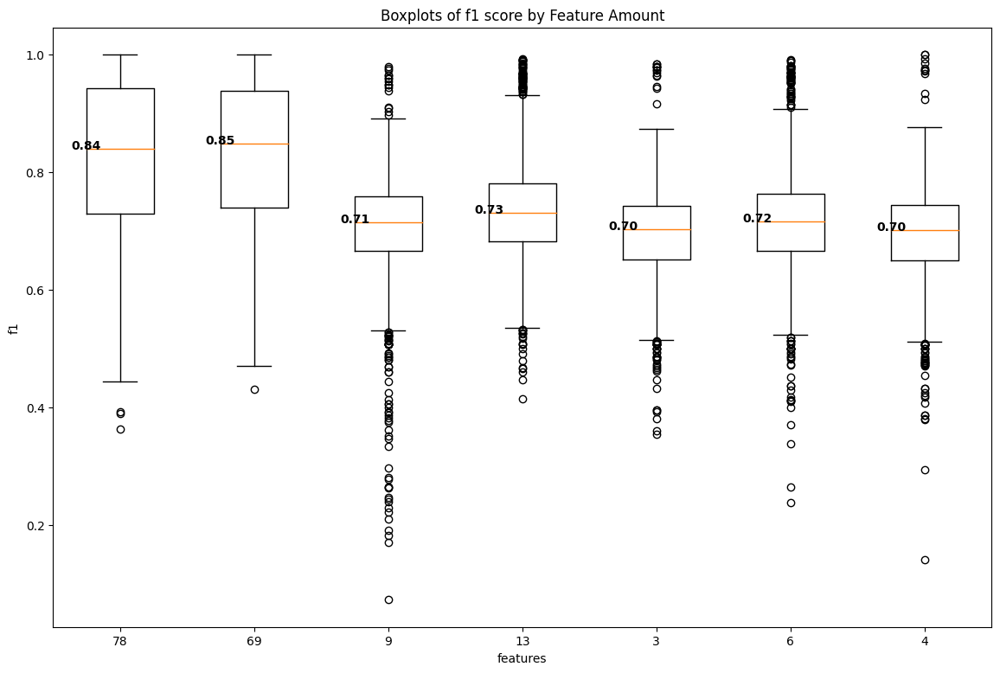

In [25]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(fr1337df)):
    if i == 0:
        continue
    fr2bpdata.append(fr1337df["f1"][i])
    fr2bplabels.append(f"{fr1337df['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('features')
plt.ylabel('f1')
plt.title('Boxplots of f1 score by Feature Amount')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()


In [13]:
er = pd.read_feather("exploration_results_9feat.feather")
er

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,atk_reward,atk_pen,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,1.000000e-01,1,-10,0,0,0.001,999,norm
1,0.995,0.996,4,16,"[0.534375, 0.51875, 0.5, 0.4625, 0.478125, 0.5...","[1.0, 1.0, 1.0, 1.0, 1.0, 0.972972972972973, 1...","[0.6481481481481481, 0.5348837209302325, 0.44,...","[0.7865168539325843, 0.6969696969696969, 0.611...",3314.439584,2000,9.989496e-03,1,-10,0,0,0.001,9,
2,0.999,0.996,4,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",4978.442008,2000,6.168501e-07,1,-10,0,0,0.001,9,cos


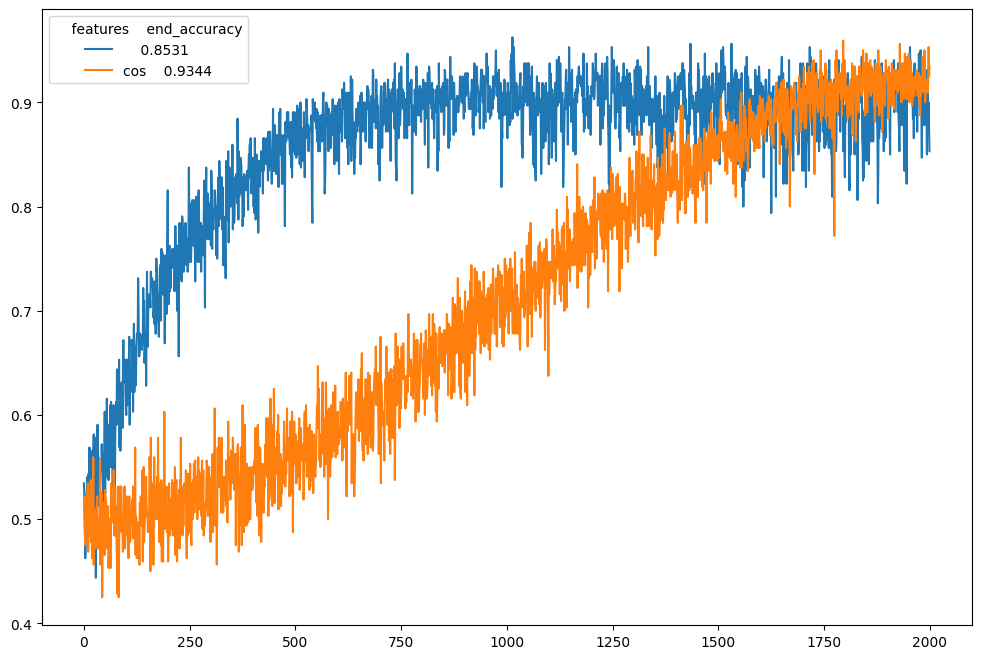

In [14]:
plt.figure(figsize=(12,8))

for i in range(len(er)):
    if i< 1:
        continue
    data = er["accuracy"][i]
    label = f"{er['prep'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_accuracy")
plt.show()

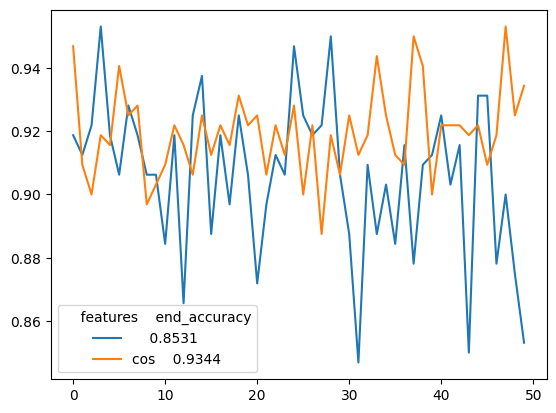

In [15]:
for i in range(len(er)):
    if i< 1:
        continue
    data = er["accuracy"][i][-50:]
    label = f"{er['prep'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_accuracy")
plt.show()

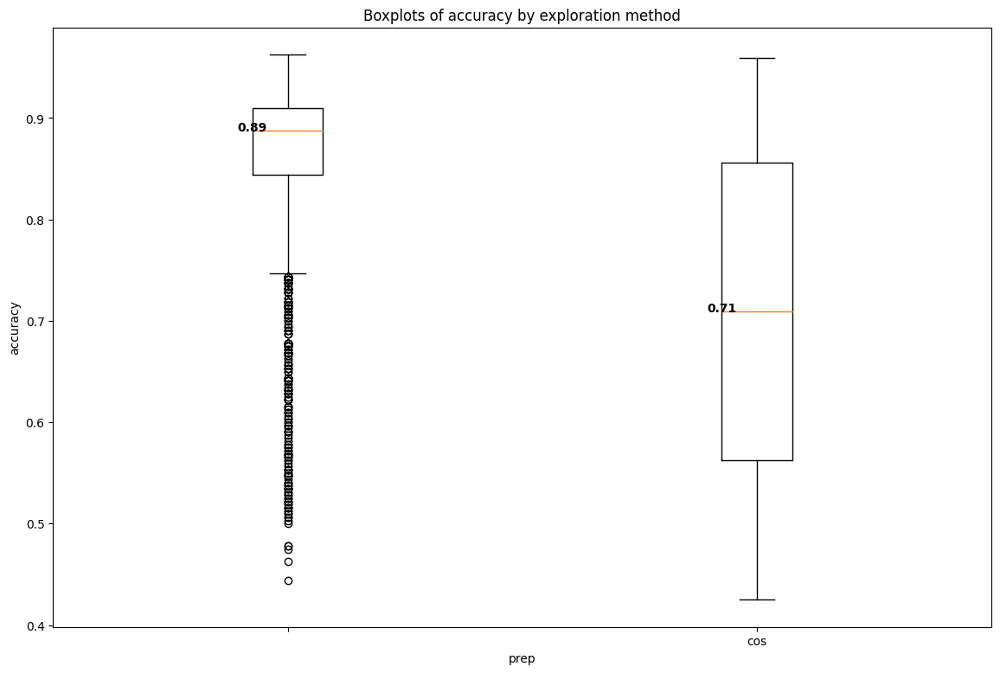

In [16]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(er)):
    if i == 0:
        continue
    fr2bpdata.append(er["accuracy"][i])
    fr2bplabels.append(f"{er['prep'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('prep')
plt.ylabel('accuracy')
plt.title('Boxplots of accuracy by exploration method')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

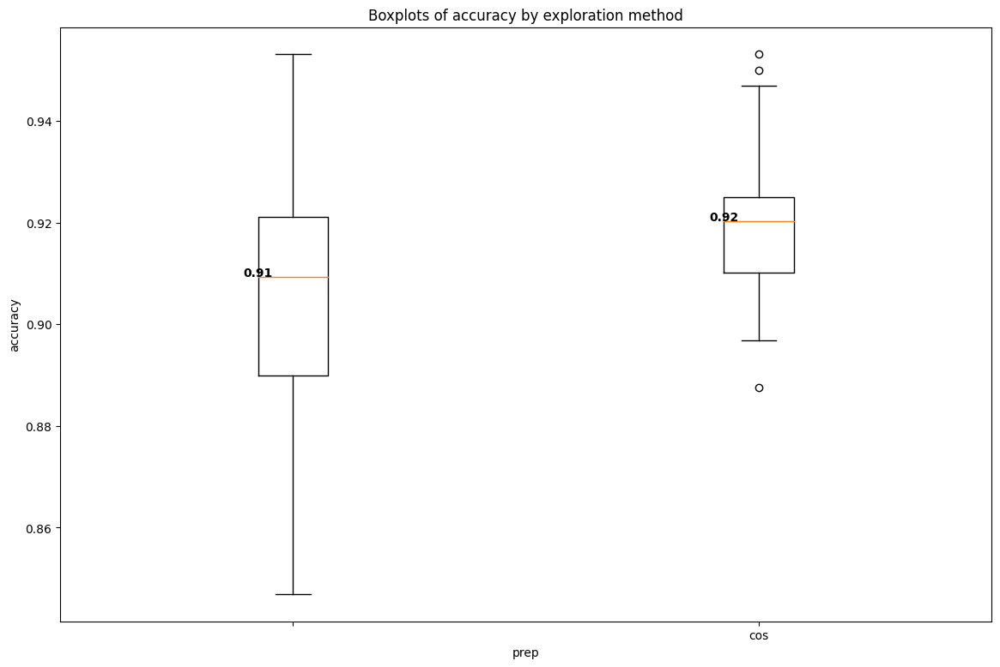

In [18]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(er)):
    if i == 0:
        continue
    fr2bpdata.append(er["accuracy"][i][-50:])
    fr2bplabels.append(f"{er['prep'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('prep')
plt.ylabel('accuracy')
plt.title('Boxplots of accuracy by exploration method')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

In [10]:
arr = pd.read_feather("atk_reward_results.feather")
arr

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,atk_reward,atk_pen,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,1.000000e-01,1,-10,0,0,0.001,999,norm
1,0.999,0.996,3,16,"[0.525, 0.50625, 0.4875, 0.475, 0.478125, 0.52...","[0.9714285714285714, 1.0, 1.0, 1.0, 0.96296296...","[0.6415094339622641, 0.5348837209302325, 0.450...","[0.7727272727272727, 0.6969696969696969, 0.621...",2914.342825,2000,6.168501e-07,1,-10,1,-10,0.001,69,cos
2,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2925.876138,2000,6.168501e-07,1,-10,1,-100,0.001,69,cos
3,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2920.418348,2000,6.168501e-07,1,-10,1,-20,0.001,69,cos
4,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2910.268094,2000,6.168501e-07,1,-10,1,-15,0.001,69,cos
5,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2899.398350,2000,6.168501e-07,1,-10,10,-10,0.001,69,cos
6,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2875.003888,2000,6.168501e-07,1,-10,20,-10,0.001,69,cos
7,0.999,0.996,3,16,"[0.528125, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9722222222222222, 1.0, 0.9565217391304348, ...","[0.6481481481481481, 0.5454545454545454, 0.44,...","[0.7777777777777778, 0.7058823529411764, 0.602...",2883.361903,2000,6.168501e-07,1,-10,50,-10,0.001,69,cos
8,0.999,0.996,3,16,"[0.525, 0.50625, 0.484375, 0.475, 0.478125, 0....","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2912.808568,2000,6.168501e-07,1,-10,1,-30,0.001,69,
9,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",4243.022935,2000,6.168501e-07,1,-10,1,-25,0.001,69,


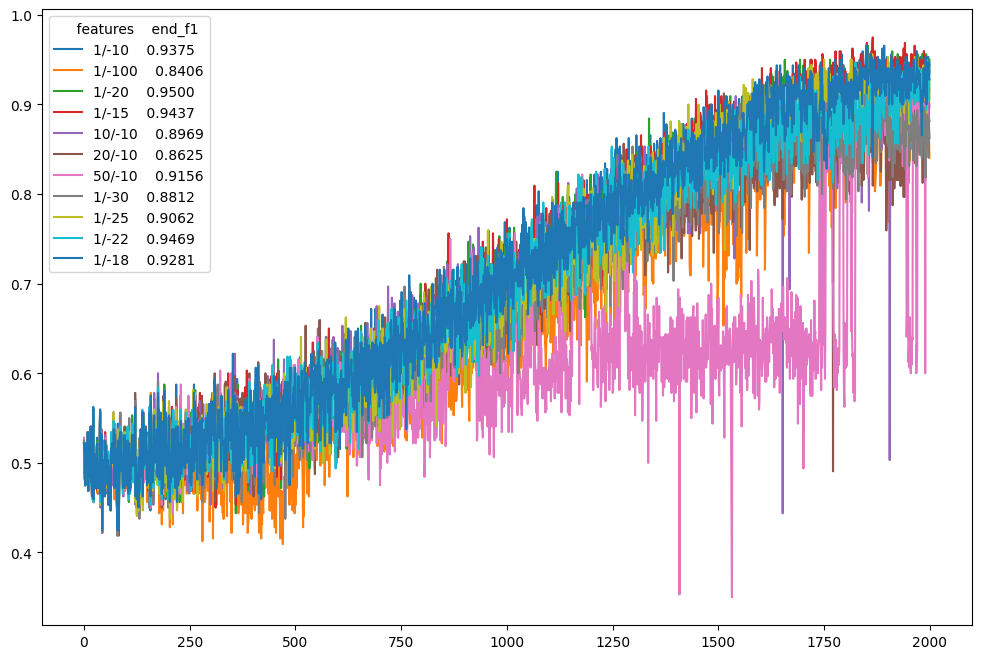

In [13]:
plt.figure(figsize=(12,8))

for i in range(len(arr)):
    if i< 1:
        continue
    data = arr["accuracy"][i]
    label = f"{arr['atk_reward'][i]}/{arr['atk_pen'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_f1")
plt.show()

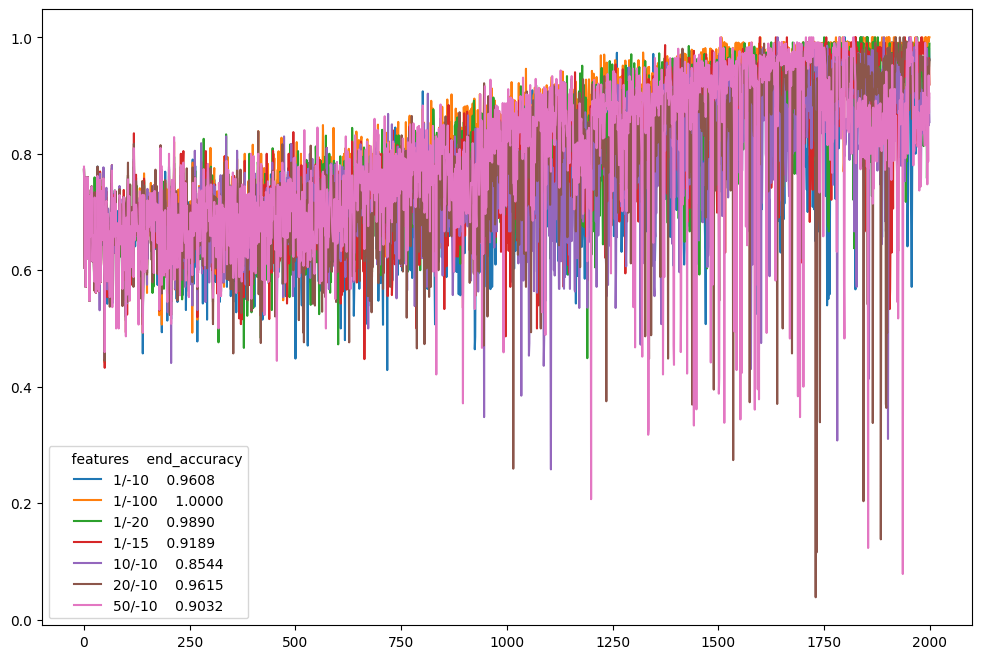

In [4]:
plt.figure(figsize=(12,8))

for i in range(len(arr)):
    if i< 1:
        continue
    data = arr["f1"][i]
    label = f"{arr['atk_reward'][i]}/{arr['atk_pen'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_accuracy")
plt.show()

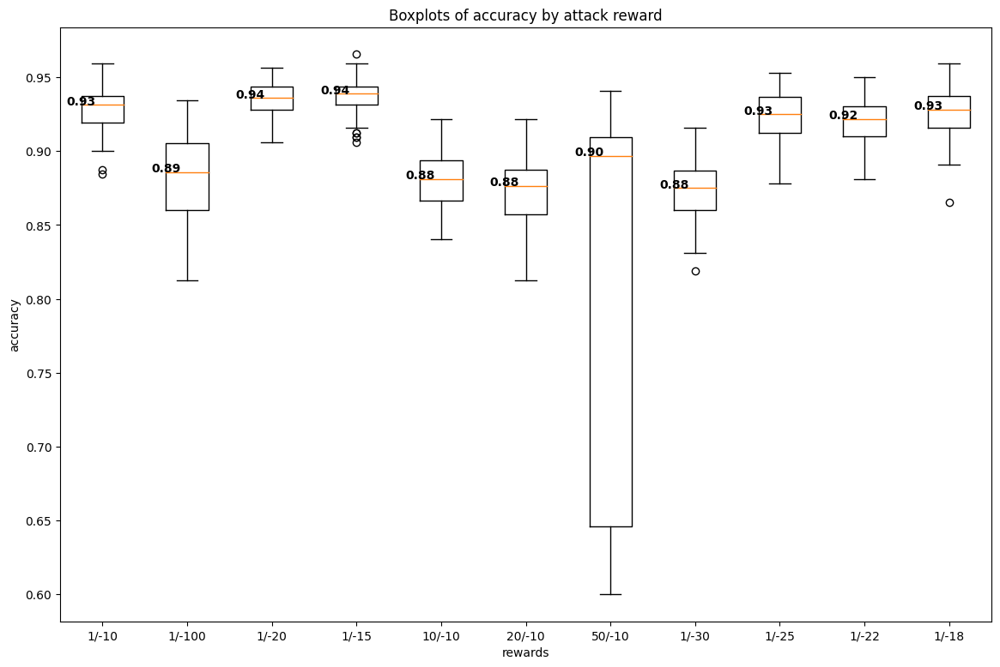

In [14]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(arr)):
    if i == 0:
        continue
    fr2bpdata.append(arr["accuracy"][i][-50:])
    fr2bplabels.append(f"{arr['atk_reward'][i]}/{arr['atk_pen'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('accuracy')
plt.title('Boxplots of accuracy by attack reward')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

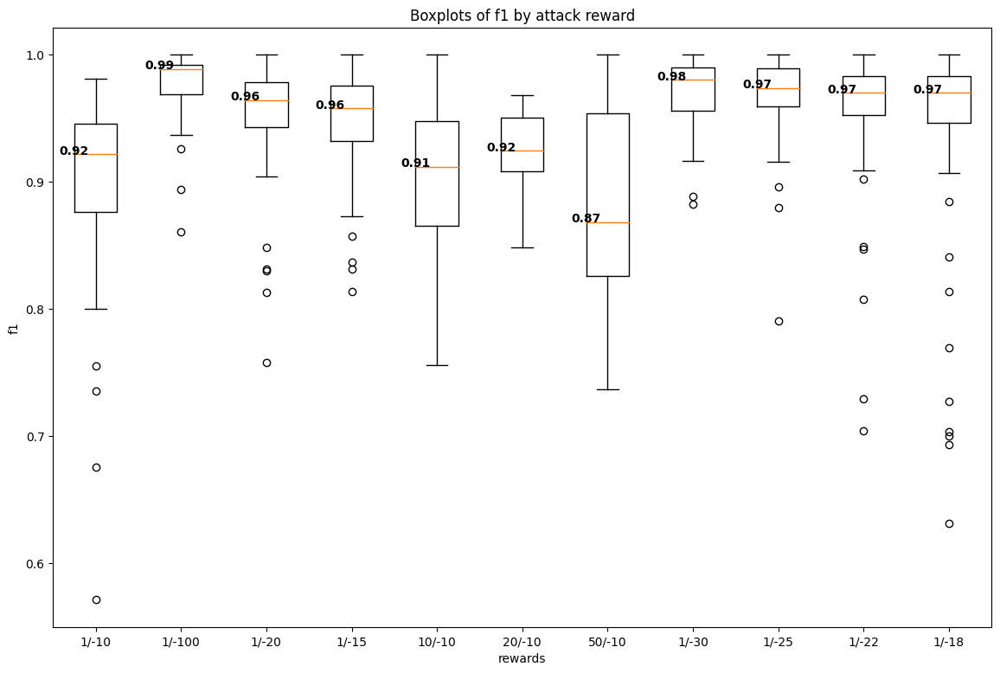

In [12]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(arr)):
    if i == 0:
        continue
    fr2bpdata.append(arr["f1"][i][-50:])
    fr2bplabels.append(f"{arr['atk_reward'][i]}/{arr['atk_pen'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('f1')
plt.title('Boxplots of f1 by attack reward')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.2f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

In [43]:
dqn_feat = pd.read_feather("dqn_features_results.feather")
dqn_feat

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,atk_reward,atk_pen,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,1.000000e-01,1,-10,0,0,0.001,999,norm
1,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2891.544568,2000,6.168501e-07,1,-10,1,-20,0.001,69,
2,0.999,0.996,3,16,"[0.453125, 0.475, 0.51875, 0.490625, 0.5125, 0...","[0.9629629629629629, 1.0, 0.9714285714285714, ...","[0.4406779661016949, 0.4307692307692308, 0.596...","[0.6046511627906976, 0.6021505376344086, 0.739...",2885.740668,2000,6.168501e-07,1,-10,1,-20,0.001,31,
3,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2882.422409,2000,6.168501e-07,1,-10,1,-20,0.001,13,
4,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2904.308386,2000,6.168501e-07,1,-10,1,-20,0.001,9,
5,0.999,0.996,3,16,"[0.521875, 0.50625, 0.4875, 0.475, 0.478125, 0...","[0.9714285714285714, 1.0, 1.0, 1.0, 0.96296296...","[0.6296296296296297, 0.5348837209302325, 0.450...","[0.7640449438202247, 0.6969696969696969, 0.621...",3608.999870,2000,6.168501e-07,1,-10,1,-20,0.001,6,
6,0.999,0.996,3,16,"[0.51875, 0.50625, 0.484375, 0.475, 0.478125, ...","[0.9722222222222222, 1.0, 0.9565217391304348, ...","[0.6363636363636364, 0.5454545454545454, 0.44,...","[0.7692307692307692, 0.7058823529411764, 0.602...",2895.443056,2000,6.168501e-07,1,-10,1,-20,0.001,4,
7,0.999,0.996,3,16,"[0.521875, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2901.348135,2000,6.168501e-07,1,-10,1,-20,0.001,3,


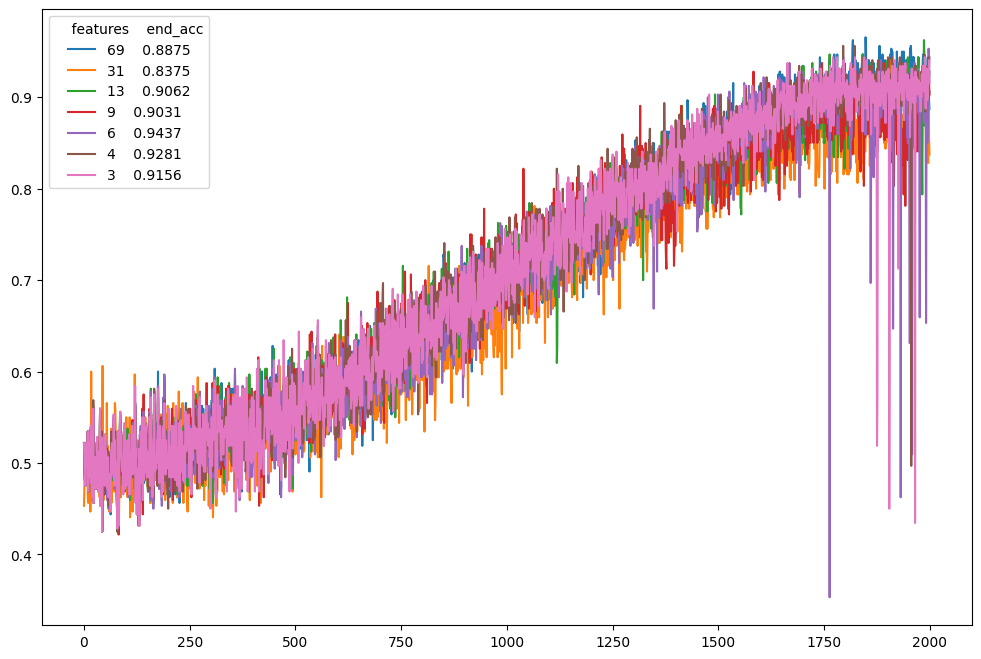

In [44]:
plt.figure(figsize=(12,8))

for i in range(len(dqn_feat)):
    if i< 1:
        continue
    data = dqn_feat["accuracy"][i]
    label = f"{dqn_feat['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_acc")
plt.show()

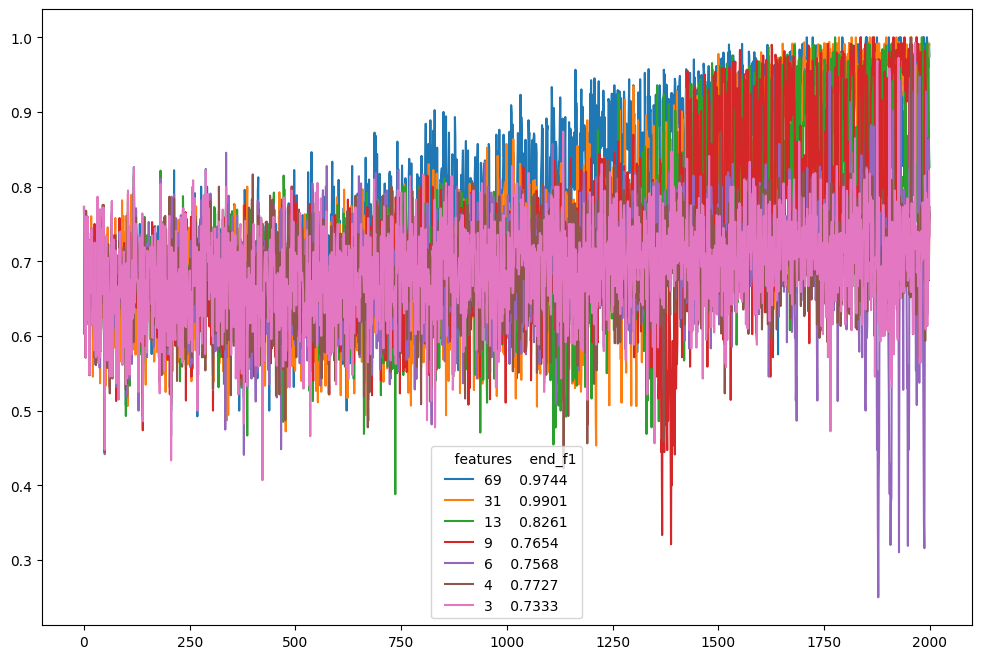

In [45]:
plt.figure(figsize=(12,8))

for i in range(len(dqn_feat)):
    if i< 1:
        continue
    data = dqn_feat["f1"][i]
    label = f"{dqn_feat['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_f1")
plt.show()

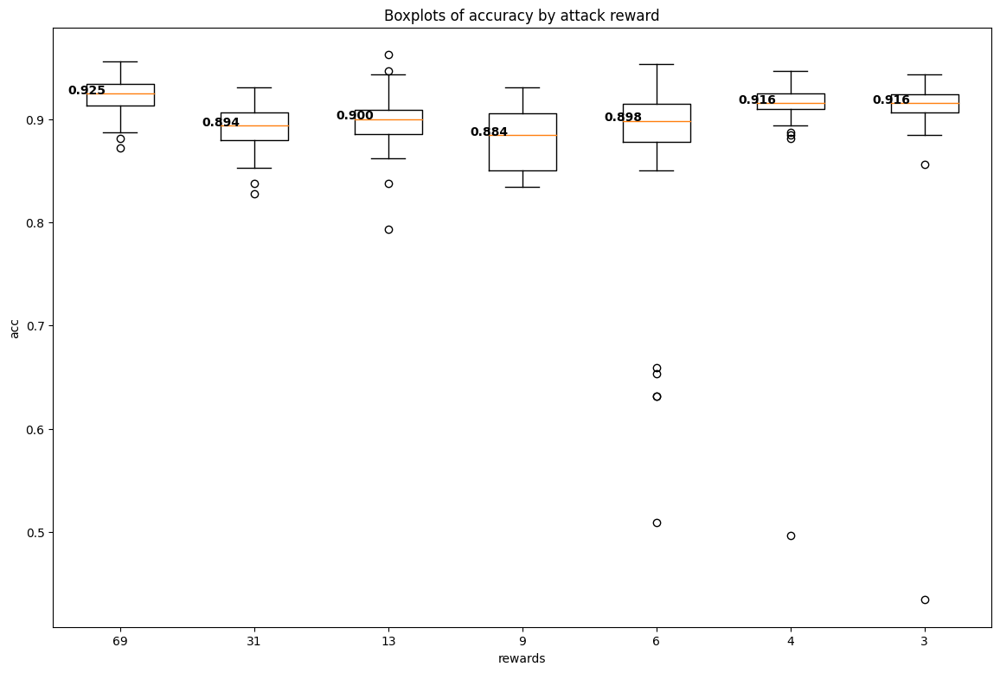

In [59]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(dqn_feat)):
    if i == 0:
        continue
    fr2bpdata.append(dqn_feat["accuracy"][i][-50:])
    fr2bplabels.append(f"{dqn_feat['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('acc')
plt.title('Boxplots of accuracy by attack reward')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

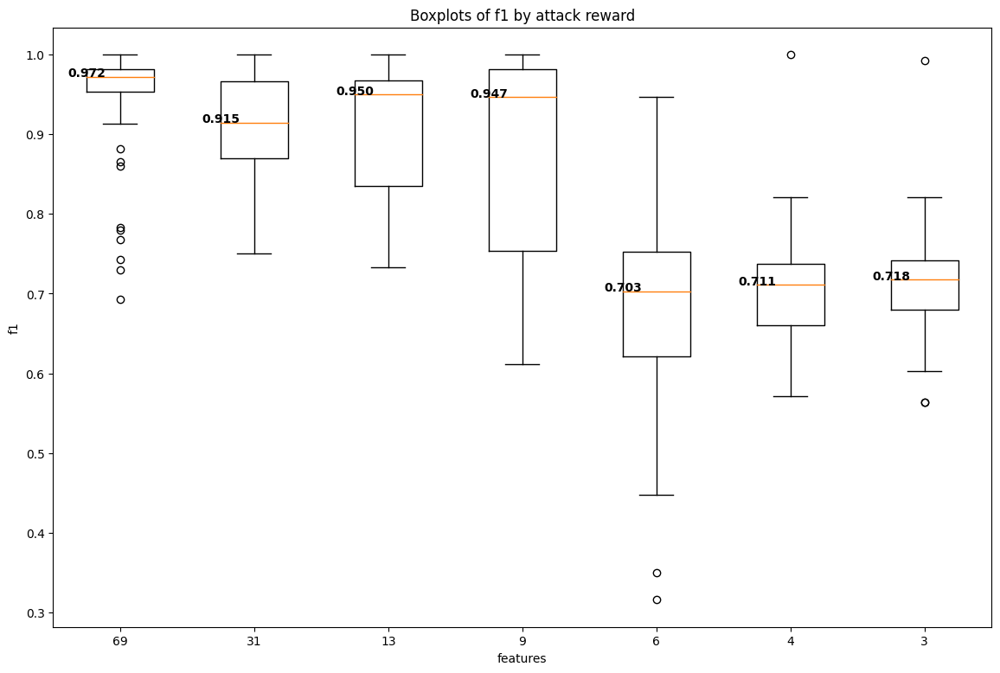

In [60]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(dqn_feat)):
    if i == 0:
        continue
    fr2bpdata.append(dqn_feat["f1"][i][-50:])
    fr2bplabels.append(f"{dqn_feat['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('features')
plt.ylabel('f1')
plt.title('Boxplots of f1 by attack reward')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

In [37]:
ddqn_feat = pd.read_feather("ddqn_features_results.feather")
ddqn_feat

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,atk_reward,atk_pen,learnrate,feature_amount,prep
0,0.010,0.010,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,10,1.000000e-01,1,-10,0,0,0.001,999,norm
1,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2879.047131,2000,6.168501e-07,1,-10,1,-20,0.001,3,
2,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2891.997809,2000,6.168501e-07,1,-10,1,-20,0.001,4,
3,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2905.404547,2000,6.168501e-07,1,-10,1,-20,0.001,6,
4,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2916.571983,2000,6.168501e-07,1,-10,1,-20,0.001,9,
5,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2910.679738,2000,6.168501e-07,1,-10,1,-20,0.001,13,
6,0.999,0.996,3,16,"[0.45625, 0.478125, 0.515625, 0.49375, 0.50312...","[1.0, 0.9666666666666667, 1.0, 0.9677419354838...","[0.4406779661016949, 0.4393939393939394, 0.589...","[0.611764705882353, 0.6041666666666667, 0.7415...",3751.724462,2000,6.168501e-07,1,-10,1,-20,0.001,31,
7,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",2903.706180,2000,6.168501e-07,1,-10,1,-20,0.001,69,


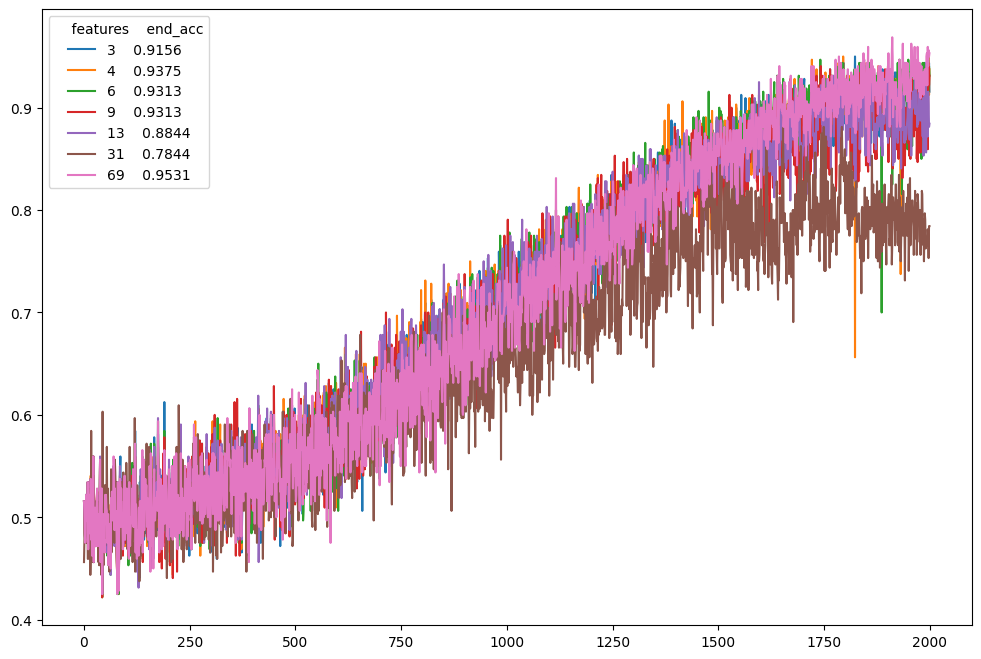

In [38]:
plt.figure(figsize=(12,8))

for i in range(len(ddqn_feat)):
    if i< 1:
        continue
    data = ddqn_feat["accuracy"][i]
    label = f"{ddqn_feat['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_acc")
plt.show()

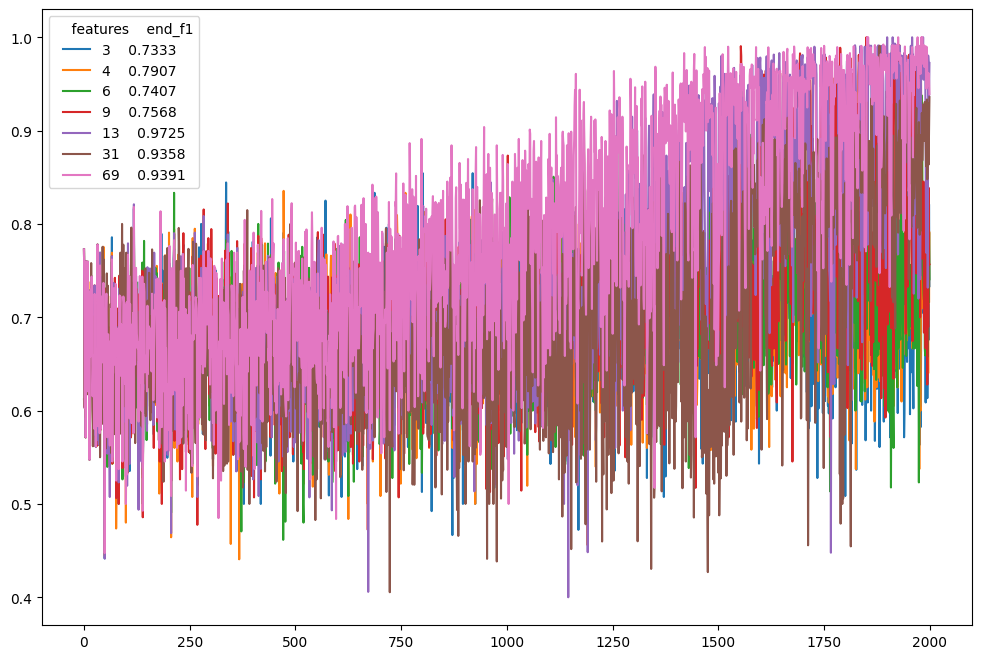

In [39]:
plt.figure(figsize=(12,8))

for i in range(len(ddqn_feat)):
    if i< 1:
        continue
    data = ddqn_feat["f1"][i]
    label = f"{ddqn_feat['feature_amount'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_f1")
plt.show()

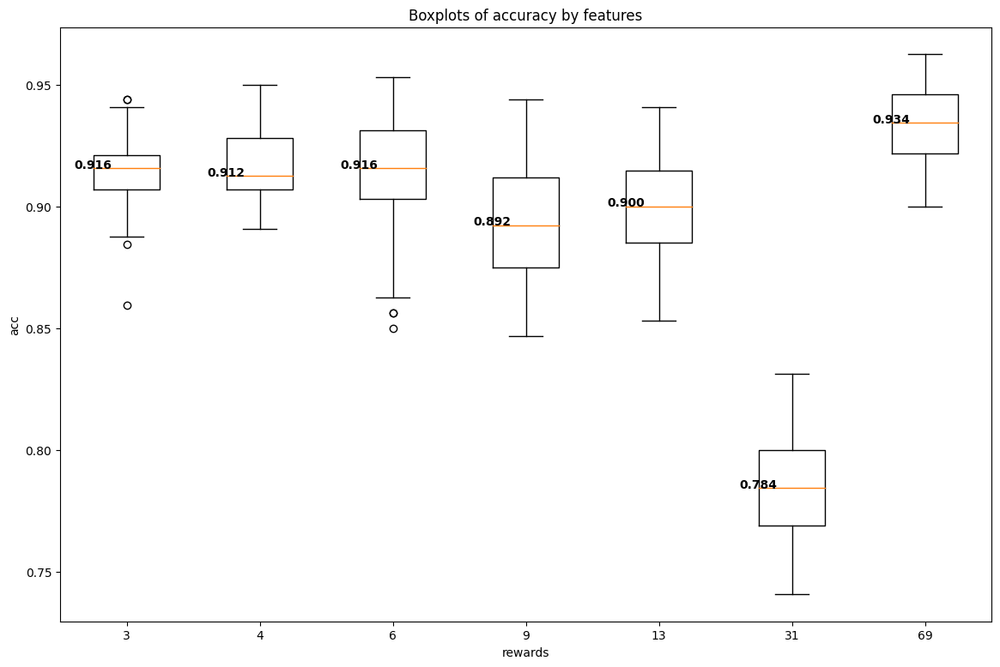

In [58]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(ddqn_feat)):
    if i == 0:
        continue
    fr2bpdata.append(ddqn_feat["accuracy"][i][-50:])
    fr2bplabels.append(f"{ddqn_feat['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('rewards')
plt.ylabel('acc')
plt.title('Boxplots of accuracy by features')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

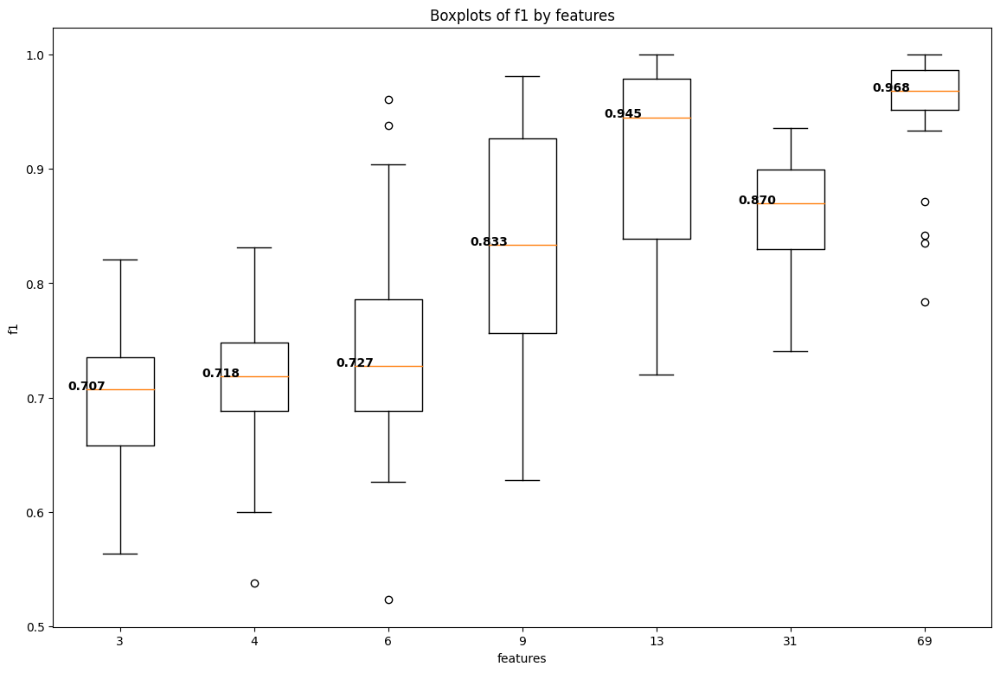

In [61]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(ddqn_feat)):
    if i == 0:
        continue
    fr2bpdata.append(ddqn_feat["f1"][i][-50:])
    fr2bplabels.append(f"{ddqn_feat['feature_amount'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('features')
plt.ylabel('f1')
plt.title('Boxplots of f1 by features')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

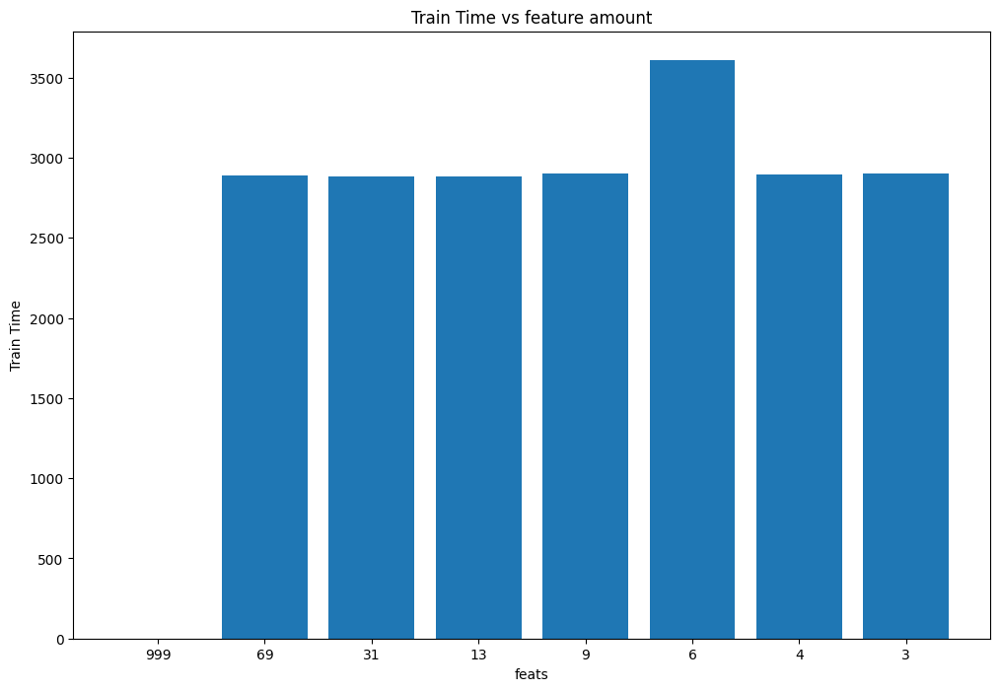

In [62]:
import matplotlib.pyplot as plt

# Extract data
feats = dqn_feat['feature_amount'].astype(str)

traintime = dqn_feat['traintime']

# Plot data
fig, ax = plt.subplots(figsize=(12, 8))
ax.bar(feats , traintime)

# Set labels and title
ax.set_xlabel('feats')
ax.set_ylabel('Train Time')
ax.set_title('Train Time vs feature amount')

plt.show()

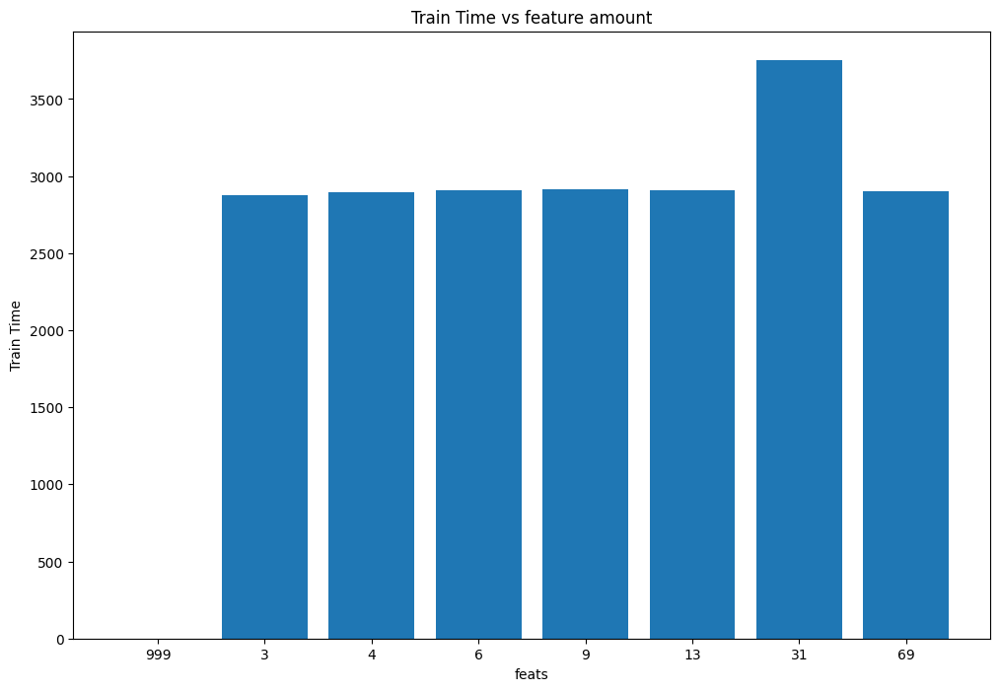

In [63]:
import matplotlib.pyplot as plt

# Extract data
feats = ddqn_feat['feature_amount'].astype(str)

traintime = ddqn_feat['traintime']

# Plot data
fig, ax = plt.subplots(figsize=(12, 8))
ax.bar(feats , traintime)

# Set labels and title
ax.set_xlabel('feats')
ax.set_ylabel('Train Time')
ax.set_title('Train Time vs feature amount')

plt.show()

In [64]:
ddqn_feat['traintime']

0       0.000000
1    2879.047131
2    2891.997809
3    2905.404547
4    2916.571983
5    2910.679738
6    3751.724462
7    2903.706180
Name: traintime, dtype: float64

In [66]:
dqn_feat['traintime']

0       0.000000
1    2891.544568
2    2885.740668
3    2882.422409
4    2904.308386
5    3608.999870
6    2895.443056
7    2901.348135
Name: traintime, dtype: float64

In [2]:
df5k = pd.read_feather("5000e_results.feather")

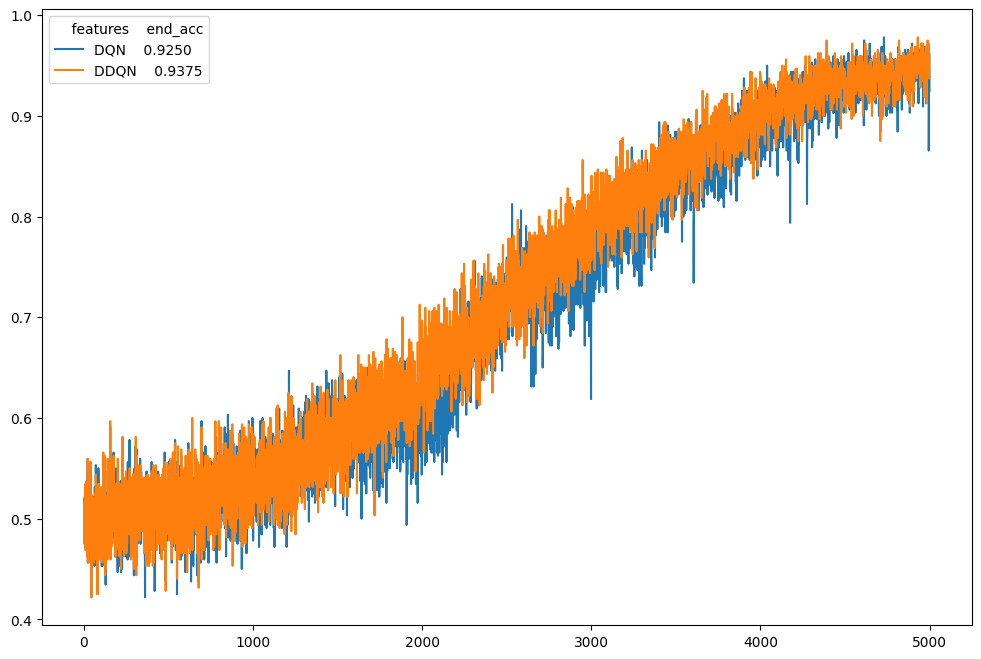

In [5]:
plt.figure(figsize=(12,8))

for i in range(len(df5k)):
    if i< 1:
        continue
    data = df5k["accuracy"][i]
    label = f"{df5k['prep'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_acc")
plt.show()

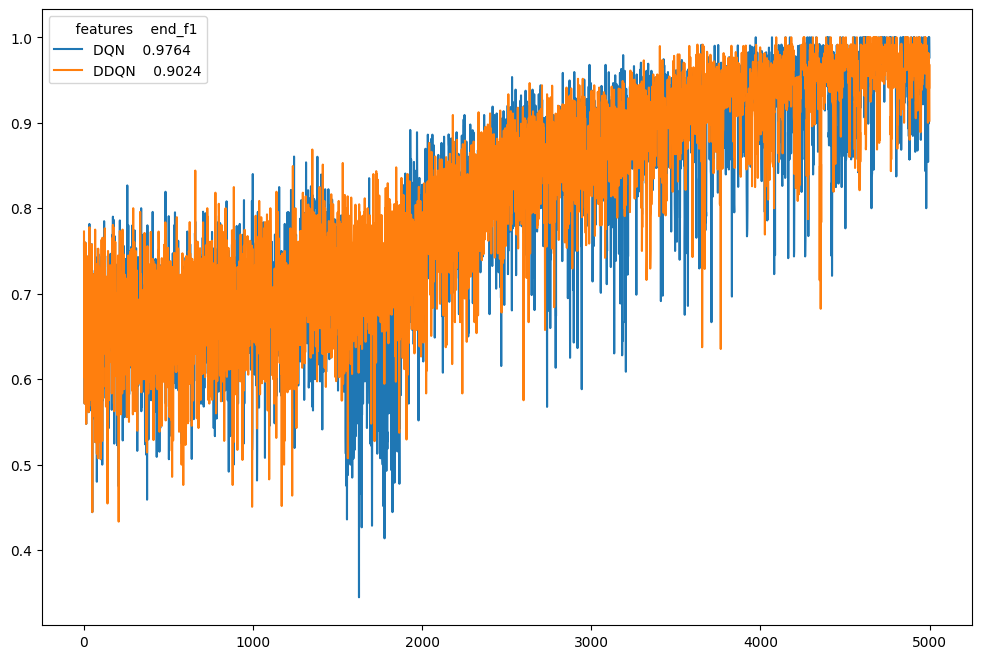

In [9]:
plt.figure(figsize=(12,8))

for i in range(len(df5k)):
    if i< 1:
        continue
    data = df5k["f1"][i]
    label = f"{df5k['prep'][i]}    {data[-1]:.4f}"
    plt.plot(data, label=label)
#acc09 =ferdf["progress"][4]

#plt.plot(acc095, label='0.95')
#plt.plot(acc09, label='0.9')
plt.legend(title="    features    end_f1")
plt.show()

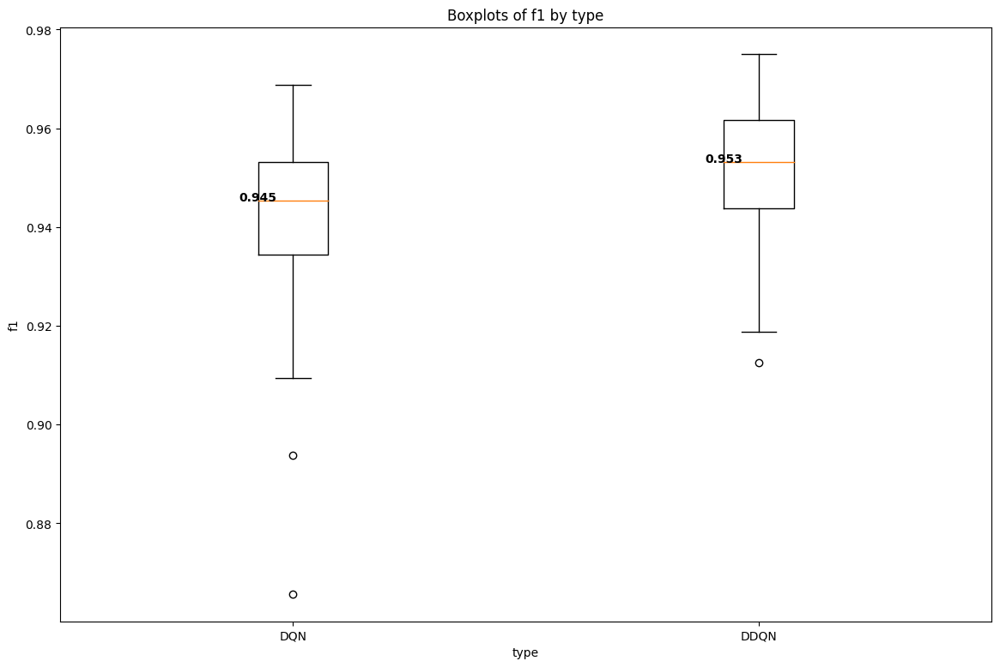

In [8]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(df5k)):
    if i == 0:
        continue
    fr2bpdata.append(df5k["accuracy"][i][-50:])
    fr2bplabels.append(f"{df5k['prep'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('type')
plt.ylabel('accuracy')
plt.title('Boxplots of accuracy by type')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

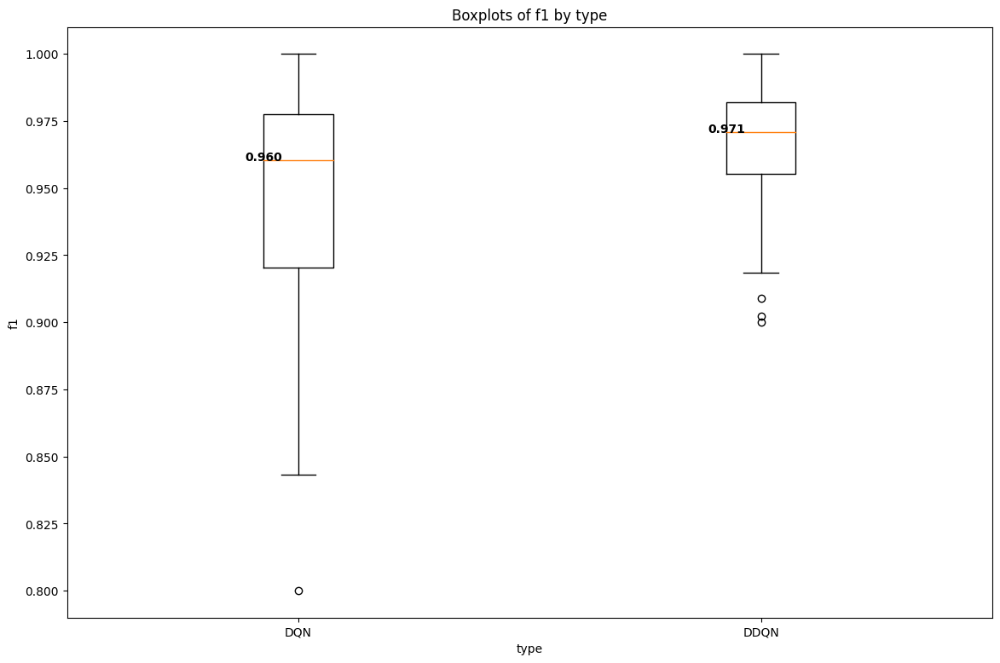

In [10]:
plt.figure(figsize=(14,9))

fr2bpdata = []
fr2bplabels = []

for i in range(len(df5k)):
    if i == 0:
        continue
    fr2bpdata.append(df5k["f1"][i][-50:])
    fr2bplabels.append(f"{df5k['prep'][i]}")

bp = plt.boxplot(fr2bpdata, labels=fr2bplabels)

plt.xlabel('type')
plt.ylabel('f1')
plt.title('Boxplots of f1 by type')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

In [1]:
# Testing Different structures for multi Agent
import pandas as pd
sdf = pd.read_feather("results/structure_results.feather")

In [102]:
sdf

,structure,accuracy,precision,recall,f1,traintime,episodes
0,temp,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,999
1,1 DQN5k,"[0.95, 0.95625, 0.959375, 0.953125, 0.953125, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.9464285714285714, 0.8979591836734694, 0.882...","[0.9724770642201834, 0.9462365591397849, 0.937...",37.600428,50
2,1 DQN10k,"[0.925, 0.94375, 0.934375, 0.95625, 0.925, 0.9...","[1.0, 1.0, 0.9814814814814815, 1.0, 1.0, 1.0, ...","[0.9833333333333333, 1.0, 0.9464285714285714, ...","[0.9915966386554621, 1.0, 0.9636363636363636, ...",58.691092,50
3,DDQN5k,"[0.95, 0.946875, 0.928125, 0.903125, 0.915625,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.8235294117647058, 0.7966101694915254, 0.733...","[0.9032258064516129, 0.8867924528301886, 0.846...",82.363029,50
4,DDQN10k,"[0.965625, 0.978125, 0.94375, 0.940625, 0.95, ...","[0.9836065573770492, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.9523809523809523, 0.9423076923076923, 0.859...","[0.9677419354838709, 0.9702970297029703, 0.924...",81.278684,50
5,DDQN20k,"[0.975, 0.953125, 0.9375, 0.9625, 0.971875, 0....","[1.0, 0.9803921568627451, 1.0, 1.0, 1.0, 1.0, ...","[0.9827586206896551, 0.9615384615384616, 0.909...","[0.9913043478260869, 0.970873786407767, 0.9523...",40.808277,50
6,DD/DQN10k else 1,"[0.928125, 0.90625, 0.903125, 0.928125, 0.9281...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.9428571428571428, 0.9795918367346939, 0.980...","[0.9705882352941176, 0.9896907216494846, 0.990...",37.553638,50
7,DD/DQN10k else random,"[0.934375, 0.965625, 0.946875, 0.915625, 0.95,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.9148936170212766, 0.9795918367346939, 0.944...","[0.9555555555555556, 0.9896907216494846, 0.971...",37.566019,50
8,DQN5/DQN10/20 acc,"[0.959375, 0.971875, 0.971875, 0.959375, 0.953...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.9354838709677419, 0.9836065573770492, 0.956...","[0.9666666666666666, 0.9917355371900827, 0.977...",55.130568,50
9,DQN5/10/DDQN20 f1,"[0.95625, 0.9625, 0.95625, 0.928125, 0.9625, 0...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[0.9354838709677419, 0.98, 0.9642857142857143,...","[0.9666666666666666, 0.98989898989899, 0.98181...",59.503401,50


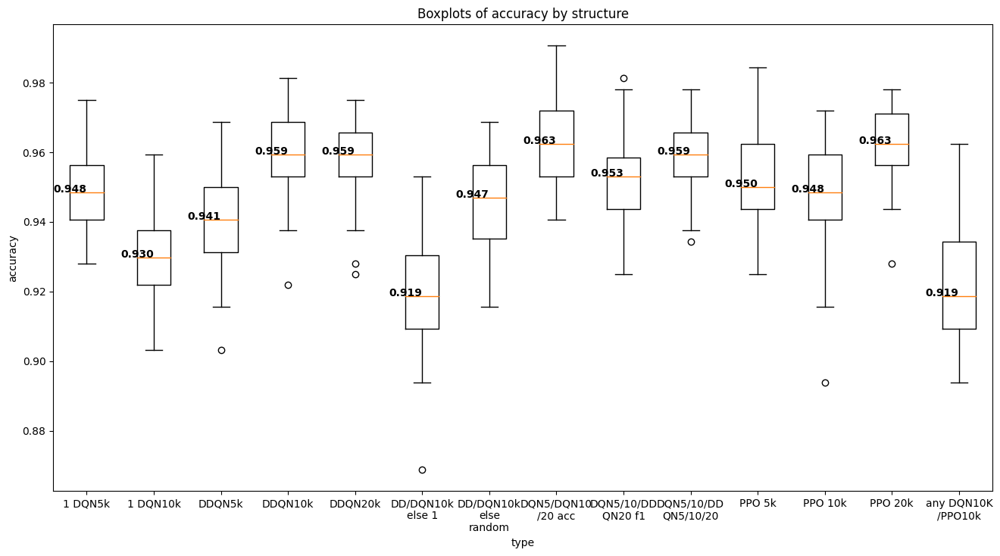

In [51]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(sdf)):
    if i == 0:
        continue
    sdfbpdata.append(sdf["accuracy"][i])
    sdfbplabels.append(f"{sdf['structure'][i]}")

sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('accuracy')
plt.title('Boxplots of accuracy by structure')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

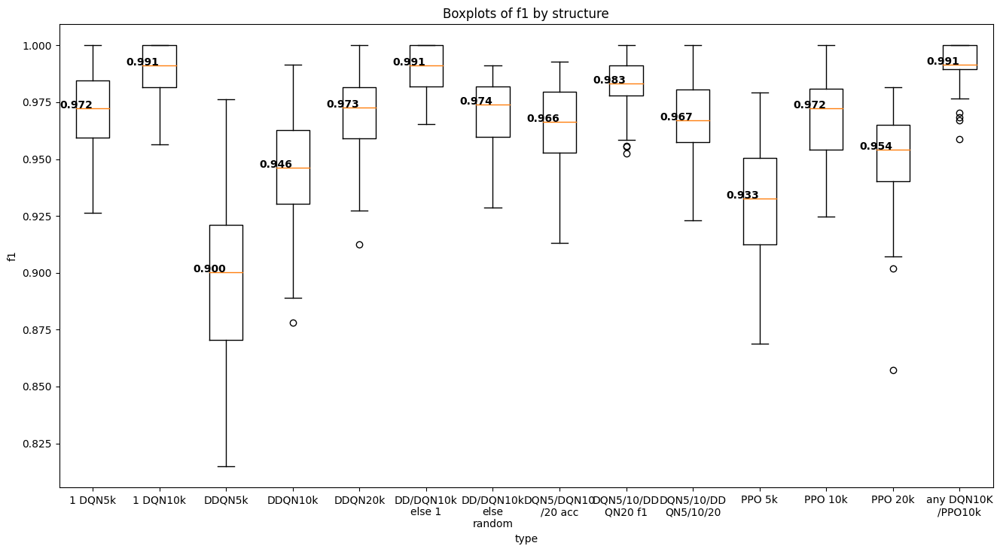

In [52]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(sdf)):
    if i == 0:
        continue
    sdfbpdata.append(sdf["f1"][i])
    sdfbplabels.append(f"{sdf['structure'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('f1')
plt.title('Boxplots of f1 by structure')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

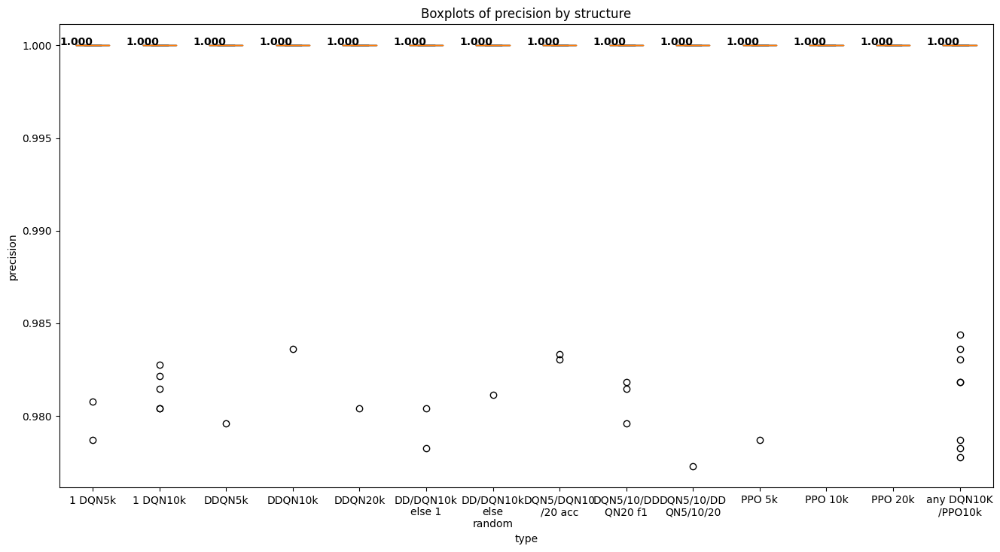

In [53]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(sdf)):
    if i == 0:
        continue
    sdfbpdata.append(sdf["precision"][i])
    sdfbplabels.append(f"{sdf['structure'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('precision')
plt.title('Boxplots of precision by structure')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')

plt.show()

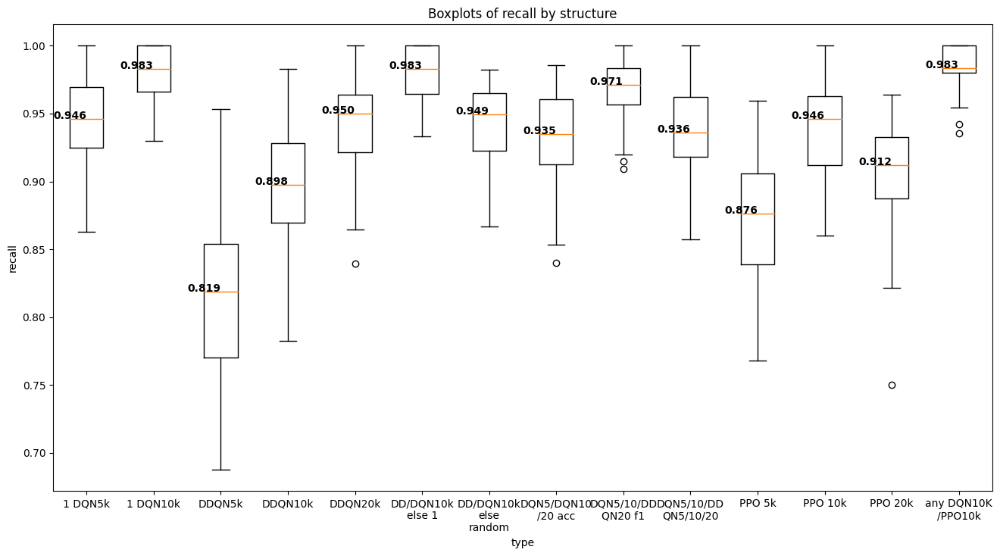

In [54]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(sdf)):
    if i == 0:
        continue
    sdfbpdata.append(sdf["recall"][i])
    sdfbplabels.append(f"{sdf['structure'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('recall')
plt.title('Boxplots of recall by structure')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')


In [49]:
sdf["traintime"]

0     0.000000
1    37.600428
2    58.691092
3    82.363029
4    81.278684
5    40.808277
6    37.553638
7    37.566019
8    55.130568
9    59.503401
Name: traintime, dtype: float64

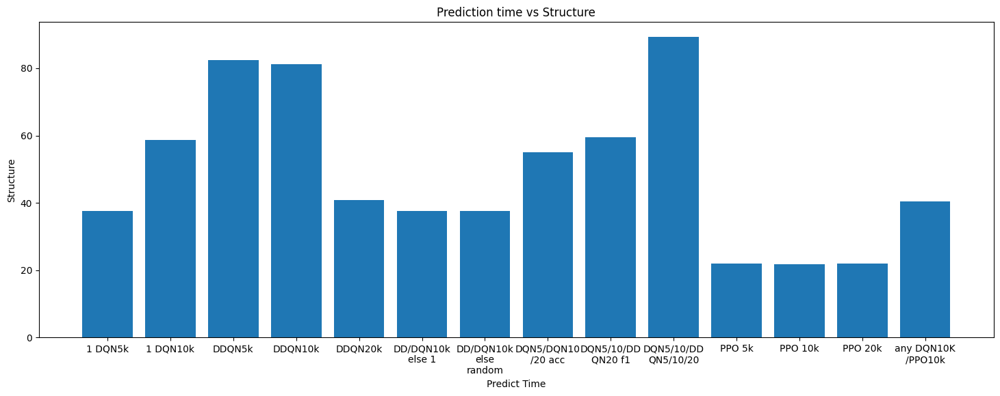

In [2]:
import matplotlib.pyplot as plt
from textwrap import wrap

 
x =[ '\n'.join(wrap(l, 10)) for l in sdf.structure ]

plt.figure(figsize=(18,6))
plt.bar(x[1:], sdf.traintime[1:])
plt.xlabel('Predict Time')
plt.ylabel('Structure')
plt.title('Prediction time vs Structure')

plt.show()

In [32]:
femk = pd.read_feather("results/5000e_results.feather")
tiok = pd.read_feather("results/10000e_results.feather")
tjugok = pd.read_feather("results/20000e_results.feather")

In [33]:
df_list = [femk, tiok, tjugok]

In [34]:
dataset = pd.concat(df_list, ignore_index=True)

In [35]:
dataset["traintime"]

0         0.000000
1     10479.437704
2      7197.136105
3      2386.405061
4      2356.430067
5         0.000000
6     14662.739996
7     15623.805360
8      4792.264602
9         0.000000
10    42632.716168
11     9460.097463
Name: traintime, dtype: float64

In [36]:
dataset.drop([0,3,5,9], inplace=True)

In [38]:
dataset.loc[6, 'prep'] = "DQN"

In [37]:
dataset.traintime

1     10479.437704
2      7197.136105
4      2356.430067
6     14662.739996
7     15623.805360
8      4792.264602
10    42632.716168
11     9460.097463
Name: traintime, dtype: float64

In [79]:
dataset.head()

,epsilon,decay,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,endepsilon,reward,penalty,atk_reward,atk_pen,learnrate,feature_amount,prep
1,0.999,0.996,3,16,"[0.51875, 0.50625, 0.4875, 0.475, 0.478125, 0....","[0.9705882352941176, 1.0, 1.0, 1.0, 0.96296296...","[0.6226415094339622, 0.5348837209302325, 0.450...","[0.7586206896551724, 0.6969696969696969, 0.621...",10479.437704,5000,9.869604e-08,1,-10,1,-25,0.001,69,DQN
2,0.999,0.996,3,16,"[0.515625, 0.50625, 0.484375, 0.475, 0.478125,...","[0.9714285714285714, 1.0, 0.9565217391304348, ...","[0.6415094339622641, 0.5454545454545454, 0.44,...","[0.7727272727272727, 0.7058823529411764, 0.602...",7197.136105,5000,9.869604e-08,1,-10,1,-25,0.001,69,DDQN
4,0.999,0.996,3,16,"[0.5125, 0.50625, 0.484375, 0.475, 0.478125, 0...","[0.9705882352941176, 1.0, 0.9565217391304348, ...","[0.6226415094339622, 0.5454545454545454, 0.44,...","[0.7586206896551724, 0.7058823529411764, 0.602...",14662.739996,10000,2.467401e-08,1,-10,1,-25,0.001,69,DDQN
5,0.999,0.996,3,16,"[0.528125, 0.50625, 0.4875, 0.475, 0.478125, 0...","[0.9714285714285714, 1.0, 1.0, 1.0, 0.96296296...","[0.6415094339622641, 0.5348837209302325, 0.450...","[0.7727272727272727, 0.6969696969696969, 0.621...",15623.805360,10000,2.467401e-08,1,-10,1,-25,0.001,69,DDQN
7,0.999,0.996,3,16,"[0.5125, 0.50625, 0.4875, 0.475, 0.478125, 0.5...","[0.1952662721893491, 0.14285714285714285, 0.14...","[0.6226415094339622, 0.5348837209302325, 0.450...","[0.2972972972972973, 0.22549019607843135, 0.21...",42632.716168,20000,6.168503e-09,1,-10,1,-25,0.001,69,DDQN


['DQN 5000', 'DDQN 5000', 'PPO 5000', 'DQN 10000', 'DDQN 10000', 'PPO 10000', 'DDQN 20000', 'PPO 20000']


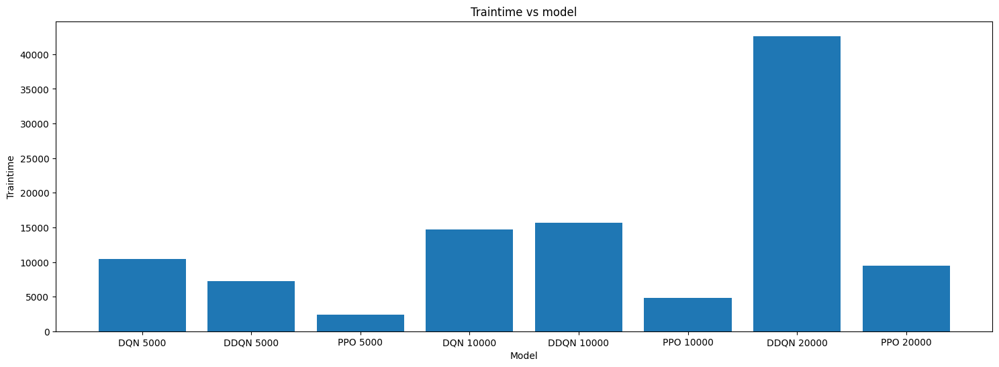

In [39]:
import matplotlib.pyplot as plt
from textwrap import wrap
import random
 
x = [prep + " " + str(episode) for prep, episode in zip(dataset.prep, dataset.episodes)]
print(x)
plt.figure(figsize=(18,6))
plt.bar(x, dataset.traintime)
plt.xlabel('Model')
plt.ylabel('Traintime')
plt.title('Traintime vs model')

plt.show()

In [3]:
pdf = pd.read_feather("results/PPO_results.feather")

In [11]:
pdf

,layers,neurons,accuracy,precision,recall,f1,traintime,episodes,feature_amount,pen,clip,crit_discount,note
0,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",0.000000,1,999,0.0,0.0,0.0,norm
1,3,16,"[0.5875, 0.546875, 0.58125, 0.571875, 0.565625...","[0.16, 0.18571428571428572, 0.1782945736434108...","[0.425531914893617, 0.45614035087719296, 0.450...","[0.23255813953488375, 0.2639593908629442, 0.25...",945.490707,2000,69,-25.0,0.2,0.5,
2,3,16,"[0.55625, 0.56875, 0.528125, 0.5375, 0.5375, 0...","[0.16312056737588654, 0.18110236220472442, 0.1...","[0.48936170212765956, 0.40350877192982454, 0.4...","[0.2446808510638298, 0.25, 0.22564102564102567...",938.231084,2000,69,-100.0,0.2,0.5,
3,3,16,"[0.534375, 0.5125, 0.528125, 0.5125, 0.528125,...","[0.13043478260869565, 0.14388489208633093, 0.1...","[0.3829787234042553, 0.3508771929824561, 0.411...","[0.19459459459459458, 0.2040816326530612, 0.21...",952.302210,2000,69,-50.0,0.2,0.5,100atkr
4,3,16,"[0.596875, 0.571875, 0.60625, 0.4875, 0.54375,...","[0.1796875, 0.21428571428571427, 0.23021582733...","[0.48936170212765956, 0.5263157894736842, 0.62...","[0.2628571428571429, 0.3045685279187817, 0.336...",939.944518,2000,69,-100.0,0.2,0.5,100atkr
5,3,16,"[0.578125, 0.559375, 0.503125, 0.515625, 0.55,...","[0.16153846153846155, 0.22, 0.1493506493506493...","[0.44680851063829785, 0.5789473684210527, 0.45...","[0.23728813559322037, 0.3188405797101449, 0.22...",931.277855,2000,69,-20.0,0.2,0.5,20/20
6,3,16,"[0.51875, 0.534375, 0.571875, 0.525, 0.528125,...","[0.1310344827586207, 0.14615384615384616, 0.15...","[0.40425531914893614, 0.3333333333333333, 0.37...","[0.1979166666666667, 0.20320855614973263, 0.21...",930.583523,2000,69,-25.0,0.2,0.5,5/25


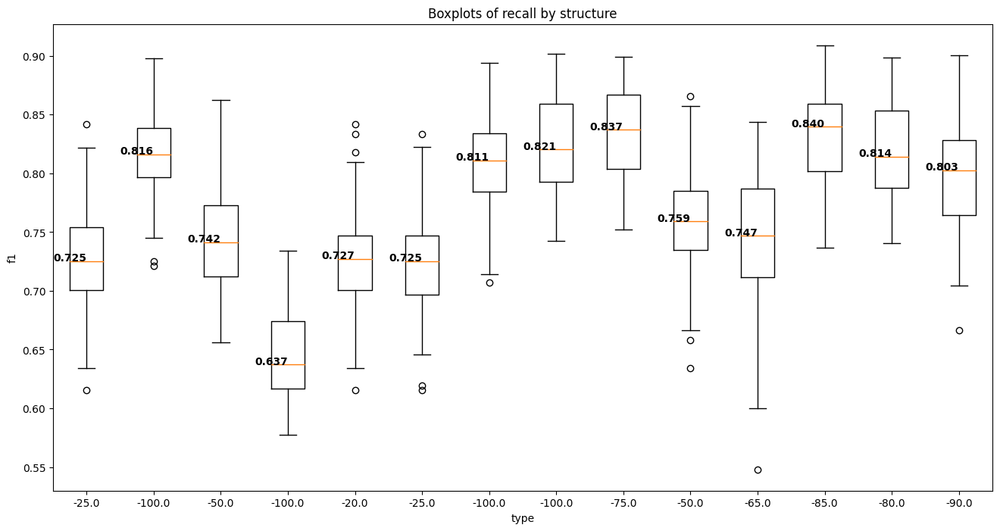

In [4]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(pdf)):
    if i == 0:
        continue
    sdfbpdata.append(pdf["f1"][i][-50:])
    sdfbplabels.append(f"{pdf['pen'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('f1')
plt.title('Boxplots of recall by structure')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')


In [5]:
pdf = pd.read_feather("results/PPO_loss_results.feather")

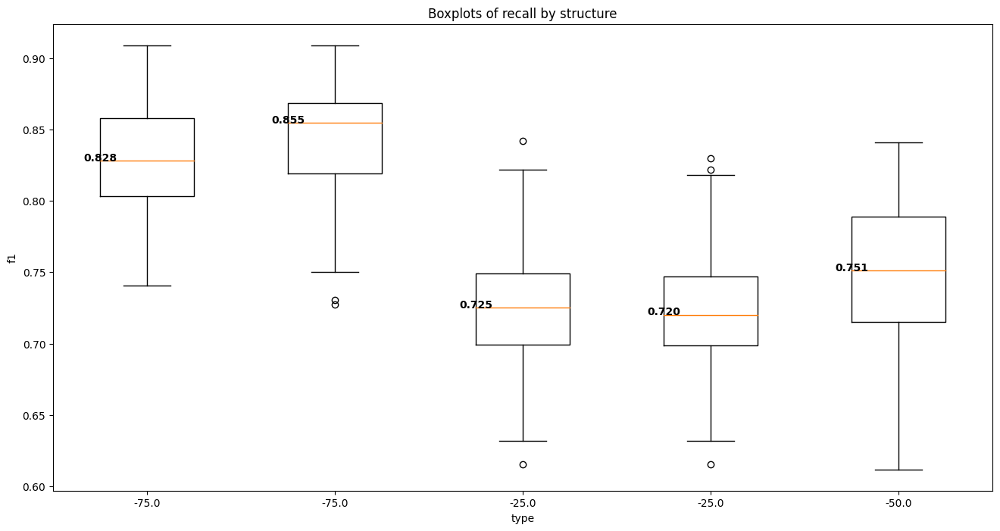

In [6]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(pdf)):
    if i == 0:
        continue
    sdfbpdata.append(pdf["f1"][i][-50:])
    sdfbplabels.append(f"{pdf['note'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('f1')
plt.title('Boxplots of recall by structure')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')


In [41]:
pdf = pd.read_feather("results/PPO_clip_results.feather")

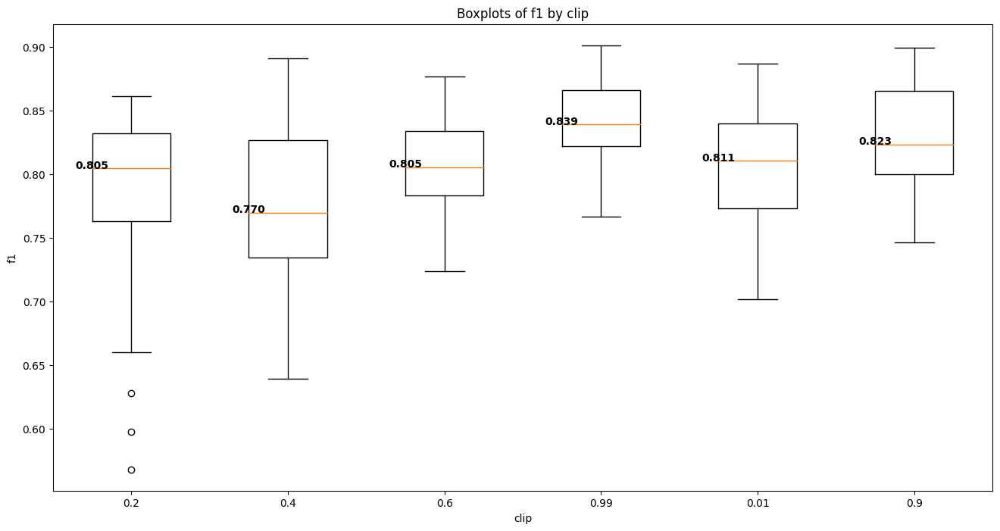

In [42]:
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(pdf)):
    if i == 0:
        continue
    sdfbpdata.append(pdf["f1"][i][-50:])
    sdfbplabels.append(f"{pdf['clip'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('clip')
plt.ylabel('f1')
plt.title('Boxplots of f1 by clip')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')


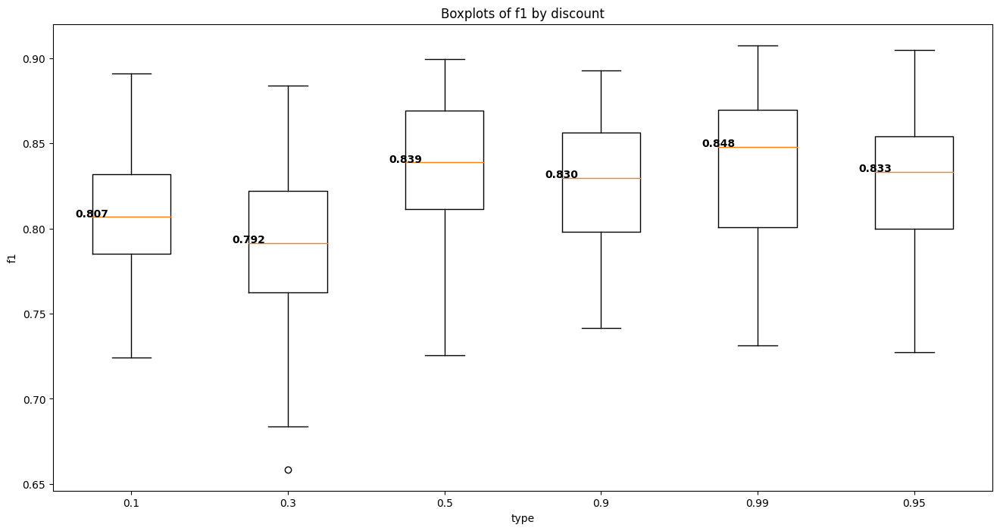

In [45]:
pdf = pd.read_feather("results/PPO_discount_results.feather")
plt.figure(figsize=(16,8))

sdfbpdata = []
sdfbplabels = []

for i in range(len(pdf)):
    if i == 0:
        continue
    sdfbpdata.append(pdf["f1"][i][-50:])
    sdfbplabels.append(f"{pdf['crit_discount'][i]}")

    
sdfbplabels = x =[ '\n'.join(wrap(l, 10)) for l in sdfbplabels]
    
bp = plt.boxplot(sdfbpdata, labels=sdfbplabels)

plt.xlabel('type')
plt.ylabel('f1')
plt.title('Boxplots of f1 by discount')

# Add median text to the plot
for median in bp['medians']:
    median_x = median.get_xdata()
    median_y = median.get_ydata()
    plt.text(median_x[0], median_y[0], f"{median_y[0]:.3f}", horizontalalignment='center', fontsize=10, color='black', weight='bold')